# **Interpretable Machine Learning in Poverty Prediction**

In [1]:
# Install package

!pip install -U imbalanced-learn
!pip install mlxtend --upgrade 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 199 kB 8.5 MB/s 
     |████████████████████████████████| 199 kB 59.6 MB/s 
  Attempting uninstall: imbalanced-learn
    Found existing installation: imbalanced-learn 0.8.1
    Uninstalling imbalanced-learn-0.8.1:
      Successfully uninstalled imbalanced-learn-0.8.1
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.3 MB 8.5 MB/s 
  Attempting uninstall: mlxtend
    Found existing installation: mlxtend 0.14.0
    Uninstalling mlxtend-0.14.0:
      Successfully uninstalled mlxtend-0.14.0


### **Librairies**

In [2]:
# Import Librairies

import pandas as pd
import numpy as np
import matplotlib
import statsmodels.api as sm
import sklearn
from sklearn import linear_model
from matplotlib import pyplot as plt
import matplotlib.style as style
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn import svm
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
import xgboost as xgb
from sklearn.metrics import  confusion_matrix, accuracy_score
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
from sklearn.metrics import  precision_recall_curve, roc_auc_score, confusion_matrix, accuracy_score, recall_score, precision_score, f1_score,auc, roc_curve, plot_confusion_matrix
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

sns.set(color_codes=True)

%matplotlib inline

seed = 42

### **Decoding-renaiming data loading and reading**

In [3]:
# Displaying of the decoding-renaiming dataset

df_dec = pd.read_csv("df_dec.csv", sep =",")
df_dec.head()

,case_id,Household_id,region,district,area_code,TA_code,area,urban_rural,inter_day,inter_month,...,Total_nom_cons/capital,Total_real_cons/capital,Food_pov_line,Poverty_line,poor_status,ultra_poor_status,gap_poor,gap_ultra_poor,gap_sev_poor,gap_sev_ultra_poor
0,101011000014,7d78f2c5da59436d9bde9b09ea8a8aaf,North,Chitipa,10101100,10101,Rural North,RURAL,29,August,...,102056.007812,99918.367188,101293.426251,165878.859375,Poor,Ultra-poor,39.764256,1.357501,15.811960,0.018428
1,101011000023,7144cc6d29b3485d9e6d6188b255c756,North,Chitipa,10101100,10101,Rural North,RURAL,29,August,...,172945.156250,169322.718750,101293.426251,165878.859375,Non-poor,Non-ultra-poor,0.000000,0.000000,0.000000,0.000000
2,101011000040,9936d103bf974a93afbc63d477b8b3f2,North,Chitipa,10101100,10101,Rural North,RURAL,28,August,...,95647.656250,93644.257812,101293.426251,165878.859375,Poor,Ultra-poor,43.546600,7.551496,18.963062,0.570251
3,101011000071,cc8f211413cd493e83e01a96aba95bbb,North,Chitipa,10101100,10101,Rural North,RURAL,29,August,...,462444.437500,452758.093750,101293.426251,165878.859375,Non-poor,Non-ultra-poor,0.000000,0.000000,0.000000,0.000000
4,101011000095,e50cfa8d11b44d56891e0fad015b07c7,North,Chitipa,10101100,10101,Rural North,RURAL,28,August,...,187255.640625,183333.437500,101293.426251,165878.859375,Non-poor,Non-ultra-poor,0.000000,0.000000,0.000000,0.000000


In [4]:
# Number of observations and variables including the target

print(f"Number of observations: .............. {df_dec.shape[0]}") # Number of observations
print(f"Number of variables: ................. {df_dec.shape[1]} incl. target") # Number of variables or attributes
print(f"Number of duplicate entries: ......... {df_dec.duplicated().sum()}")

Number of observations: .............. 11434
Number of variables: ................. 71 incl. target
Number of duplicate entries: ......... 0


In [5]:
# Deleting unnecesary columns

df_dec = df_dec.drop(['case_id', 'Household_id', 'area_code', 'TA_code',
                 'inter_day', 'inter_month', 'inter_year'],  axis=1)

In [6]:
# Counting variables by type

df_dec.dtypes.value_counts(ascending=True)

int64       1
object      6
float64    57
dtype: int64

In [7]:
# Percentage of households surveyed by geographical distribution (region)

nummer = df_dec.region.value_counts().to_frame().rename(columns={"region":"Number of households per region"})
percent = (df_dec.region.value_counts(normalize=True)*100).to_frame().rename(columns={"region":"Percentage"})
num_per = pd.concat([nummer, percent],axis=1).round(decimals=2)
print("")
print(f"[North] Number of households surveyed in North : ....................{df_dec.region.value_counts()[0]}")
print(f"[Center] Number of households surveyed in Central : ................ {df_dec.region.value_counts()[1]}")
print(f"[South] Number of households surveyed in South  : .................. {df_dec.region.value_counts()[2]}")
print("")
display(num_per)


[North] Number of households surveyed in North : ....................5306
[Center] Number of households surveyed in Central : ................ 3952
[South] Number of households surveyed in South  : .................. 2176



,Number of households per region,Percentage
South,5306,46.41
Central,3952,34.56
North,2176,19.03


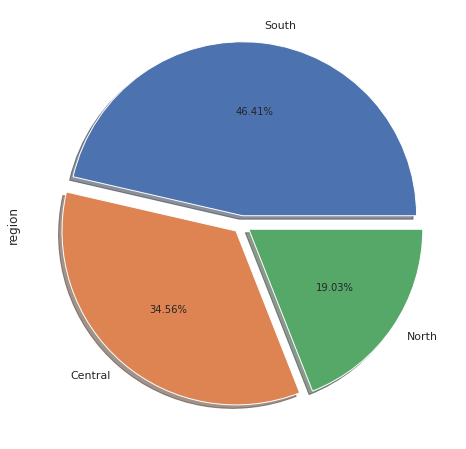

In [8]:
# Pie chart of Percentage of households surveyed by geographical distribution (region)

df_dec['region'].value_counts().plot.pie(explode=[0.05,0.05,0.05],autopct='%1.2f%%',shadow=True,figsize=(8,8))

#plt.title("Percentage of households surveyed by region")

plt.show()

In [9]:
# Define the Target column

col_target = df_dec[['poor_status', 'ultra_poor_status']]
col_target.head()

,poor_status,ultra_poor_status
0,Poor,Ultra-poor
1,Non-poor,Non-ultra-poor
2,Poor,Ultra-poor
3,Non-poor,Non-ultra-poor
4,Non-poor,Non-ultra-poor


In [10]:
# Define the target column with some multiple conditions

def val(row):
  if (row['poor_status'] == 'Poor') & (row['ultra_poor_status'] == 'Ultra-poor'):
    val = 'Ultra-poor'  
  elif (row['poor_status'] == 'Poor') & (row['ultra_poor_status'] == 'Non-ultra-poor'):
    val = 'Poor'
  else:
    val = 'Non-poor'
  return val

#Apply these conditions on the data to define the target variable column

df_dec['Target'] = df_dec.apply(val, axis = 1)

# Dropping 'poor_status' and 'ultra_poor'

df_dec = df_dec.drop(['poor_status', 'ultra_poor_status'],  axis=1)

In [11]:
df_dec.head()

,region,district,area,urban_rural,Household_size,Adult_equi,Household_Weight,Alcohol_cons,Resto_cons,Food_cons,...,Total_real_cons/household,Total_nom_cons/capital,Total_real_cons/capital,Food_pov_line,Poverty_line,gap_poor,gap_ultra_poor,gap_sev_poor,gap_sev_ultra_poor,Target
0,North,Chitipa,Rural North,RURAL,4,3.47,93.7194,0.000000,43172.375000,2.007816e+05,...,3.996735e+05,102056.007812,99918.367188,101293.426251,165878.859375,39.764256,1.357501,15.811960,0.018428,Ultra-poor
1,North,Chitipa,Rural North,RURAL,4,3.82,93.7194,0.000000,0.000000,3.662017e+05,...,6.772909e+05,172945.156250,169322.718750,101293.426251,165878.859375,0.000000,0.000000,0.000000,0.000000,Non-poor
2,North,Chitipa,Rural North,RURAL,4,2.67,93.7194,0.000000,0.000000,2.403571e+05,...,3.745770e+05,95647.656250,93644.257812,101293.426251,165878.859375,43.546600,7.551496,18.963062,0.570251,Ultra-poor
3,North,Chitipa,Rural North,RURAL,5,4.79,93.7194,169702.734375,12727.707031,1.675397e+06,...,2.263790e+06,462444.437500,452758.093750,101293.426251,165878.859375,0.000000,0.000000,0.000000,0.000000,Non-poor
4,North,Chitipa,Rural North,RURAL,5,4.31,93.7194,0.000000,0.000000,6.753428e+05,...,9.166672e+05,187255.640625,183333.437500,101293.426251,165878.859375,0.000000,0.000000,0.000000,0.000000,Non-poor


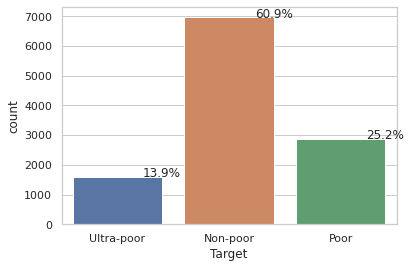

Class = Ultra-poor, Count = 1589, Percentage  = 13.897%
Class = Non-poor, Count = 6966, Percentage  = 60.924%
Class = Poor, Count = 2879, Percentage  = 25.179%


In [12]:
# Target visualization

sns.set(style="whitegrid")
plt.figure(figsize=(6,4))
total = float(len(df_dec))
ax = sns.countplot(x="Target", data=df_dec)

#plt.title('Distribution of Target by classes', fontsize=12)

for p in ax.patches:
  percentage = '{:.1f}%'.format(100 * p.get_height()/total)
  x = p.get_x() + p.get_width()
  y = p.get_height()
  ax.annotate(percentage, (x, y), ha='center')
plt.show()

# summarize the class distribution

from collections import Counter
target = df_dec.values[:, -1]
counter = Counter(target)
for k,v in counter.items():
	per = v / len(target) * 100
	print('Class = %s, Count = %d, Percentage  = %.3f%%' % (k, v, per))

In [13]:
# Number of poor, non-poor and ultra-poor households 

nummer = df_dec.Target.value_counts().to_frame().rename(columns={"Target":"Number of households"})
percent = (df_dec.Target.value_counts(normalize=True)*100).to_frame().rename(columns={"Target":"Percentage"})
num_per = pd.concat([nummer, percent],axis=1).round(decimals=2)
print("")
print(f"[Non-poor] Number of households that are Non-poor: .........{df_dec.Target.value_counts()[0]}")
print(f"[Poor] Number of households that are Poor: ................ {df_dec.Target.value_counts()[1]}")
print(f"[Ultra-poor] Number of households that are Ultra-poor : ... {df_dec.Target.value_counts()[2]}")
print("")
display(num_per)


[Non-poor] Number of households that are Non-poor: .........6966
[Poor] Number of households that are Poor: ................ 2879
[Ultra-poor] Number of households that are Ultra-poor : ... 1589



,Number of households,Percentage
Non-poor,6966,60.92
Poor,2879,25.18
Ultra-poor,1589,13.90


The class distribution is then summarized, confirming a modest class imbalance with approximately 61% for the majority class (Non-poor), approximately 14% and 25% for the minority classes (Ultra-poor and Poor). the dataset is imbalanced. From the above representation, it can be seen that the data are not balanced. So we will use the SMOTE (Synthetic Minority Over-sampling Technique) method to balance the data.

### **Status of surveyed households by urban and rural area distribution**

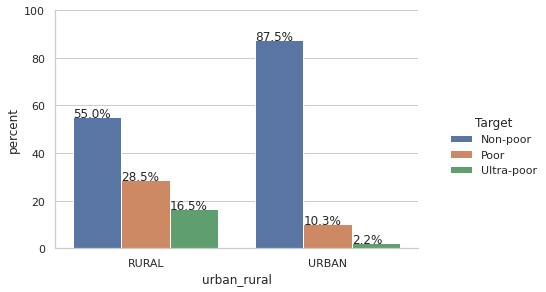

In [14]:
# Target by urban and rural area visualization

x, y = 'urban_rural','Target'
df1 = df_dec.groupby(x)[y].value_counts(normalize=True)
df1 = df1.mul(100)
df1 = df1.rename('percent').reset_index()

g = sns.catplot(x=x, y='percent', hue=y, kind='bar', data=df1)
g.ax.set_ylim(0,100)
g.fig.set_size_inches(8,4)

for p in g.ax.patches:
  txt = str(p.get_height().round(1)) + '%'
  txt_x = p.get_x()
  txt_y = p.get_height()
  g.ax.text(txt_x, txt_y, txt)

In [15]:
# Detecting missing values

display(df_dec.isnull().sum())
print("")
print(f"Are there any missing values? {df_dec.isnull().values.any()}")# Detecting missing values

region                0
district              0
area                  0
urban_rural           0
Household_size        0
                     ..
gap_poor              0
gap_ultra_poor        0
gap_sev_poor          0
gap_sev_ultra_poor    0
Target                0
Length: 63, dtype: int64


Are there any missing values? False


The data do not contain any missing values.

In [16]:
# Data informations 

df_dec.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11434 entries, 0 to 11433
Data columns (total 63 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   region                     11434 non-null  object 
 1   district                   11434 non-null  object 
 2   area                       11434 non-null  object 
 3   urban_rural                11434 non-null  object 
 4   Household_size             11434 non-null  int64  
 5   Adult_equi                 11434 non-null  float64
 6   Household_Weight           11434 non-null  float64
 7   Alcohol_cons               11434 non-null  float64
 8   Resto_cons                 11434 non-null  float64
 9   Food_cons                  11434 non-null  float64
 10  Education_cons             11434 non-null  float64
 11  Health_drugs_cons          11434 non-null  float64
 12  Healthout-pat_cons         11434 non-null  float64
 13  Health_hosp_cons           11434 non-null  flo

In [17]:
# Counting variables by type

df_dec.dtypes.value_counts(ascending=True)

int64       1
object      5
float64    57
dtype: int64

### **Descriptive statistics of variables**

In [18]:
# General statistics of variables

df_dec.describe().T

,count,mean,std,min,25%,50%,75%,max
Household_size,11434.0,4.414553e+00,2.090681e+00,1.000000,3.000000,4.000000,6.000000e+00,2.200000e+01
Adult_equi,11434.0,3.828253e+00,1.793170e+00,0.970000,2.470000,3.585000,4.910000e+00,2.050000e+01
Household_Weight,11434.0,3.605652e+02,2.264260e+02,22.499932,180.170802,323.803340,4.763663e+02,1.855511e+03
Alcohol_cons,11434.0,8.459354e+03,4.634547e+04,0.000000,0.000000,0.000000,0.000000e+00,1.258649e+06
Resto_cons,11434.0,9.838182e+03,1.772614e+04,0.000000,0.000000,0.000000,1.324051e+04,2.234197e+05
Food_cons,11434.0,5.366056e+05,3.509207e+05,0.000000,289929.343750,449922.625000,6.823618e+05,3.948635e+06
Education_cons,11434.0,3.586650e+04,1.536228e+05,0.000000,0.000000,5285.312988,1.688940e+04,4.750522e+06
Health_drugs_cons,11434.0,5.154454e+03,1.064303e+04,0.000000,0.000000,0.000000,5.764934e+03,1.663748e+05
Healthout-pat_cons,11434.0,7.089354e+03,2.619151e+04,0.000000,0.000000,0.000000,0.000000e+00,5.228998e+05
Health_hosp_cons,11434.0,2.113480e+03,7.573929e+03,0.000000,0.000000,0.000000,0.000000e+00,1.146680e+05


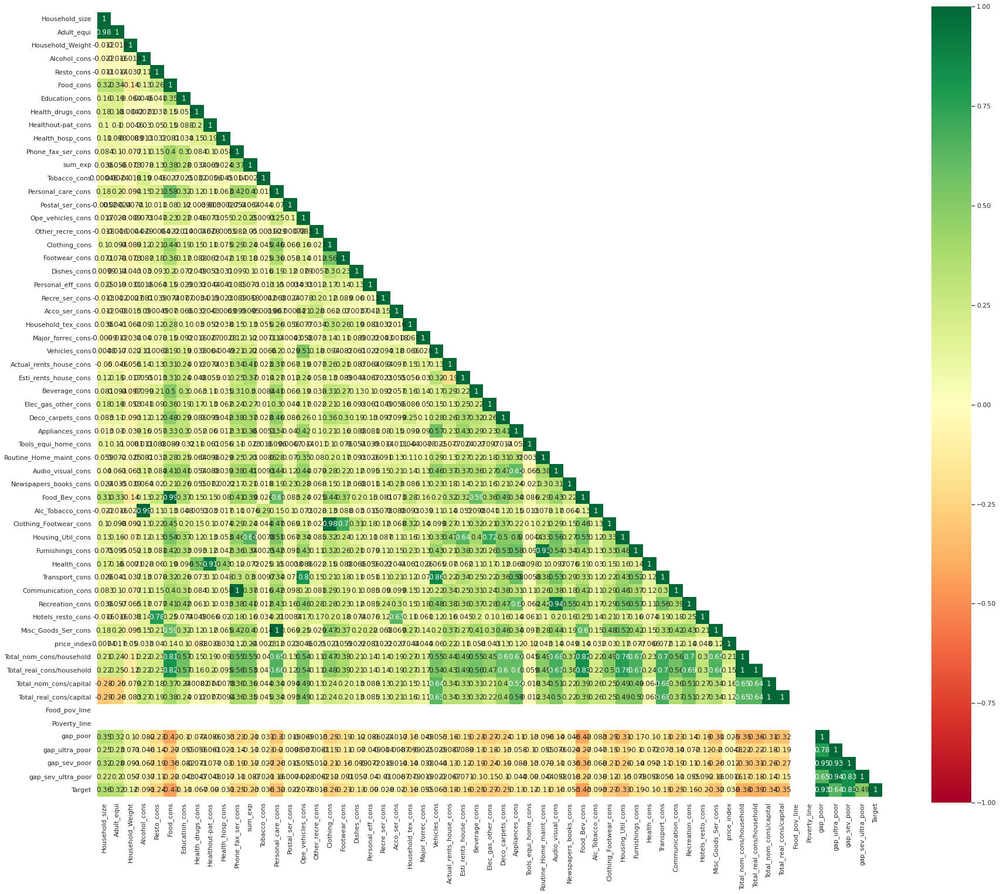

In [19]:
# select columns with numerical data types

num_data = df_dec.select_dtypes(include=['int64', 'float64']).columns

#select a subset of the data with the chosen columns

num_df = df_dec[num_data]

#mapping the target variable to have the classes 0, 1 and 2

num_df['Target'] = df_dec['Target'].map({'Poor': 1, 'Ultra-poor': 2, 'Non-poor': 0}).astype(int)

# Correlation Visualization by plotting Heatmap

mask = np.triu(num_df.corr(), 1)
plt.figure(figsize=(30, 25))
sns.heatmap(num_df.corr(), annot=True, square=True, cmap="RdYlGn", mask=mask, vmax=1, vmin = -1);

### **Outliers detection**

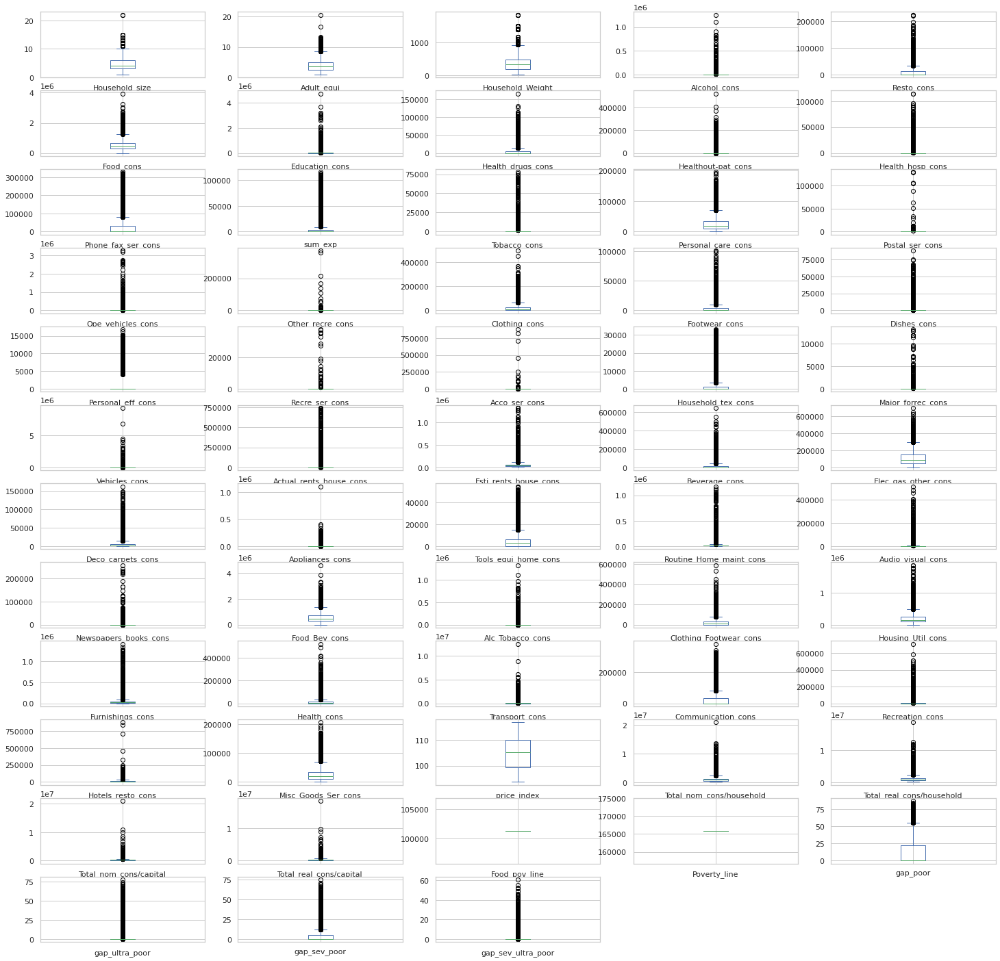

In [20]:
# Removing target and making a copy

data_cop = num_df.drop(["Target"], axis=1).copy()

# Boxplot

data_cop.plot(kind = "box", figsize=(25,25), layout = (12,5), sharex=False, subplots=True);

In [21]:
# Checking the Percent of Outliers

for column in data_cop.columns:
    median = data_cop[column].quantile()
    iqr_1_5 = (data_cop[column].quantile(q = 0.75) - data_cop[column].quantile(q = 0.25)) * 1.5
    outliers = data_cop[(data_cop[column]< median - iqr_1_5) | (data_cop[column] > median + iqr_1_5)][column].count()
    outliers_percent = round(outliers / data_cop[column].count() * 100, 1)
    print("'{}' = {} ({}%) outliers".format(column, outliers, outliers_percent))

'Household_size' = 385 (3.4%) outliers
'Adult_equi' = 456 (4.0%) outliers
'Household_Weight' = 677 (5.9%) outliers
'Alcohol_cons' = 1015 (8.9%) outliers
'Resto_cons' = 1946 (17.0%) outliers
'Food_cons' = 996 (8.7%) outliers
'Education_cons' = 1914 (16.7%) outliers
'Health_drugs_cons' = 2088 (18.3%) outliers
'Healthout-pat_cons' = 1735 (15.2%) outliers
'Health_hosp_cons' = 1698 (14.9%) outliers
'Phone_fax_ser_cons' = 2042 (17.9%) outliers
'sum_exp' = 2629 (23.0%) outliers
'Tobacco_cons' = 407 (3.6%) outliers
'Personal_care_cons' = 1133 (9.9%) outliers
'Postal_ser_cons' = 26 (0.2%) outliers
'Ope_vehicles_cons' = 1739 (15.2%) outliers
'Other_recre_cons' = 22 (0.2%) outliers
'Clothing_cons' = 1545 (13.5%) outliers
'Footwear_cons' = 2291 (20.0%) outliers
'Dishes_cons' = 1622 (14.2%) outliers
'Personal_eff_cons' = 434 (3.8%) outliers
'Recre_ser_cons' = 46 (0.4%) outliers
'Acco_ser_cons' = 34 (0.3%) outliers
'Household_tex_cons' = 2504 (21.9%) outliers
'Major_forrec_cons' = 165 (1.4%) outlier

### **Data visualization**

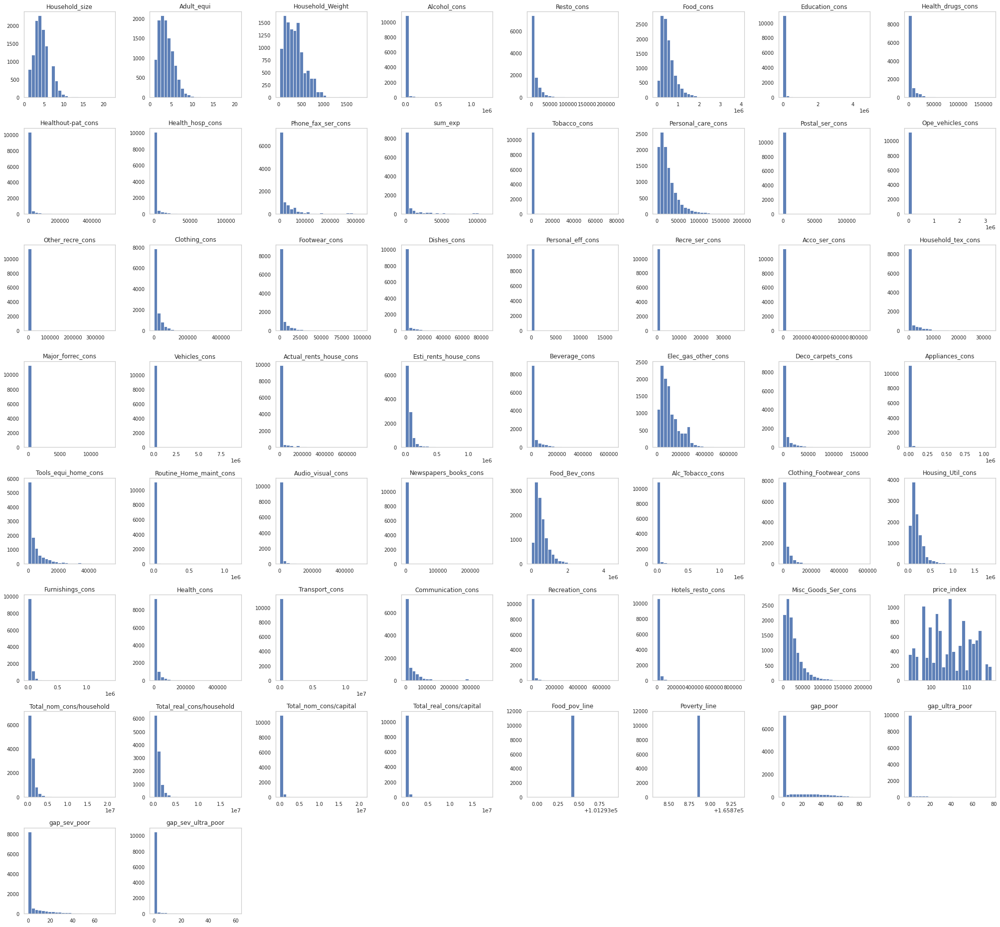

In [22]:
# Define list of numerical the variables

integer_var = df_dec.select_dtypes(include=['int64', 'float64']).columns

# Visualization of integer and float Variables

num_df[integer_var].hist(figsize=(28,26), bins=25, xlabelsize=10, ylabelsize=10, alpha=0.9, grid=False) 
plt.tight_layout();

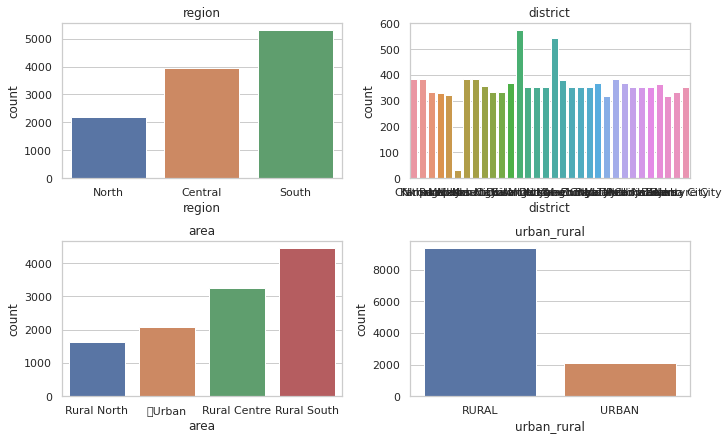

In [23]:
# Visualization of categorical Variables

# List of categorical variables
cat_var = ['region', 'district', 'area', 'urban_rural']

# Visualization 

f, axes = plt.subplots(2,2, figsize=(10,6), constrained_layout=True, sharex=False)
for f,ax in zip(cat_var, axes.ravel()):
    sns.countplot(df_dec[f], ax=ax)
    ax.set_title(f)

### **SMOTE (SMOTHE-ENN) method to improve data imbalance**
SMOTE ist an Over-sample method. It creates synthetic sample of the minority class. We want to use imblearn python package to over-sample the minority classes.

In [24]:
# Using the SMOTE method to balance the data

from imblearn.combine import SMOTEENN

# label encode the categodical variables

le = LabelEncoder()

df_dec["region"] = le.fit_transform(df_dec["region"])
df_dec["area"] = le.fit_transform(df_dec["area"])
df_dec["district"] = le.fit_transform(df_dec["district"])
df_dec["urban_rural"] = le.fit_transform(df_dec["urban_rural"])


df_dec['Target'] = df_dec['Target'].map({'Poor': 1, 'Ultra-poor': 2, 'Non-poor': 0}).astype(int)

data_sm = df_dec.copy()
X_s = data_sm.drop("Target", axis = "columns")
y_s = data_sm["Target"]
smote = SMOTEENN(random_state=seed)
X_sm, y_sm = smote.fit_resample(X_s, y_s)
print(X_sm.shape, y_sm.shape)

(19305, 62) (19305,)


In [25]:
data_sm.head()

,region,district,area,urban_rural,Household_size,Adult_equi,Household_Weight,Alcohol_cons,Resto_cons,Food_cons,...,Total_real_cons/household,Total_nom_cons/capital,Total_real_cons/capital,Food_pov_line,Poverty_line,gap_poor,gap_ultra_poor,gap_sev_poor,gap_sev_ultra_poor,Target
0,1,5,2,0,4,3.47,93.7194,0.000000,43172.375000,2.007816e+05,...,3.996735e+05,102056.007812,99918.367188,101293.426251,165878.859375,39.764256,1.357501,15.811960,0.018428,2
1,1,5,2,0,4,3.82,93.7194,0.000000,0.000000,3.662017e+05,...,6.772909e+05,172945.156250,169322.718750,101293.426251,165878.859375,0.000000,0.000000,0.000000,0.000000,0
2,1,5,2,0,4,2.67,93.7194,0.000000,0.000000,2.403571e+05,...,3.745770e+05,95647.656250,93644.257812,101293.426251,165878.859375,43.546600,7.551496,18.963062,0.570251,2
3,1,5,2,0,5,4.79,93.7194,169702.734375,12727.707031,1.675397e+06,...,2.263790e+06,462444.437500,452758.093750,101293.426251,165878.859375,0.000000,0.000000,0.000000,0.000000,0
4,1,5,2,0,5,4.31,93.7194,0.000000,0.000000,6.753428e+05,...,9.166672e+05,187255.640625,183333.437500,101293.426251,165878.859375,0.000000,0.000000,0.000000,0.000000,0


In [26]:
# Visualisation of the Target after application of the SMOTE method
data_sm = pd.concat([X_sm, y_sm], axis=1)

# Number of observations and variables including the target after applying SMOTE+ENN method
print(f"Number of observations: .............. {data_sm.shape[0]}") # Number of observations
print(f"Number of variables: ................. {data_sm.shape[1]} incl. target") # Number of variables or attributes

Number of observations: .............. 19305
Number of variables: ................. 63 incl. target


After applying the SMOTE method the size of the base was reduced from 11434 to 19305.

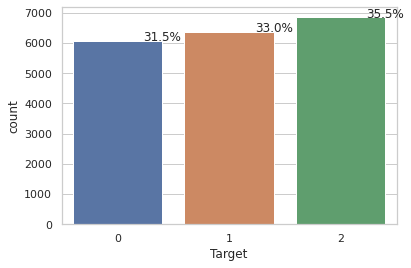

Class = 0.0, Count = 6074, Percentage  = 31.463%
Class = 1.0, Count = 6375, Percentage  = 33.023%
Class = 2.0, Count = 6856, Percentage  = 35.514%


In [27]:
# Target visualization after applaying SMOTE+ENN technique

sns.set(style="whitegrid")
plt.figure(figsize=(6,4))
total = float(len(data_sm))
ax = sns.countplot(x=y_sm, data=data_sm)

#plt.title('Distribution of Target by classes after SMOTE+ENN', fontsize=12)

for p in ax.patches:
  percentage = '{:.1f}%'.format(100 * p.get_height()/total)
  x = p.get_x() + p.get_width()
  y = p.get_height()
  ax.annotate(percentage, (x, y), ha='center')
plt.show()

# summarize the class distribution

from collections import Counter
target = data_sm.values[:, -1]
counter = Counter(target)
for k,v in counter.items():
	per = v / len(target) * 100
	print('Class = %s, Count = %d, Percentage  = %.3f%%' % (k, v, per))

In [28]:
# Number of poor, non-poor and ultra-poor households after SMOTHE

nummer = data_sm.Target.value_counts().to_frame().rename(columns={"Target":"Number of households"})
percent = (data_sm.Target.value_counts(normalize=True)*100).to_frame().rename(columns={"Target":"Percentage"})
num_per = pd.concat([nummer, percent],axis=1).round(decimals=2)
print("")
print(f"[Non-poor] Number of households that are Non-poor: .........{data_sm.Target.value_counts()[0]}")
print(f"[Poor] Number of households that are Poor: ................ {data_sm.Target.value_counts()[1]}")
print(f"[Ultra-poor] Number of households that are Ultra-poor : ... {data_sm.Target.value_counts()[2]}")
print("")
display(num_per)


[Non-poor] Number of households that are Non-poor: .........6074
[Poor] Number of households that are Poor: ................ 6375
[Ultra-poor] Number of households that are Ultra-poor : ... 6856



,Number of households,Percentage
2,6856,35.51
1,6375,33.02
0,6074,31.46


After the application of the SMOTE method the imbalance of the data improved. We now have 35.51% (6856) of the ultra poor households, 33.02% (6375) of the poor households and 31.46% (6074) of the non-poor households.

## **Feature selection**
### **Feature selection using Pearson Correlation**

In [29]:
# Correlations between every feature and the Target

pearson_corr = data_sm[ : -1].corr()
target_corr = pearson_corr.Target
display(target_corr.sort_values(ascending=False))
print("")
print("Ordered correlation in absolute value")
display(target_corr.abs().sort_values(ascending=False))

Target                       1.000000
gap_poor                     0.930450
gap_sev_poor                 0.833851
gap_ultra_poor               0.667821
gap_sev_ultra_poor           0.492277
                               ...   
Total_real_cons/household   -0.499250
Food_cons                   -0.544178
Food_Bev_cons               -0.547385
Food_pov_line                     NaN
Poverty_line                      NaN
Name: Target, Length: 63, dtype: float64


Ordered correlation in absolute value


Target              1.000000
gap_poor            0.930450
gap_sev_poor        0.833851
gap_ultra_poor      0.667821
Food_Bev_cons       0.547385
                      ...   
Acco_ser_cons       0.026889
Other_recre_cons    0.023814
price_index         0.023400
Food_pov_line            NaN
Poverty_line             NaN
Name: Target, Length: 63, dtype: float64

We are looking for features that have correlation coefficient values close to -1 or +1. These are the features that we might assume are going to be useful. Let’s use pandas filtering to isolate features that have at least 10% correlation (positive or negative) with the Target.

In [30]:
# filter only correlations stronger than .1 in either direction (positive or negative)
data_sm.corr()['Target'].abs() > .1

region                 True
district              False
area                  False
urban_rural            True
Household_size         True
                      ...  
gap_poor               True
gap_ultra_poor         True
gap_sev_poor           True
gap_sev_ultra_poor     True
Target                 True
Name: Target, Length: 63, dtype: bool

In [31]:
# filter only correlations stronger than .1 in either direction (positive or negative)

highly_correlated_features_Target = num_df.columns[num_df.corr()['Target'].abs() > .1]

highly_correlated_features_Target

Index(['Household_size', 'Adult_equi', 'Household_Weight', 'Resto_cons',
       'Food_cons', 'Education_cons', 'Phone_fax_ser_cons', 'sum_exp',
       'Personal_care_cons', 'Clothing_cons', 'Footwear_cons', 'Dishes_cons',
       'Household_tex_cons', 'Actual_rents_house_cons',
       'Esti_rents_house_cons', 'Beverage_cons', 'Elec_gas_other_cons',
       'Deco_carpets_cons', 'Appliances_cons', 'Tools_equi_home_cons',
       'Routine_Home_maint_cons', 'Audio_visual_cons', 'Food_Bev_cons',
       'Clothing_Footwear_cons', 'Housing_Util_cons', 'Furnishings_cons',
       'Health_cons', 'Transport_cons', 'Communication_cons',
       'Recreation_cons', 'Hotels_resto_cons', 'Misc_Goods_Ser_cons',
       'Total_nom_cons/household', 'Total_real_cons/household',
       'Total_nom_cons/capital', 'Total_real_cons/capital', 'gap_poor',
       'gap_ultra_poor', 'gap_sev_poor', 'gap_sev_ultra_poor', 'Target'],
      dtype='object')

In [32]:
# Dropping the highly correlated columns

data_sm = data_sm[highly_correlated_features_Target]
data_sm.shape

(19305, 41)

### **Removing highly correlated independent features**

Verification of the correlation between the different independent variables. We find that several independent variables are strongly correlated with each other. Thus, We can do some rudimentary feature selection, removing one of any pair of columns with a correlation greater than 0.80 (absolute value) with each other.

In [33]:
# Create correlation matrix

corr_matrix = data_sm.loc[:, data_sm.columns != 'Target'].corr()

# Select upper triangle of correlation matrix

upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# Find index of feature columns with correlation greater than 0.80

threshold = 0.80
to_drop = [column for column in upper.columns if any(abs(upper[column]) > threshold )]

print(f'There are {len(to_drop)} correlated columns to remove.')
print(to_drop)

There are 13 correlated columns to remove.
['Adult_equi', 'Food_Bev_cons', 'Clothing_Footwear_cons', 'Furnishings_cons', 'Communication_cons', 'Recreation_cons', 'Misc_Goods_Ser_cons', 'Total_nom_cons/household', 'Total_real_cons/household', 'Total_real_cons/capital', 'gap_ultra_poor', 'gap_sev_poor', 'gap_sev_ultra_poor']


In [34]:
# Dropping highly Correted independent Columns
data_sm= data_sm.drop(columns = to_drop)
f_column = data_sm.pop('Target') 
data_sm.insert(0, 'Target', f_column)
data_sm = data_sm.iloc[:, :16]
data_sm = data_sm.reindex(columns = [col for col in data_sm.columns if col != 'Target'] + ['Target'])

### **Features selection using  wrapper method (Sequential forward selection (SFS))**
We want to select 15 best features from the poverty Prediction Dataset using Sequential forward selection (SFS).

In [35]:
from sklearn.metrics import roc_auc_score
import sklearn.externals as extjoblib
import joblib
from mlxtend.feature_selection import SequentialFeatureSelector 

# create the SequentialFeatureSelector object
feature_selector = SequentialFeatureSelector(RandomForestClassifier(n_jobs=-1),
           k_features=15,
           forward=True,
           verbose=2,
           scoring='accuracy',
           cv=2)

In [36]:
# Separating dependent and independent features
X_sel = data_sm.drop("Target", axis = "columns")
y_sel = data_sm["Target"]

# Fit the selected features
features = feature_selector.fit(X_sel, y_sel)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  15 out of  15 | elapsed:   37.6s finished

[2022-11-20 14:26:23] Features: 1/15 -- score: 0.495209113683697[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    3.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:   29.5s finished

[2022-11-20 14:26:53] Features: 2/15 -- score: 0.7707844884289659[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.5s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  13 out of  13 | elapsed:   30.7s finished

[2022-11-20 14:27:23] Features: 3/15 -- score: 0.8659416534089301[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   

In [37]:
# List of the selected features

best_features= X_sel.columns[list(features.k_feature_idx_)]
best_features

Index(['Household_size', 'Household_Weight', 'Resto_cons', 'Food_cons',
       'Education_cons', 'Phone_fax_ser_cons', 'sum_exp', 'Personal_care_cons',
       'Clothing_cons', 'Footwear_cons', 'Dishes_cons', 'Household_tex_cons',
       'Actual_rents_house_cons', 'Esti_rents_house_cons', 'Beverage_cons'],
      dtype='object')

In [38]:
# Selected the best 15 features and store it in a dataframe

best_features = ['Household_size', 'Household_Weight', 'Resto_cons', 'Food_cons',
       'Education_cons', 'Phone_fax_ser_cons', 'sum_exp', 'Personal_care_cons',
       'Clothing_cons', 'Footwear_cons', 'Dishes_cons', 'Household_tex_cons',
       'Actual_rents_house_cons', 'Esti_rents_house_cons', 'Beverage_cons'] 

X_data_sm = data_sm[best_features]
y_data_sm = data_sm["Target"]

df = pd.concat([X_data_sm, y_data_sm], axis=1)
df.shape

(19305, 16)

In [39]:
# Rank of the best selected features by importance

X = df.drop("Target", axis = "columns")
y = df["Target"]

clf = RandomForestClassifier(n_estimators=500, n_jobs=-1, random_state=seed)
clf.fit(X, y)

imp = pd.DataFrame({'features':X.columns.values.tolist(),\
                        'importance': clf.feature_importances_}).\
            sort_values(by='importance', ascending=False)

rank_imp = pd.DataFrame({'rank_imp':\
                           imp['importance'].\
                           rank(method='first',\
                                ascending=False).astype(int)})

Rank = pd.concat((imp, rank_imp), axis=1)
Rank

,features,importance,rank_imp
3,Food_cons,0.246227,1
0,Household_size,0.211110,2
7,Personal_care_cons,0.077181,3
4,Education_cons,0.070618,4
13,Esti_rents_house_cons,0.068070,5
14,Beverage_cons,0.057212,6
8,Clothing_cons,0.051053,7
5,Phone_fax_ser_cons,0.048482,8
2,Resto_cons,0.038859,9
1,Household_Weight,0.038599,10


In [40]:
# Store the best 15 features and the target in a DataFrame

df = pd.concat([X_data_sm, y_data_sm], axis=1)
df.shape

(19305, 16)

## **Visualisation of the 5 important features**

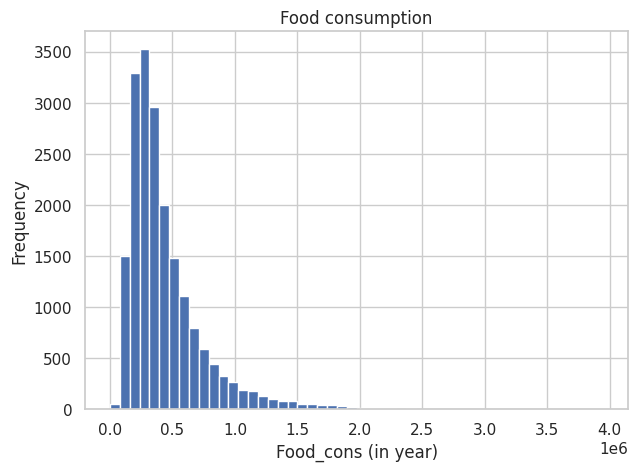

In [41]:
# Visualization of the variable "Food_cons"
from pandas.plotting import table

plt.rcParams.update({'figure.figsize':(7,5), 'figure.dpi':100})

# Plot Histogram on Food_cons
x = df["Food_cons"]
plt.hist(x, bins=50)
plt.gca().set(title='Food consumption', xlabel = 'Food_cons (in year)', ylabel='Frequency');

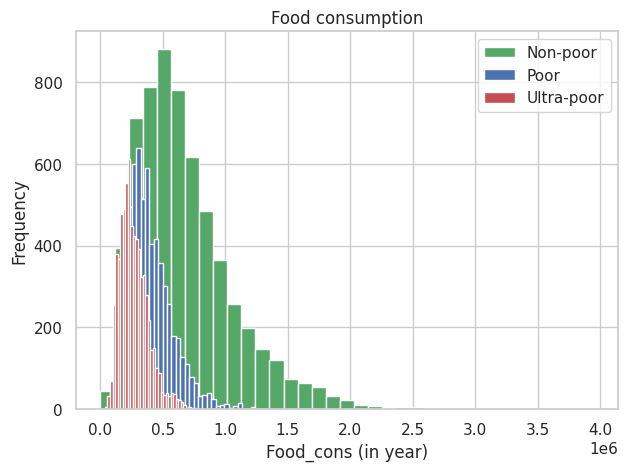

In [42]:
# Visualization of the variable 'Food_cons' vs.'Target'

x0 = df.loc[df.Target==0, 'Food_cons']
x1 = df.loc[df.Target==1, 'Food_cons']
x2 = df.loc[df.Target==2, 'Food_cons']

kwargs = dict(alpha=1, bins=35, stacked=True, density=False)

plt.hist(x0, **kwargs, color='g', label='Non-poor')
plt.hist(x1, **kwargs, color='b', label='Poor')
plt.hist(x2, **kwargs, color='r', label='Ultra-poor')
plt.gca().set(title= 'Food consumption', xlabel='Food_cons (in year)', ylabel='Frequency')
plt.legend();

Text(0.5, 0, 'Target')

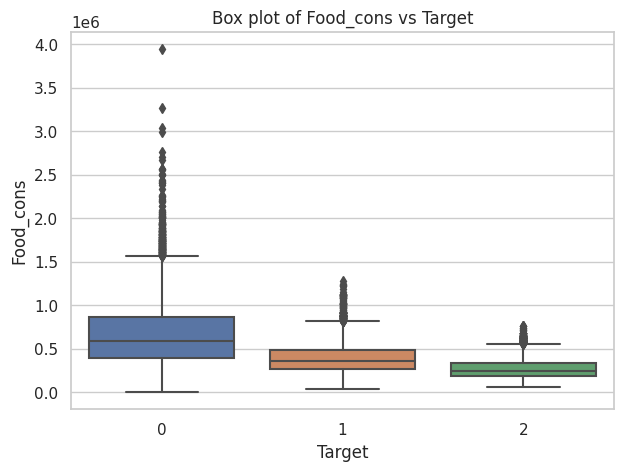

In [43]:
#  Box plot of 'Food_cons' vs 'Target'
sns.boxplot(y='Food_cons', x ='Target', data=df)
plt.title('Box plot of Food_cons vs Target')
plt.xlabel('Target')

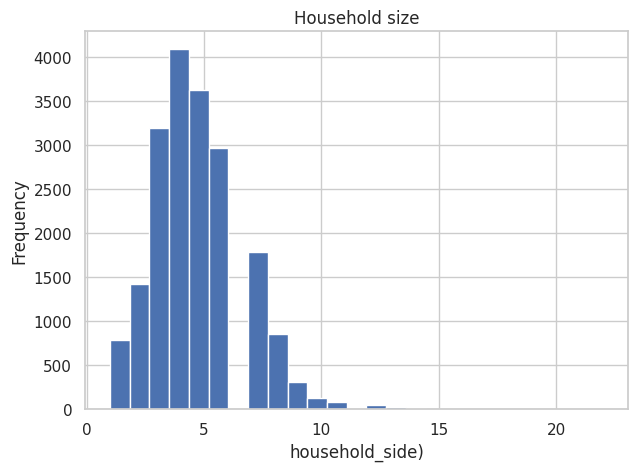

In [44]:
# Visualization of the variable 'Household_size'

plt.rcParams.update({'figure.figsize':(7,5), 'figure.dpi':100})

# Plot Histogram on 'Household_size'
x = df["Household_size"]
plt.hist(x, bins=25)
plt.gca().set(title='Household size', xlabel = 'household_side)', ylabel='Frequency');

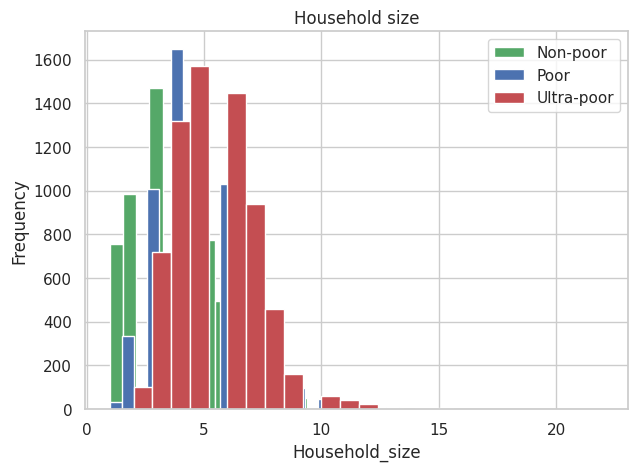

In [45]:
# Visualization of 'Household_size' vs. 'Target'

x0 = df.loc[df.Target==0, 'Household_size']
x1 = df.loc[df.Target==1, 'Household_size']
x2 = df.loc[df.Target==2, 'Household_size']

kwargs = dict(alpha=1, bins=25, stacked=True, density=False)

plt.hist(x0, **kwargs, color='g', label='Non-poor')
plt.hist(x1, **kwargs, color='b', label='Poor')
plt.hist(x2, **kwargs, color='r', label='Ultra-poor')
plt.gca().set(title= 'Household size', xlabel='Household_size', ylabel='Frequency')
plt.legend();

Text(0.5, 0, 'Target')

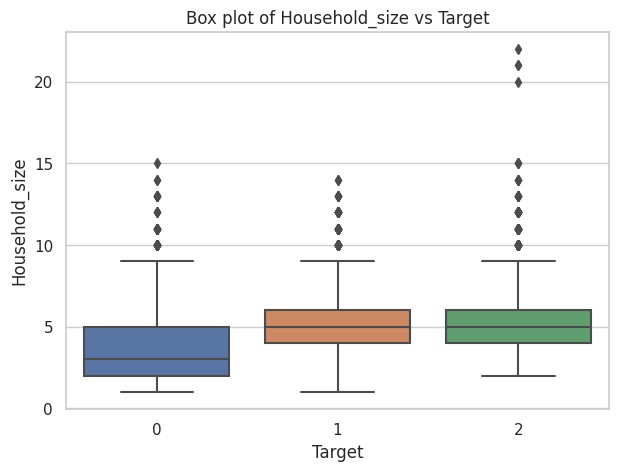

In [46]:
#  Box plot of 'Household_size 'vs 'Target'
sns.boxplot(y='Household_size', x ='Target', data=df)
plt.title('Box plot of Household_size vs Target')
plt.xlabel('Target')

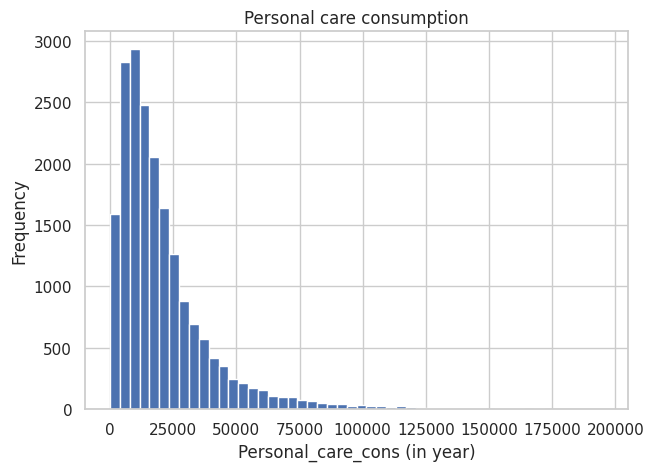

In [47]:
# Visualization of the variable 'Personal_care_cons'

plt.rcParams.update({'figure.figsize':(7,5), 'figure.dpi':100})

# Plot Histogram on 'Personal_care_cons'
x = df["Personal_care_cons"]
plt.hist(x, bins=50)
plt.gca().set(title='Personal care consumption', xlabel = 'Personal_care_cons (in year)', ylabel='Frequency');

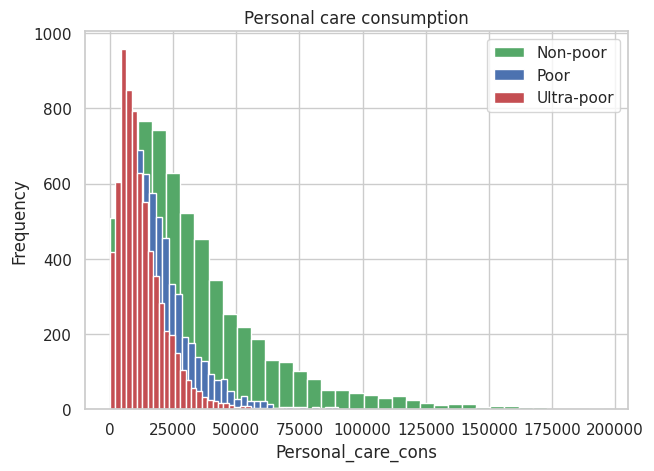

In [48]:
# Visualization 'Personal_care_cons' vs. 'Target'

x0 = df.loc[df.Target==0, 'Personal_care_cons']
x1 = df.loc[df.Target==1, 'Personal_care_cons']
x2 = df.loc[df.Target==2, 'Personal_care_cons']

kwargs = dict(alpha=1, bins=35, stacked=True, density=False)

plt.hist(x0, **kwargs, color='g', label='Non-poor')
plt.hist(x1, **kwargs, color='b', label='Poor')
plt.hist(x2, **kwargs, color='r', label='Ultra-poor')
plt.gca().set(title= 'Personal care consumption', xlabel='Personal_care_cons', ylabel='Frequency')
plt.legend();

Text(0.5, 0, 'Target')

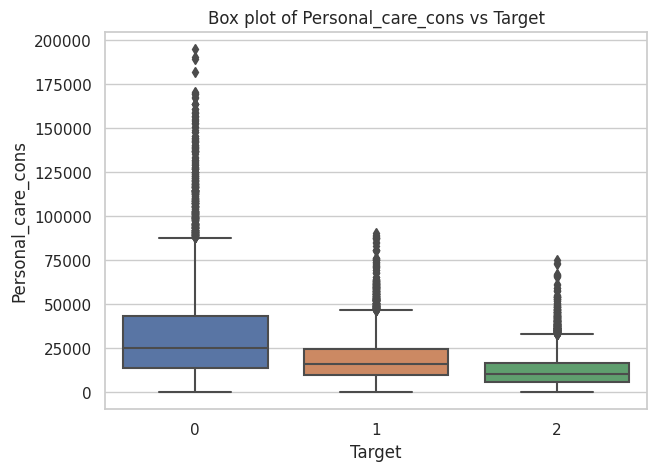

In [49]:
#  Box plot of 'Personal_care_cons' vs 'Target'
sns.boxplot(y='Personal_care_cons', x ='Target', data=df)
plt.title('Box plot of Personal_care_cons vs Target')
plt.xlabel('Target')

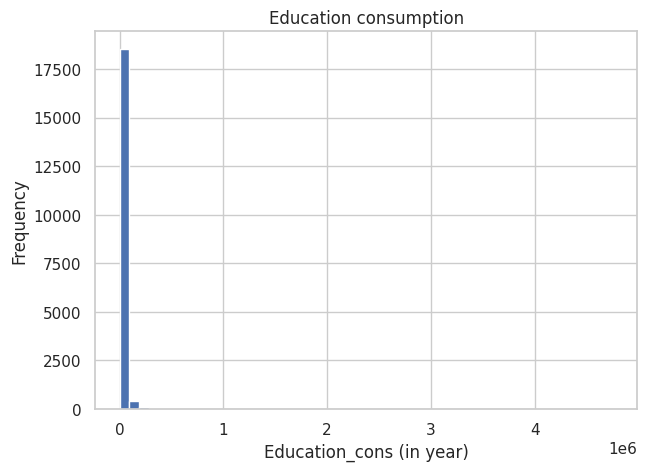

In [50]:
# Visualization of the variable 'Education_cons'

plt.rcParams.update({'figure.figsize':(7,5), 'figure.dpi':100})

# Plot Histogram on 'Education_cons'
x = df["Education_cons"]
plt.hist(x, bins=50)
plt.gca().set(title='Education consumption', xlabel = 'Education_cons (in year)', ylabel='Frequency');

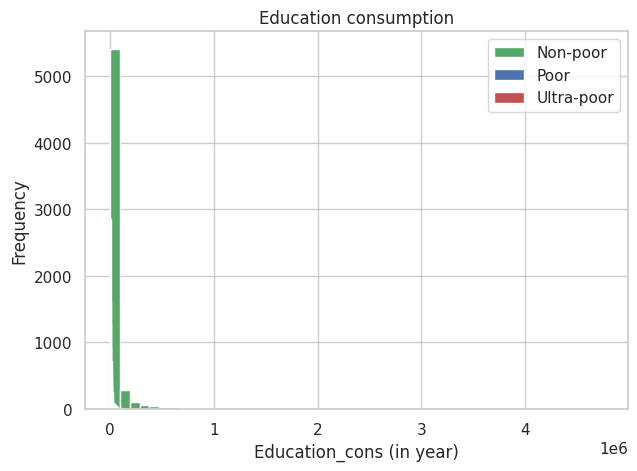

In [51]:
# Visualization 'Education_cons' vs. 'Target'

x0 = df.loc[df.Target==0, 'Education_cons']
x1 = df.loc[df.Target==1, 'Education_cons']
x2 = df.loc[df.Target==2, 'Education_cons']

kwargs = dict(alpha=1, bins=50, stacked=True, density=False)

plt.hist(x0, **kwargs, color='g', label='Non-poor')
plt.hist(x1, **kwargs, color='b', label='Poor')
plt.hist(x2, **kwargs, color='r', label='Ultra-poor')
plt.gca().set(title= 'Education consumption', xlabel='Education_cons (in year)', ylabel='Frequency')
plt.legend();

Text(0.5, 0, 'Target')

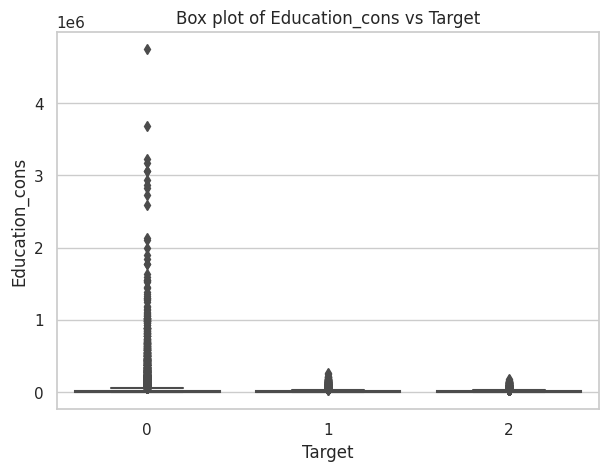

In [52]:
#  Box plot of 'Education_consumption' vs 'Target'
sns.boxplot(y='Education_cons', x ='Target', data=df)
plt.title('Box plot of Education_cons vs Target')
plt.xlabel('Target')

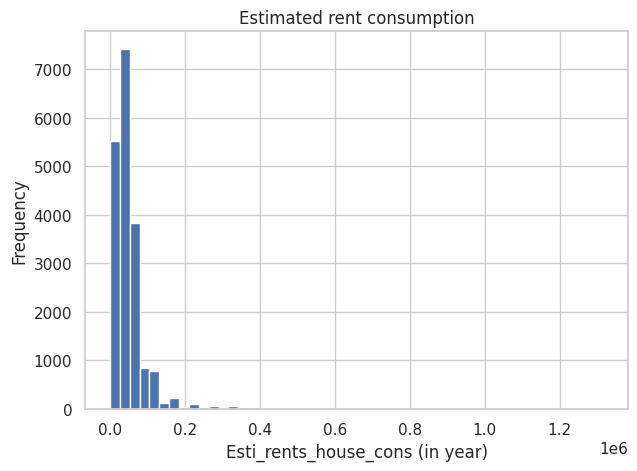

In [53]:
# Visualization of the variable 'Esti_rents_house_cons'

plt.rcParams.update({'figure.figsize':(7,5), 'figure.dpi':100})

# Plot Histogram on 'Esti_rents_house_cons'
x = df["Esti_rents_house_cons"]
plt.hist(x, bins=50)
plt.gca().set(title='Estimated rent consumption', xlabel = 'Esti_rents_house_cons (in year)', ylabel='Frequency');

[Text(0, 0.5, 'Frequency'),
 Text(0.5, 0, 'Esti_rents_house_cons (in year)'),
 Text(0.5, 1.0, 'Etimated rent consumption')]

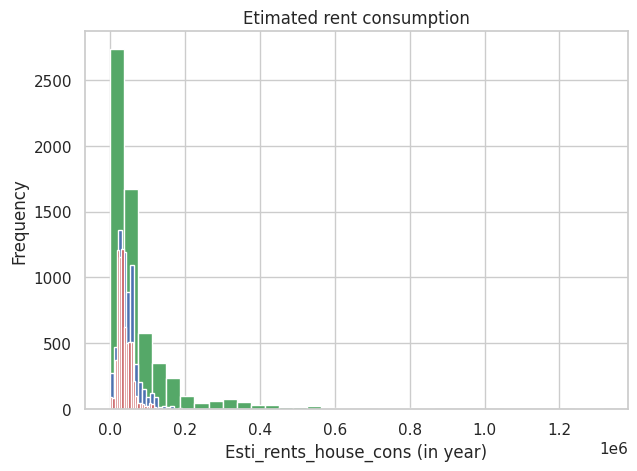

In [54]:
# Visualization 'Esti_rents_house_cons' vs. 'Target'

x0 = df.loc[df.Target==0, 'Esti_rents_house_cons']
x1 = df.loc[df.Target==1, 'Esti_rents_house_cons']
x2 = df.loc[df.Target==2, 'Esti_rents_house_cons']

kwargs = dict(alpha=1, bins=35, stacked=True, density=False)

plt.hist(x0, **kwargs, color='g', label='Non-poor')
plt.hist(x1, **kwargs, color='b', label='Poor')
plt.hist(x2, **kwargs, color='r', label='Ultra-poor')
plt.gca().set(title='Etimated rent consumption', xlabel = 'Esti_rents_house_cons (in year)', ylabel='Frequency')

Text(0.5, 0, 'Target')

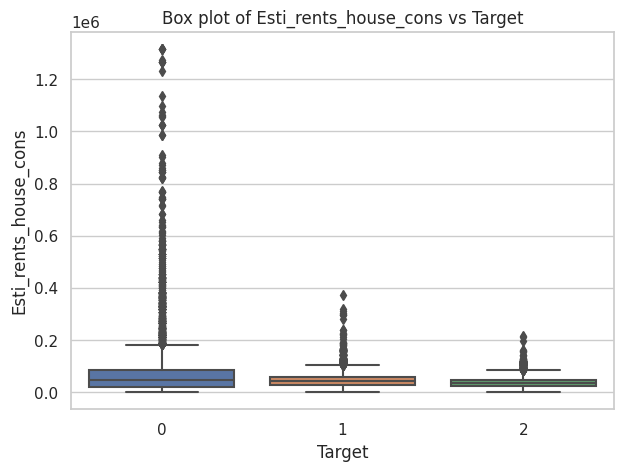

In [55]:
#  Box plot of 'Actual_rents_for_housing_consumption' vs 'Target'

sns.boxplot(y='Esti_rents_house_cons', x ='Target', data=df)
plt.title('Box plot of Esti_rents_house_cons vs Target')
plt.xlabel('Target')

### **Descriptive statistics for selected variables**

In [56]:
# Genaral statistic on the selected variables

df.describe(). T.round(2)

,count,mean,std,min,25%,50%,75%,max
Household_size,19305.0,4.70,1.97,1.0,3.00,5.00,6.00,22.00
Household_Weight,19305.0,381.12,211.34,22.5,222.98,356.65,492.56,1855.51
Resto_cons,19305.0,6939.61,14278.84,0.0,0.00,0.00,8969.07,223419.67
Food_cons,19305.0,436237.18,304529.44,0.0,236917.59,348843.18,536815.21,3948634.75
Education_cons,19305.0,24686.83,118734.11,0.0,673.70,5414.60,13731.41,4750522.00
Phone_fax_ser_cons,19305.0,18088.45,45234.45,0.0,0.00,0.00,16094.00,328366.44
sum_exp,19305.0,5451.55,15746.81,0.0,0.00,0.00,2271.10,115355.17
Personal_care_cons,19305.0,20855.92,19895.93,0.0,8364.39,15309.75,26218.45,195206.58
Clothing_cons,19305.0,14095.95,27531.60,0.0,0.00,3183.47,16418.32,495228.16
Footwear_cons,19305.0,2528.61,6552.74,0.0,0.00,0.00,2037.00,100755.33


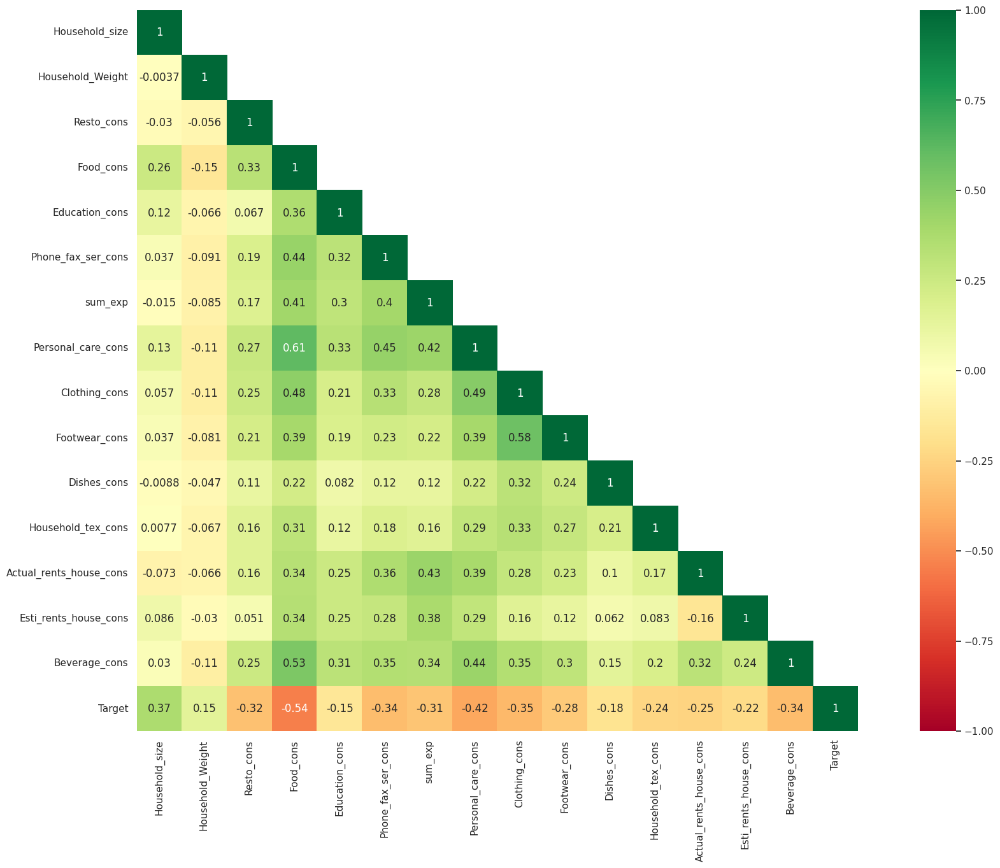

In [57]:
# Visualisation of the correlation between the selected variables and the target variable

mask = np.triu(df.corr(), 1)
plt.figure(figsize=(25, 15))
sns.heatmap(df.corr(), annot=True, vmax=1, vmin = -1, square=True, cmap="RdYlGn", mask=mask);

Almost all independent variables are weakly correlated with each other. Moreover "Food_cons" (-0.54) is the most correlated variable with the target variable followed by "Personal\_care\_cons" (-0.42), "Household\_size" (+0.35), "Clothing\_cons" (-0.35), "Phone\_fax-ser\_cons" (-0.34), "Beverage\_cons" (-0.34), "Resto\_cons" (0.32) and "sum\_exp" (-0.31). 

### **Data preprocessing**

In [58]:
# Dividing the data into independant and dependent data before scaling. 

X = df.drop("Target", axis = "columns")
y = df["Target"]

# Splitting Data into training and test data

X_train_, X_test_, y_train, y_test = train_test_split(X,y, test_size=0.3, random_state=seed)

print('Shape of the X_train_ {}'.format(X_train_.shape))
print('Shape of the y_train {}'.format(y_train.shape))
print('Shape of the X_test_ {}'.format(X_test_.shape))
print('Shape of the y_test {}'.format(y_test.shape))

Shape of the X_train_ (13513, 15)
Shape of the y_train (13513,)
Shape of the X_test_ (5792, 15)
Shape of the y_test (5792,)


**Scaling the data**

As some columns have very low values and others have high values, the next step is to bring the data to a common scale. This process is important because values on a similar scale allow the model to learn better. For this we use the standard scaler for this process.

‘StandardScaler follows Standard Normal Distribution (SND). Therefore, it makes mean = 0 and scales the data to unit variance’.

In [59]:
#Scaling the data
scaler = MinMaxScaler()
continuous_features = df.iloc[:,:-1].select_dtypes(include=['float64', 'int64']).columns

X_train = X_train_.copy()
X_train.loc[:, continuous_features] = scaler.fit_transform(X_train_.loc[:, continuous_features])
X_test = X_test_.copy()
X_test.loc[:, continuous_features] = scaler.transform(X_test_.loc[:, continuous_features])
X_test.head()

,Household_size,Household_Weight,Resto_cons,Food_cons,Education_cons,Phone_fax_ser_cons,sum_exp,Personal_care_cons,Clothing_cons,Footwear_cons,Dishes_cons,Household_tex_cons,Actual_rents_house_cons,Esti_rents_house_cons,Beverage_cons
9937,0.20,0.125841,0.000000,0.120255,0.005803,0.033616,0.007127,0.090107,0.000000,0.000000,0.000000,0.000000,0.000000,0.027735,0.010731
5500,0.25,0.027102,0.000000,0.525669,0.594322,0.809464,0.230420,0.642694,0.059040,0.158285,0.169657,0.347427,0.575278,0.000000,0.007148
15330,0.20,0.054518,0.000000,0.051295,0.001685,0.000000,0.009572,0.131959,0.009511,0.000000,0.000000,0.000000,0.000000,0.044164,0.000000
7284,0.15,0.150454,0.000000,0.071671,0.000000,0.099495,0.377627,0.172945,0.000000,0.000000,0.000000,0.000000,0.176776,0.000000,0.003661
13800,0.25,0.188194,0.035014,0.076013,0.001163,0.000000,0.020523,0.039416,0.043822,0.000000,0.000000,0.074388,0.000000,0.026974,0.000000


# **Modeling strategy**

## **1-White-box models**

### **Logistic Regression (LR)**

In [60]:
# Gridsearch to determine the values of Parameters

param_grid = {'C':np.arange(0.01,100,10), 'penalty': ['l1', 'l2']}

logist = LogisticRegression(max_iter=1000, solver='lbfgs', 
        class_weight = 'balanced', random_state=seed)

logist_cv = GridSearchCV(logist, param_grid, cv=3, refit=True)
logist_cv.fit(X_train, y_train)
print(logist_cv.best_params_)

{'C': 90.01, 'penalty': 'l2'}


In [61]:
# Model training and fitting
logist_model = logist_cv.best_estimator_

logist_model.fit(X_train, y_train)

# Model prediction
logist_pred = logist_model.predict(X_test)
logist_pred_train = logist_model.predict(X_train)
print("Accuracy on test data: {:,.2f}". format(logist_model.score(X_test, y_test)))
print("Accuracy on training data: {:,.2f}". format(logist_model.score(X_train, y_train)))

Accuracy on test data: 0.91
Accuracy on training data: 0.92


In [62]:
# Model evaluation on test data

# Print the Confusion Matrix and slice it into four pieces
cm_logist = confusion_matrix(y_test, logist_pred)
print('Confusion matrix\n\n', cm_logist)

# Class 0
TP_0 = cm_logist[0,0]                  
FP_0 = cm_logist[0,1]+cm_logist[0,2]
TN_0 = cm_logist[1,1]+cm_logist[1,2]+cm_logist[2,1]+cm_logist[2,2]       
FN_0 = cm_logist[1,0]+cm_logist[2,0]
      
# Class 1
TP_1 = cm_logist[1,1]                   
FP_1 = cm_logist[1,0]+cm_logist[1,2]
TN_1 = cm_logist[0,0]+cm_logist[0,2]+cm_logist[2,0]+cm_logist[2,2]       
FN_1 = cm_logist[0,1]+cm_logist[2,1]

# Class 2
TP_2 = cm_logist[2,2]                   
FP_2 = cm_logist[2,0]+cm_logist[2,1]
TN_2 = cm_logist[0,0]+cm_logist[0,1]+cm_logist[1,0]+cm_logist[1,1]       
FN_2 = cm_logist[0,2]+cm_logist[1,2]

# Summarize Confusion Matrix
print('\nclass 0:', TP_0,  FP_0, TN_0,  FN_0)
print('\nclass 1:', TP_1,  FP_1, TN_1,  FN_1)
print('\nclass 2:', TP_2,  FP_2, TN_2,  FN_2)

True_positive_logist = TP_0 + TP_1 + TP_2
False_positive_logist = FP_0 + FP_1 + FP_2
True_negative_logist = TN_0 + TN_1 + TN_2
False_negative_logist = FN_0 + FN_1 + FN_2

print('')

print('\nTrue Positives(TP) =', True_positive_logist)
print('\nFalse Positives(FP) =', False_positive_logist)
print('\nTrue Negatives(FP) =', True_negative_logist)
print('\nFalse Negative:=', False_negative_logist)

Confusion matrix

 [[1691  106    0]
 [  47 1705  195]
 [   0  171 1877]]

class 0: 1691 106 3948 47

class 1: 1705 242 3568 277

class 2: 1877 171 3549 195


True Positives(TP) = 5273

False Positives(FP) = 519

True Negatives(FP) = 11065

False Negative:= 519


Accuracy on test data: 0.91


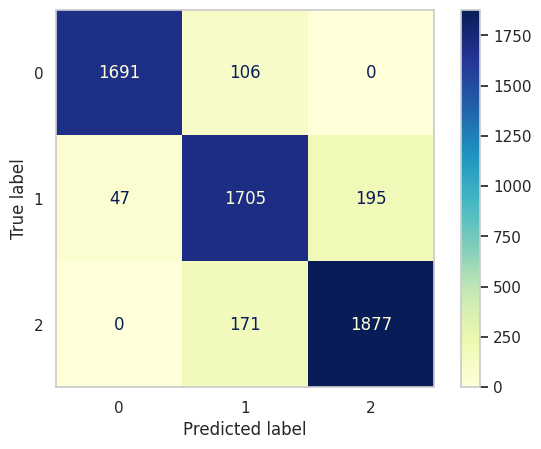

In [63]:
# Visualize confusion matrix 
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix

print("Accuracy on test data: {:,.2f}". format(logist_model.score(X_test, y_test)))
plot_confusion_matrix(logist_model, X_test, y_test, values_format=".4g", cmap="YlGnBu")
plt.grid(False);

In [64]:
# Classification Scores on the test data
accuracy_logist_test = metrics.accuracy_score(y_test, logist_pred).round(2)
recall_logist_test = metrics.recall_score(y_test, logist_pred, average="macro").round(2)
precision_logist_test = metrics.precision_score(y_test, logist_pred, average="macro").round(2)
f1_score_logist_test = metrics.f1_score(y_test, logist_pred, average="macro").round(2)

print('Accuracy score for the test data: ', accuracy_logist_test) # The percentage of correct predictions for the test data
print('Recall score for test data: ', recall_logist_test)
print('Precision score for test data: ', precision_logist_test)
print('F1 score for test data: ', f1_score_logist_test)

Accuracy score for the test data:  0.91
Recall score for test data:  0.91
Precision score for test data:  0.91
F1 score for test data:  0.91


In [65]:
# AUC for LR on Test Data
# Therefore, we created a function using LabelBinarizer() in order to evaluate the AUC ROC score for my multi-class problem:
from sklearn.preprocessing import LabelBinarizer

def multiclass_roc_auc_score(y_test, logist_pred, average="macro"):
    Lb = LabelBinarizer()
    Lb.fit(y_test)
    y_test = Lb.transform(y_test)
    logist_pred = Lb.transform(logist_pred)
    return roc_auc_score(y_test, logist_pred, average=average)

logist_roc_auc_test = multiclass_roc_auc_score(y_test, logist_pred).round(2)
logist_roc_auc_test

0.93

AUC_LR for test data: 0.93


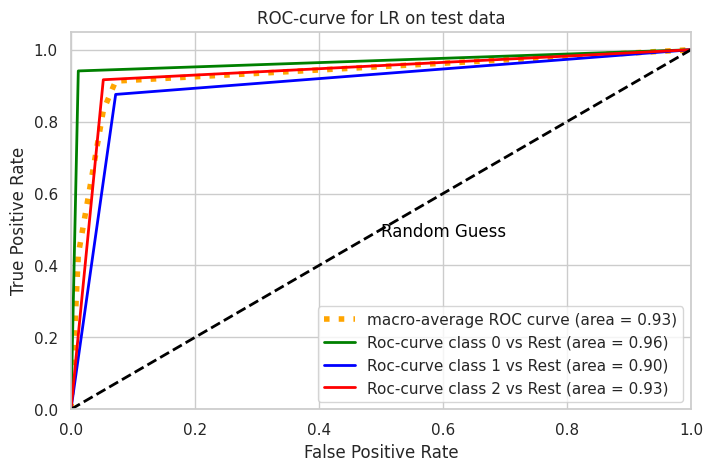

In [66]:
# Roc curve LR on test data

from numpy.lib.function_base import interp
from itertools import cycle

print("AUC_LR for test data:", logist_roc_auc_test)
t1=sum(x==0 for x in logist_pred-y_test)/len(logist_pred)
n_classes=3

### MACRO
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(np.array(pd.get_dummies(y_test))[:, i], np.array(pd.get_dummies(logist_pred))[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += interp(all_fpr, fpr[i], tpr[i])

mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

lw=2
plt.figure(figsize=(8,5))
plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='orange', linestyle=':', linewidth=4)

colors = cycle(['green', 'blue', 'red'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw, 
             label='Roc-curve class {0} vs Rest (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--',color='black', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.annotate('Random Guess',(.5,.48),color='black')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC-curve for LR on test data')
plt.legend(loc="lower right")
plt.show()

In [67]:
#Evaluation of the Model on training data

# Classification Scores of LR on training data
accuracy_logist_train = metrics.accuracy_score(y_train, logist_model.predict(X_train)).round(2)
recall_logist_train = metrics.recall_score(y_train, logist_model.predict(X_train), average="macro").round(2)
precision_logist_train = metrics.precision_score(y_train, logist_model.predict(X_train), average="macro").round(2)
f1_score_logist_train = metrics.f1_score(y_train, logist_model.predict(X_train), average="macro").round(2)

print('Accuracy score for training data: ', accuracy_logist_train) 
print('Recall score for training data: ', recall_logist_train)
print('Precision score for training data: ', precision_logist_train)
print('F1 score for training data: ', f1_score_logist_train)

Accuracy score for training data:  0.92
Recall score for training data:  0.92
Precision score for training data:  0.92
F1 score for training data:  0.92


In [68]:
# AUC for LR on Traing Data
from sklearn.preprocessing import LabelBinarizer

logist_pred_train = logist_model.predict(X_train)

def multiclass_roc_auc_score(y_train, logist_pred_train, average="macro"):
    Lb = LabelBinarizer()
    Lb.fit(y_train)
    y_train = Lb.transform(y_train)
    logist_pred_train = Lb.transform(logist_pred_train)
    return roc_auc_score(y_train, logist_pred_train, average=average)

logist_roc_auc_train = multiclass_roc_auc_score(y_train, logist_pred_train).round(2)
logist_roc_auc_train

0.94

### **Decision Tree (DT)**

In [69]:
# Gridsearch to determine the values of Parameters (Pre-pruning)
from sklearn import tree

dt = DecisionTreeClassifier(class_weight='balanced', random_state=seed)
param_grid = {'criterion': ['gini','entropy'],'max_depth' : [5,10,100,200],  
              'min_samples_split' : [5,10,50], 'min_samples_leaf': [1,5,10]}

dt_cv = GridSearchCV(dt, param_grid, cv=3, refit=True)
dt_cv.fit(X_train, y_train)
print(dt_cv.best_params_)

{'criterion': 'entropy', 'max_depth': 100, 'min_samples_leaf': 1, 'min_samples_split': 5}


In [70]:
# Model training and fitting
dt_model = dt_cv.best_estimator_
dt_model.fit(X_train, y_train)

# Model prediction
dt_pred = dt_model.predict(X_test)
dt_pred_train = dt_model.predict(X_train)
print("Accuracy on test data: {:,.2f}". format(dt_model.score(X_test, y_test)))
print("Accuracy on training data: {:,.2f}". format(dt_model.score(X_train, y_train)))

Accuracy on test data: 0.89
Accuracy on training data: 0.99


In [71]:
# Evaluation of the Model on test data

# Print the Confusion Matrix and slice it into four pieces
cm_dt = confusion_matrix(y_test, dt_pred)
print('Confusion matrix\n\n', cm_dt)

# Class 0
TP_0 = cm_dt[0,0]                  
FP_0 = cm_dt[0,1]+cm_dt[0,2]
TN_0 = cm_dt[1,1]+cm_dt[1,2]+cm_dt[2,1]+cm_dt[2,2]       
FN_0 = cm_dt[1,0]+cm_dt[2,0]
      
# Class 1
TP_1 = cm_dt[1,1]                   
FP_1 = cm_dt[1,0]+cm_dt[1,2]
TN_1 = cm_dt[0,0]+cm_dt[0,2]+cm_dt[2,0]+cm_dt[2,2]       
FN_1 = cm_dt[0,1]+cm_dt[2,1]

# Class 2
TP_2 = cm_dt[2,2]                   
FP_2 = cm_dt[2,0]+cm_dt[2,1]
TN_2 = cm_dt[0,0]+cm_dt[0,1]+cm_dt[1,0]+cm_dt[1,1]       
FN_2 = cm_dt[0,2]+cm_dt[1,2]

# Summarize Confusion Matrix
print('\nclass 0:', TP_0,  FP_0, TN_0,  FN_0)
print('\nclass 1:', TP_1,  FP_1, TN_1,  FN_1)
print('\nclass 2:', TP_2,  FP_2, TN_2,  FN_2)

True_positive_dt = TP_0 + TP_1 + TP_2
False_positive_dt = FP_0 + FP_1 + FP_2
True_negative_dt = TN_0 + TN_1 + TN_2
False_negative_dt = FN_0 + FN_1 + FN_2

print('')

print('\nTrue Positives(TP) =', True_positive_dt)
print('\nFalse Positives(FP) =', False_positive_dt)
print('\nTrue Negatives(FP) =', True_negative_dt)
print('\nFalse Negative:=', False_negative_dt)

Confusion matrix

 [[1668  129    0]
 [ 130 1619  198]
 [   6  176 1866]]

class 0: 1668 129 3859 136

class 1: 1619 328 3540 305

class 2: 1866 182 3546 198


True Positives(TP) = 5153

False Positives(FP) = 639

True Negatives(FP) = 10945

False Negative:= 639


Accuracy on test data: 0.89


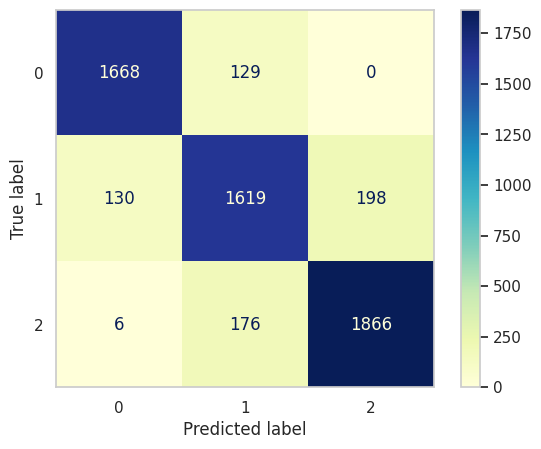

In [72]:
# Visualize confusion matrix 

print("Accuracy on test data: {:,.2f}". format(dt_model.score(X_test, y_test)))
plot_confusion_matrix(dt_model, X_test, y_test, values_format=".4g", cmap="YlGnBu")
plt.grid(False);

In [73]:
# Classification Scores DT on the test data
accuracy_dt_test = metrics.accuracy_score(y_test, dt_pred).round(2)
recall_dt_test = metrics.recall_score(y_test, dt_pred, average="macro").round(2)
precision_dt_test = metrics.precision_score(y_test, dt_pred, average="macro").round(2)
f1_score_dt_test = metrics.f1_score(y_test, dt_pred, average="macro").round(2)

print('Accuracy score for the test data: ', accuracy_dt_test) 
print('Recall score for test data: ', recall_dt_test)
print('Precision score for test data: ', precision_dt_test)
print('F1 score for test data: ', f1_score_dt_test)

Accuracy score for the test data:  0.89
Recall score for test data:  0.89
Precision score for test data:  0.89
F1 score for test data:  0.89


In [74]:
# AUC for DT on Test Data
from sklearn.preprocessing import LabelBinarizer

def multiclass_roc_auc_score(y_test, dt_pred, average="macro"):
    Lb = LabelBinarizer()
    Lb.fit(y_test)
    y_test = Lb.transform(y_test)
    dt_pred = Lb.transform(dt_pred)
    return roc_auc_score(y_test, dt_pred, average=average)

dt_roc_auc_test = multiclass_roc_auc_score(y_test, dt_pred).round(2)
dt_roc_auc_test

0.92

AUC_DT for test data: 0.92


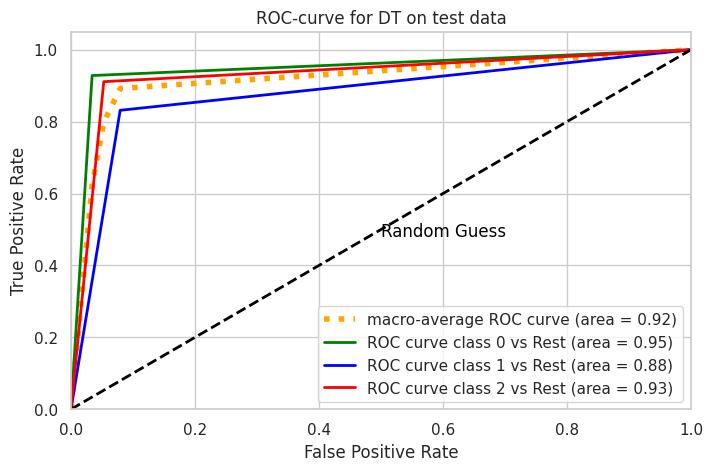

In [75]:
# Plot ROC Curve DT on the test data
from numpy.lib.function_base import interp

print("AUC_DT for test data:", dt_roc_auc_test)
t1=sum(x==0 for x in dt_pred-y_test)/len(dt_pred)
n_classes=3

### MACRO
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(np.array(pd.get_dummies(y_test))[:, i], np.array(pd.get_dummies(dt_pred))[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += interp(all_fpr, fpr[i], tpr[i])

mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

lw=2
plt.figure(figsize=(8,5))
plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='orange', linestyle=':', linewidth=4)

colors = cycle(['green', 'blue', 'red'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve class {0} vs Rest (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--',color='black', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.annotate('Random Guess',(.5,.48),color='black')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC-curve for DT on test data')
plt.legend(loc="lower right")
plt.show()

In [76]:
# Classification Scores on training data
accuracy_dt_train = metrics.accuracy_score(y_train, dt_model.predict(X_train)).round(2)
recall_dt_train = metrics.recall_score(y_train, dt_model.predict(X_train), average="macro").round(2)
precision_dt_train = metrics.precision_score(y_train, dt_model.predict(X_train), average="macro").round(2)
f1_score_dt_train = metrics.f1_score(y_train, dt_model.predict(X_train), average="macro").round(2)

print('Accuracy score for training data: ', accuracy_dt_train) 
print('Recall score for training data: ', recall_dt_train)
print('Precision score for training data: ', precision_dt_train)
print('F1 score for training data: ', f1_score_dt_train)

Accuracy score for training data:  0.99
Recall score for training data:  0.99
Precision score for training data:  0.99
F1 score for training data:  0.99


In [77]:
# AUC for DT on Traing Data
from sklearn.preprocessing import LabelBinarizer

def multiclass_roc_auc_score(y_train, dt_pred_train, average="macro"):
    Lb = LabelBinarizer()
    Lb.fit(y_train)
    y_train = Lb.transform(y_train)
    dt_pred_train = Lb.transform(dt_pred_train)
    return roc_auc_score(y_train, dt_pred_train, average=average)

dt_roc_auc_train = multiclass_roc_auc_score(y_train, dt_pred_train).round(2)
dt_roc_auc_train

0.99

### **Naive Bayes (NB) classifier**

In [78]:
# Gridsearch to determine the values of Parameters 

param_grid = {'var_smoothing': np.logspace(0,-9, num=100)}

gnb = GaussianNB()

gnb_cv = GridSearchCV(gnb, param_grid, cv=3, verbose=1, refit=True)
gnb_cv.fit(X_train, y_train)
print(gnb_cv.best_params_)

Fitting 3 folds for each of 100 candidates, totalling 300 fits
{'var_smoothing': 0.0015199110829529332}


In [79]:
# Model training and fitting
gnb_model = gnb_cv.best_estimator_
gnb_model.fit(X_train, y_train)

# Model prediction
gnb_pred = gnb_model.predict(X_test)
print("Accuracy on test data: {:,.2f}". format(gnb_model.score(X_test, y_test)))
print("Accuracy on training data: {:,.2f}". format(gnb_model.score(X_train, y_train)))

Accuracy on test data: 0.60
Accuracy on training data: 0.60


In [80]:
# Evaluation of the Model on test data

# Print the Confusion Matrix and slice it into four pieces
cm_gnb = confusion_matrix(y_test, gnb_pred)
print('Confusion matrix\n\n', cm_gnb)

# Class 0
TP_0 = cm_gnb[0,0]                  
FP_0 = cm_gnb[0,1]+cm_gnb[0,2]
TN_0 = cm_gnb[1,1]+cm_gnb[1,2]+cm_gnb[2,1]+cm_gnb[2,2]       
FN_0 = cm_gnb[1,0]+cm_gnb[2,0]
      
# Class 1
TP_1 = cm_gnb[1,1]                   
FP_1 = cm_gnb[1,0]+cm_gnb[1,2]
TN_1 = cm_gnb[0,0]+cm_gnb[0,2]+cm_gnb[2,0]+cm_gnb[2,2]       
FN_1 = cm_gnb[0,1]+cm_gnb[2,1]

# Class 2
TP_2 = cm_gnb[2,2]                   
FP_2 = cm_gnb[2,0]+cm_gnb[2,1]
TN_2 = cm_gnb[0,0]+cm_gnb[0,1]+cm_gnb[1,0]+cm_gnb[1,1]       
FN_2 = cm_gnb[0,2]+cm_gnb[1,2]

# Summarize Confusion Matrix
print('\nclass 0:', TP_0,  FP_0, TN_0,  FN_0)
print('\nclass 1:', TP_1,  FP_1, TN_1,  FN_1)
print('\nclass 2:', TP_2,  FP_2, TN_2,  FN_2)

True_positive_gnb = TP_0 + TP_1 + TP_2
False_positive_gnb = FP_0 + FP_1 + FP_2
True_negative_gnb = TN_0 + TN_1 + TN_2
False_negative_gnb = FN_0 + FN_1 + FN_2

print('')

print('\nTrue Positives(TP) =', True_positive_gnb)
print('\nFalse Positives(FP) =', False_positive_gnb)
print('\nTrue Negatives(FP) =', True_negative_gnb)
print('\nFalse Negative:=', False_negative_gnb)

Confusion matrix

 [[ 952  528  317]
 [ 164  691 1092]
 [  12  206 1830]]

class 0: 952 845 3819 176

class 1: 691 1256 3111 734

class 2: 1830 218 2335 1409


True Positives(TP) = 3473

False Positives(FP) = 2319

True Negatives(FP) = 9265

False Negative:= 2319


Accuracy on test data: 0.60


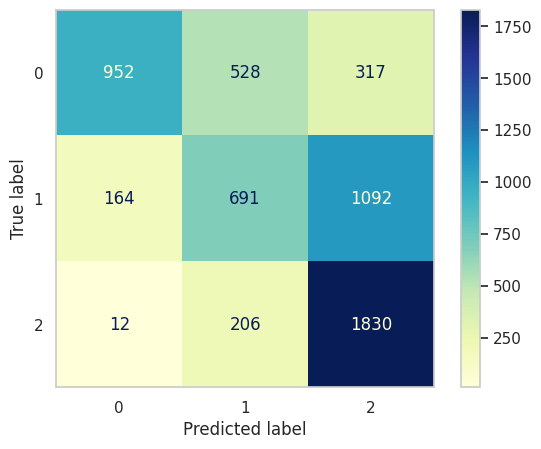

In [81]:
# Visualize confusion matrix 

print("Accuracy on test data: {:,.2f}". format(gnb_model.score(X_test, y_test)))
plot_confusion_matrix(gnb_model, X_test, y_test, values_format=".4g", cmap="YlGnBu")
plt.grid(False);

In [82]:
# Classification Scores GBN on the test data
accuracy_gnb_test = metrics.accuracy_score(y_test, gnb_pred).round(2)
recall_gnb_test = metrics.recall_score(y_test, gnb_pred, average="macro").round(2)
precision_gnb_test = metrics.precision_score(y_test, gnb_pred, average="macro").round(2)
f1_score_gnb_test = metrics.f1_score(y_test, gnb_pred, average="macro").round(2)

print('Accuracy score for the test data: ', accuracy_gnb_test) 
print('Recall score for test data: ', recall_gnb_test)
print('Precision score for test data: ', precision_gnb_test)
print('F1 score for test data: ', f1_score_gnb_test)

Accuracy score for the test data:  0.6
Recall score for test data:  0.59
Precision score for test data:  0.63
F1 score for test data:  0.58


In [83]:
# AUC for GNB on Test Data
from sklearn.preprocessing import LabelBinarizer

def multiclass_roc_auc_score(y_test, gnb_pred, average="macro"):
    Lb = LabelBinarizer()
    Lb.fit(y_test)
    y_test = Lb.transform(y_test)
    gnb_pred = Lb.transform(gnb_pred)
    return roc_auc_score(y_test, gnb_pred, average=average)

gnb_roc_auc_test = multiclass_roc_auc_score(y_test, gnb_pred).round(2)
gnb_roc_auc_test

0.69

AUC_GNB for test data: 0.69


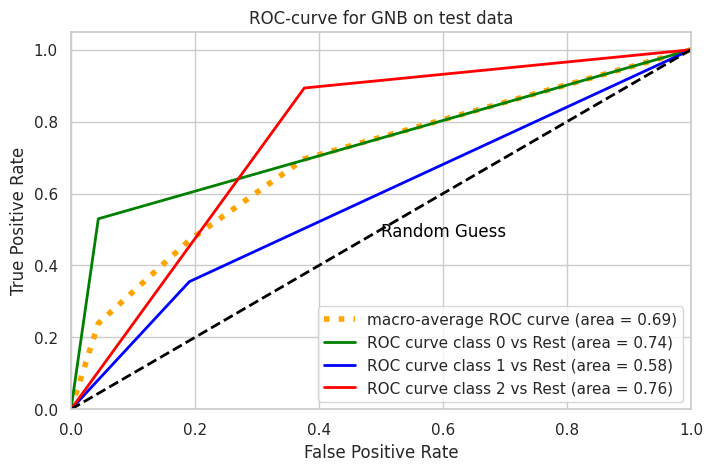

In [84]:
# Plot ROC Curve GNB on the test data
from numpy.lib.function_base import interp

print("AUC_GNB for test data:", gnb_roc_auc_test)
t1=sum(x==0 for x in gnb_pred-y_test)/len(gnb_pred)
n_classes=3

### MACRO
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(np.array(pd.get_dummies(y_test))[:, i], np.array(pd.get_dummies(gnb_pred))[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += interp(all_fpr, fpr[i], tpr[i])

mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

lw=2
plt.figure(figsize=(8,5))
plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='orange', linestyle=':', linewidth=4)

colors = cycle(['green', 'blue', 'red'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve class {0} vs Rest (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--',color='black', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.annotate('Random Guess',(.5,.48),color='black')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC-curve for GNB on test data')
plt.legend(loc="lower right")
plt.show()

In [85]:
# Classification Scores GNB on training data

accuracy_gnb_train = metrics.accuracy_score(y_train, gnb_model.predict(X_train)).round(2)
recall_gnb_train = metrics.recall_score(y_train, gnb_model.predict(X_train), average="macro").round(2)
precision_gnb_train = metrics.precision_score(y_train, gnb_model.predict(X_train), average="macro").round(2)
f1_score_gnb_train = metrics.f1_score(y_train, gnb_model.predict(X_train), average="macro").round(2)

print('Accuracy score for training data: ', accuracy_gnb_train) 
print('Recall score for training data: ', recall_gnb_train)
print('Precision score for training data: ', precision_gnb_train)
print('F1 score for training data: ', f1_score_gnb_train)

Accuracy score for training data:  0.6
Recall score for training data:  0.59
Precision score for training data:  0.63
F1 score for training data:  0.58


In [86]:
# AUC for GNB on Training Data
from sklearn.preprocessing import LabelBinarizer

gnb_pred_train = gnb_model.predict(X_train)

def multiclass_roc_auc_score(y_train, gnb_pred_train, average="macro"):
    Lb = LabelBinarizer()
    Lb.fit(y_train)
    y_train = Lb.transform(y_train)
    gnb_pred_train = Lb.transform(gnb_pred_train)
    return roc_auc_score(y_train, gnb_pred_train, average=average)

gnb_roc_auc_train = multiclass_roc_auc_score(y_train, gnb_pred_train).round(2)
gnb_roc_auc_train

0.69

### **K-Nearest Neighbors (KNN)**

In [87]:
# Finding the best k
error_rate=[] # list that will store the average error rate value of k
for k in range (1,31):  # Took the range of k from 1 to 30
    clf=KNeighborsClassifier(n_neighbors=k)
    clf.fit(X_train,y_train)
    predict_i=clf.predict(X_test)
    error_rate.append(np.mean(predict_i!=y_test))
error_rate

[0.12016574585635359,
 0.13121546961325967,
 0.13656767955801105,
 0.13415055248618785,
 0.14727209944751382,
 0.14071132596685082,
 0.14761740331491713,
 0.14381906077348067,
 0.1559046961325967,
 0.15037983425414364,
 0.15711325966850828,
 0.1538328729281768,
 0.16263812154696133,
 0.15918508287292818,
 0.1640193370165746,
 0.16056629834254144,
 0.16522790055248618,
 0.16039364640883977,
 0.1667817679558011,
 0.1640193370165746,
 0.16971685082872928,
 0.16488259668508287,
 0.17178867403314918,
 0.1691988950276243,
 0.1752417127071823,
 0.17040745856353592,
 0.17834944751381215,
 0.174896408839779,
 0.17955801104972377,
 0.1781767955801105]

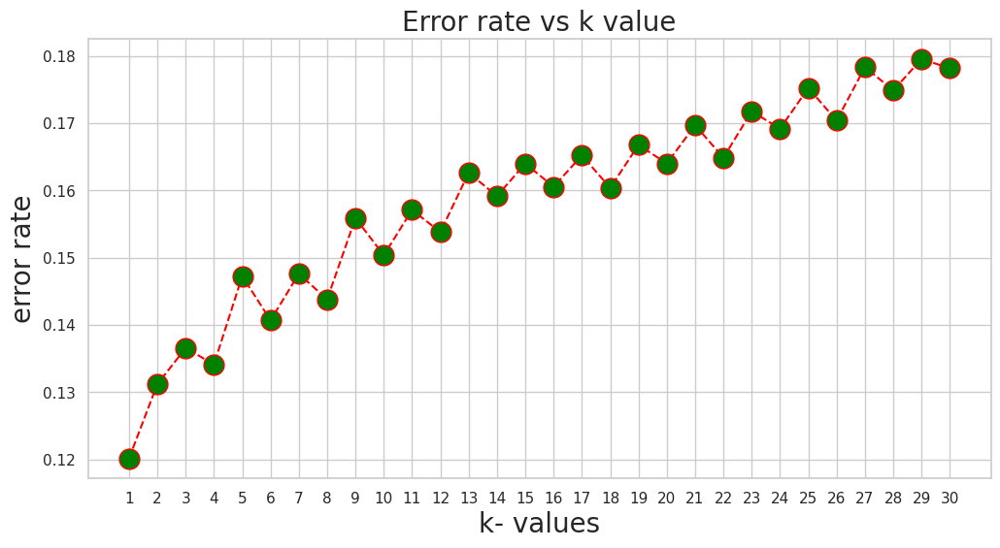

In [88]:
#plotting the error rate vs k graph 
plt.figure(figsize=(12,6))
plt.plot(range(1,31),error_rate,marker="o",markerfacecolor="green",
         linestyle="dashed",color="red",markersize=15)
plt.title("Error rate vs k value",fontsize=20)
plt.xlabel("k- values",fontsize=20)
plt.ylabel("error rate",fontsize=20)
plt.xticks(range(1,31))
plt.show()

In [89]:
# Model training and fitting
k = 1
knn = KNeighborsClassifier(n_neighbors = k, weights='uniform', p=3)
knn_model = knn.fit(X_train, y_train)

# Model prediction
knn_pred = knn_model.predict(X_test)
knn_pred_train = knn_model.predict(X_train)

print("Accuracy on test data: {:,.2f}". format(knn_model.score(X_test, y_test)))
print("Accuracy on training data: {:,.2f}". format(knn_model.score(X_train, y_train)))

Accuracy on test data: 0.88
Accuracy on training data: 1.00


In [90]:
# Evaluation of the Model on test data

# Print the Confusion Matrix and slice it into four pieces
cm_knn = confusion_matrix(y_test, knn_pred)
print('Confusion matrix\n\n', cm_knn)

# Class 0
TP_0 = cm_knn[0,0]                  
FP_0 = cm_knn[0,1]+cm_knn[0,2]
TN_0 = cm_knn[1,1]+cm_knn[1,2]+cm_knn[2,1]+cm_knn[2,2]       
FN_0 = cm_knn[1,0]+cm_knn[2,0]
      
# Class 1
TP_1 = cm_knn[1,1]                   
FP_1 = cm_knn[1,0]+cm_knn[1,2]
TN_1 = cm_knn[0,0]+cm_knn[0,2]+cm_knn[2,0]+cm_knn[2,2]       
FN_1 = cm_knn[0,1]+cm_knn[2,1]

# Class 2
TP_2 = cm_knn[2,2]                   
FP_2 = cm_knn[2,0]+cm_knn[2,1]
TN_2 = cm_knn[0,0]+cm_knn[0,1]+cm_knn[1,0]+cm_knn[1,1]       
FN_2 = cm_knn[0,2]+cm_knn[1,2]

# Summarize Confusion Matrix
print('\nclass 0:', TP_0,  FP_0, TN_0,  FN_0)
print('\nclass 1:', TP_1,  FP_1, TN_1,  FN_1)
print('\nclass 2:', TP_2,  FP_2, TN_2,  FN_2)

True_positive_knn = TP_0 + TP_1 + TP_2
False_positive_knn = FP_0 + FP_1 + FP_2
True_negative_knn = TN_0 + TN_1 + TN_2
False_negative_knn = FN_0 + FN_1 + FN_2

print('')

print('\nTrue Positives(TP) =', True_positive_knn)
print('\nFalse Positives(FP) =', False_positive_knn)
print('\nTrue Negatives(FP) =', True_negative_knn)
print('\nFalse Negative:=', False_negative_knn)

Confusion matrix

 [[1511  279    7]
 [  72 1645  230]
 [   4  124 1920]]

class 0: 1511 286 3919 76

class 1: 1645 302 3442 403

class 2: 1920 128 3507 237


True Positives(TP) = 5076

False Positives(FP) = 716

True Negatives(FP) = 10868

False Negative:= 716


Accuracy on test data: 0.88


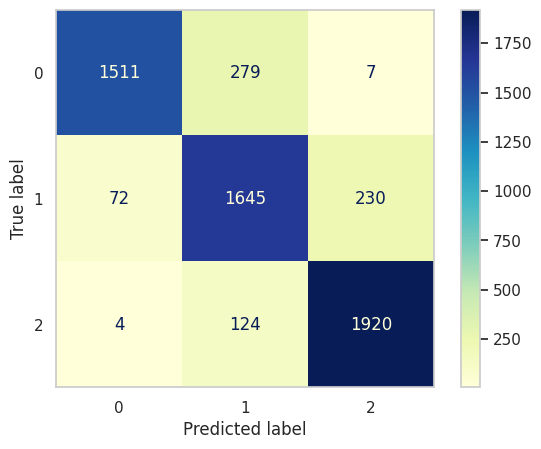

In [91]:
# Visualize confusion matrix 

print("Accuracy on test data: {:,.2f}". format(knn_model.score(X_test, y_test)))
plot_confusion_matrix(knn_model, X_test, y_test, values_format=".4g", cmap="YlGnBu")
plt.grid(False);

In [92]:
# Classification Scores KNN on the test data
accuracy_knn_test = metrics.accuracy_score(y_test, knn_pred).round(2)
recall_knn_test = metrics.recall_score(y_test, knn_pred, average="macro").round(2)
precision_knn_test = metrics.precision_score(y_test, knn_pred, average="macro").round(2)
f1_score_knn_test = metrics.f1_score(y_test, knn_pred, average="macro").round(2)

print('Accuracy score for the test data: ', accuracy_knn_test) 
print('Recall score for test data: ', recall_knn_test)
print('Precision score for test data: ', precision_knn_test)
print('F1 score for test data: ', f1_score_knn_test)

Accuracy score for the test data:  0.88
Recall score for test data:  0.87
Precision score for test data:  0.88
F1 score for test data:  0.88


In [93]:
# AUC for KNN on Test Data
from sklearn.preprocessing import LabelBinarizer

def multiclass_roc_auc_score(y_test, knn_pred, average="macro"):
    Lb = LabelBinarizer()
    Lb.fit(y_test)
    y_test = Lb.transform(y_test)
    knn_pred = Lb.transform(knn_pred)
    return roc_auc_score(y_test, knn_pred, average=average)

knn_roc_auc_test = multiclass_roc_auc_score(y_test, knn_pred).round(2)
knn_roc_auc_test

0.91

AUC_knn for test data: 0.91


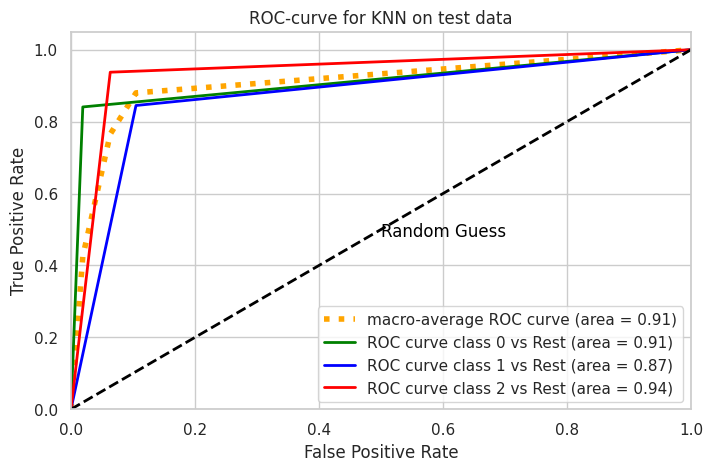

In [94]:
# Plot ROC Curve KNN on the test data
from numpy.lib.function_base import interp

print("AUC_knn for test data:", knn_roc_auc_test)
t1=sum(x==0 for x in knn_pred-y_test)/len(knn_pred)
n_classes=3

### MACRO
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(np.array(pd.get_dummies(y_test))[:, i], np.array(pd.get_dummies(knn_pred))[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += interp(all_fpr, fpr[i], tpr[i])

mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

lw=2
plt.figure(figsize=(8,5))
plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='orange', linestyle=':', linewidth=4)

colors = cycle(['green', 'blue', 'red'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve class {0} vs Rest (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--',color='black', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.annotate('Random Guess',(.5,.48),color='black')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC-curve for KNN on test data')
plt.legend(loc="lower right")
plt.show()

In [95]:
# Classification Scores KNN on training data
accuracy_knn_train = metrics.accuracy_score(y_train, knn_model.predict(X_train)).round(2)
recall_knn_train = metrics.recall_score(y_train, knn_model.predict(X_train), average="macro").round(2)
precision_knn_train = metrics.precision_score(y_train, knn_model.predict(X_train), average="macro").round(2)
f1_score_knn_train = metrics.f1_score(y_train, knn_model.predict(X_train), average="macro").round(2)

print('Accuracy score for training data: ', accuracy_knn_train)
print('Recall score for training data: ', recall_knn_train)
print('Precision score for training data: ', precision_knn_train)
print('F1 score for training data: ', f1_score_knn_train)

Accuracy score for training data:  1.0
Recall score for training data:  1.0
Precision score for training data:  1.0
F1 score for training data:  1.0


In [96]:
# AUC for KNN on Training Data
from sklearn.preprocessing import LabelBinarizer

knn_pred_train = knn_model.predict(X_train)

def multiclass_roc_auc_score(y_train, knn_pred_train, average="macro"):
    Lb = LabelBinarizer()
    Lb.fit(y_train)
    y_train = Lb.transform(y_train)
    knn_pred_train = Lb.transform(knn_pred_train)
    return roc_auc_score(y_train, knn_pred_train, average=average)

knn_roc_auc_train = multiclass_roc_auc_score(y_train, knn_pred_train).round(2)
knn_roc_auc_train

1.0

## **2- Black-box Models**

### **Support Vector Machine (SVC)**

In [97]:
# Gridsearch to determine the value of cost (C) and gamma
svc = SVC(kernel = 'rbf', class_weight='balanced', probability=False, random_state=seed)

param_grid = {'C':[0.1, 1, 5, 10], 'gamma':[1, 10, 100]}
svc_cv = GridSearchCV(svc, param_grid, cv=3, refit=True)
svc_cv.fit(X_train, y_train)
print(svc_cv.best_params_)

{'C': 10, 'gamma': 10}


In [98]:
# Model training and fitting
svc_model = svc_cv.best_estimator_
svc_model.fit(X_train, y_train)

# Model prediction
svc_pred = svc_model.predict(X_test)
svc_pred_train = svc_model.predict(X_train)

print("Accuracy on test data: {:,.2f}". format(svc_model.score(X_test, y_test)))
print("Accuracy on training data: {:,.2f}". format(svc_model.score(X_train, y_train)))

Accuracy on test data: 0.92
Accuracy on training data: 0.94


In [99]:
# Evaluation of the Model on test data

# Print the Confusion Matrix and slice it into four pieces
cm_svc = confusion_matrix(y_test, svc_pred)
print('Confusion matrix\n\n', cm_svc)

# Class 0
TP_0 = cm_svc[0,0]                  
FP_0 = cm_svc[0,1]+cm_svc[0,2]
TN_0 = cm_svc[1,1]+cm_svc[1,2]+cm_svc[2,1]+cm_svc[2,2]       
FN_0 = cm_svc[1,0]+cm_svc[2,0]
      
# Class 1
TP_1 = cm_svc[1,1]                   
FP_1 = cm_svc[1,0]+cm_svc[1,2]
TN_1 = cm_svc[0,0]+cm_svc[0,2]+cm_svc[2,0]+cm_svc[2,2]       
FN_1 = cm_svc[0,1]+cm_svc[2,1]

# Class 2
TP_2 = cm_svc[2,2]                   
FP_2 = cm_svc[2,0]+cm_svc[2,1]
TN_2 = cm_svc[0,0]+cm_svc[0,1]+cm_svc[1,0]+cm_svc[1,1]       
FN_2 = cm_svc[0,2]+cm_svc[1,2]

# Summarize Confusion Matrix
print('\nclass 0:', TP_0,  FP_0, TN_0,  FN_0)
print('\nclass 1:', TP_1,  FP_1, TN_1,  FN_1)
print('\nclass 2:', TP_2,  FP_2, TN_2,  FN_2)

True_positive_svc = TP_0 + TP_1 + TP_2
False_positive_svc = FP_0 + FP_1 + FP_2
True_negative_svc = TN_0 + TN_1 + TN_2
False_negative_svc = FN_0 + FN_1 + FN_2

print('')

print('\nTrue Positives(TP) =', True_positive_svc)
print('\nFalse Positives(FP) =', False_positive_svc)
print('\nTrue Negatives(FP) =', True_negative_svc)
print('\nFalse Negative:=', False_negative_svc)

Confusion matrix

 [[1688  108    1]
 [  36 1722  189]
 [   0  106 1942]]

class 0: 1688 109 3959 36

class 1: 1722 225 3631 214

class 2: 1942 106 3554 190


True Positives(TP) = 5352

False Positives(FP) = 440

True Negatives(FP) = 11144

False Negative:= 440


Accuracy on test data: 0.92


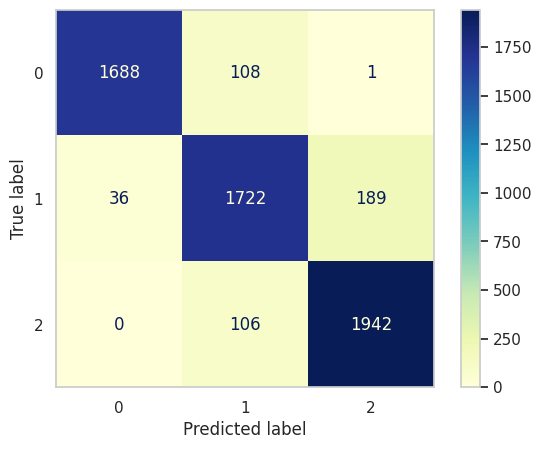

In [100]:
# Visualize confusion matrix 

print("Accuracy on test data: {:,.2f}". format(svc_model.score(X_test, y_test)))
plot_confusion_matrix(svc_model, X_test, y_test, values_format=".4g", cmap="YlGnBu")
plt.grid(False);

In [101]:
# Classification Scores SVC on the test data
accuracy_svc_test = metrics.accuracy_score(y_test, svc_pred).round(2)
recall_svc_test = metrics.recall_score(y_test, svc_pred, average="macro").round(2)
precision_svc_test = metrics.precision_score(y_test, svc_pred, average="macro").round(2)
f1_score_svc_test = metrics.f1_score(y_test, svc_pred, average="macro").round(2)

print('Accuracy score for the test data: ', accuracy_svc_test) 
print('Recall score for test data: ', recall_svc_test)
print('Precision score for test data: ', precision_svc_test)
print('F1 score for test data: ', f1_score_svc_test)

Accuracy score for the test data:  0.92
Recall score for test data:  0.92
Precision score for test data:  0.93
F1 score for test data:  0.92


In [102]:
# AUC for SVC on Test Data
from sklearn.preprocessing import LabelBinarizer

def multiclass_roc_auc_score(y_test, svc_pred, average="macro"):
    Lb = LabelBinarizer()
    Lb.fit(y_test)
    y_test = Lb.transform(y_test)
    svc_pred = Lb.transform(svc_pred)
    return roc_auc_score(y_test, svc_pred, average=average)

svc_roc_auc_test = multiclass_roc_auc_score(y_test, svc_pred).round(2)
svc_roc_auc_test

0.94

AUC_svc for test data: 0.94


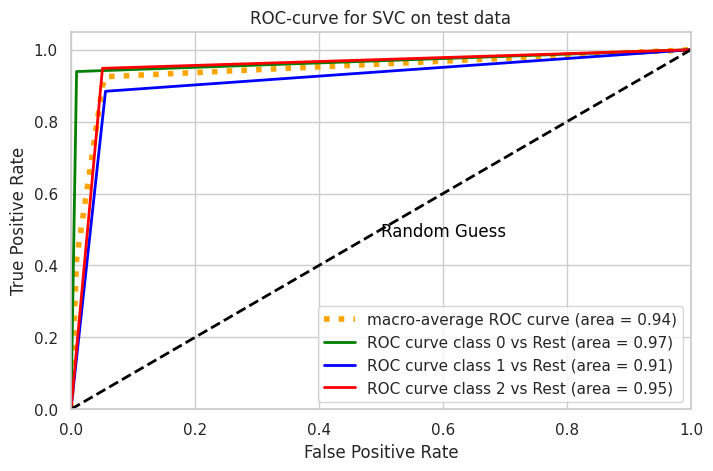

In [103]:
# Plot ROC Curve SVC on the test data
from numpy.lib.function_base import interp

print("AUC_svc for test data:", svc_roc_auc_test)
t1=sum(x==0 for x in svc_pred-y_test)/len(svc_pred)
n_classes=3

### MACRO
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(np.array(pd.get_dummies(y_test))[:, i], np.array(pd.get_dummies(svc_pred))[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += interp(all_fpr, fpr[i], tpr[i])

mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

lw=2
plt.figure(figsize=(8,5))
plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='orange', linestyle=':', linewidth=4)

colors = cycle(['green', 'blue', 'red'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve class {0} vs Rest (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--',color='black', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.annotate('Random Guess',(.5,.48),color='black')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC-curve for SVC on test data')
plt.legend(loc="lower right")
plt.show()

In [104]:
# Classification Scores SVC on training data
accuracy_svc_train = metrics.accuracy_score(y_train, svc_model.predict(X_train)).round(2)
recall_svc_train = metrics.recall_score(y_train, svc_model.predict(X_train), average="macro").round(2)
precision_svc_train = metrics.precision_score(y_train, svc_model.predict(X_train), average="macro").round(2)
f1_score_svc_train = metrics.f1_score(y_train, svc_model.predict(X_train), average="macro").round(2)

print('Accuracy score for training data: ', accuracy_svc_train)
print('Recall score for training data: ', recall_svc_train)
print('Precision score for training data: ', precision_svc_train)
print('F1 score for training data: ', f1_score_svc_train)

Accuracy score for training data:  0.94
Recall score for training data:  0.94
Precision score for training data:  0.94
F1 score for training data:  0.94


In [105]:
# AUC for SVC on Training Data
from sklearn.preprocessing import LabelBinarizer

svc_pred_train = svc_model.predict(X_train)

def multiclass_roc_auc_score(y_train, svc_pred_train, average="macro"):
    Lb = LabelBinarizer()
    Lb.fit(y_train)
    y_train = Lb.transform(y_train)
    svc_pred_train = Lb.transform(svc_pred_train)
    return roc_auc_score(y_train, svc_pred_train, average=average)

svc_roc_auc_train = multiclass_roc_auc_score(y_train, svc_pred_train).round(2)
svc_roc_auc_train

0.96

### **Random Forest (RF)**

In [106]:
# Gridsearch to determine the values of Parameters

rf = RandomForestClassifier(class_weight= 'balanced', bootstrap = 'True', random_state=seed)

# Gridsearch to determine the value
param_grid = {'n_estimators':[200],'min_samples_split':[1,2,3], 
              'criterion' : ['gini','entropy'], 'max_depth': [10,20,50]}

rf_cv = GridSearchCV(rf, param_grid, cv = 3, refit=True)
rf_cv.fit(X_train, y_train)
print(rf_cv.best_params_)

{'criterion': 'gini', 'max_depth': 50, 'min_samples_split': 2, 'n_estimators': 200}


In [107]:
# Model training and fitting
rf_model = rf_cv.best_estimator_
rf_model.fit(X_train, y_train)

# Model prediction
rf_pred = rf_model.predict(X_test)
rf_pred_train = rf_model.predict(X_train)

print("Accuracy on test data: {:,.2f}". format(rf_model.score(X_test, y_test)))
print("Accuracy on training data: {:,.2f}". format(rf_model.score(X_train, y_train)))

Accuracy on test data: 0.94
Accuracy on training data: 1.00


In [108]:
# Evaluation of the Model on test data

# Print the Confusion Matrix and slice it into four pieces
cm_rf = confusion_matrix(y_test, rf_pred)
print('Confusion matrix\n\n', cm_rf)

# Class 0
TP_0 = cm_rf[0,0]                  
FP_0 = cm_rf[0,1]+cm_rf[0,2]
TN_0 = cm_rf[1,1]+cm_rf[1,2]+cm_rf[2,1]+cm_rf[2,2]       
FN_0 = cm_rf[1,0]+cm_rf[2,0]
      
# Class 1
TP_1 = cm_rf[1,1]                   
FP_1 = cm_rf[1,0]+cm_rf[1,2]
TN_1 = cm_rf[0,0]+cm_rf[0,2]+cm_rf[2,0]+cm_rf[2,2]       
FN_1 = cm_rf[0,1]+cm_rf[2,1]

# Class 2
TP_2 = cm_rf[2,2]                   
FP_2 = cm_rf[2,0]+cm_rf[2,1]
TN_2 = cm_rf[0,0]+cm_rf[0,1]+cm_rf[1,0]+cm_rf[1,1]       
FN_2 = cm_rf[0,2]+cm_rf[1,2]

# Summarize Confusion Matrix
print('\nclass 0:', TP_0,  FP_0, TN_0,  FN_0)
print('\nclass 1:', TP_1,  FP_1, TN_1,  FN_1)
print('\nclass 2:', TP_2,  FP_2, TN_2,  FN_2)

True_positive_rf = TP_0 + TP_1 + TP_2
False_positive_rf = FP_0 + FP_1 + FP_2
True_negative_rf = TN_0 + TN_1 + TN_2
False_negative_rf = FN_0 + FN_1 + FN_2

print('')

print('\nTrue Positives(TP) =', True_positive_rf)
print('\nFalse Positives(FP) =', False_positive_rf)
print('\nTrue Negatives(FP) =', True_negative_rf)
print('\nFalse Negative:=', False_negative_rf)

Confusion matrix

 [[1676  121    0]
 [  53 1773  121]
 [   1   54 1993]]

class 0: 1676 121 3941 54

class 1: 1773 174 3670 175

class 2: 1993 55 3623 121


True Positives(TP) = 5442

False Positives(FP) = 350

True Negatives(FP) = 11234

False Negative:= 350


Accuracy on test data: 0.94


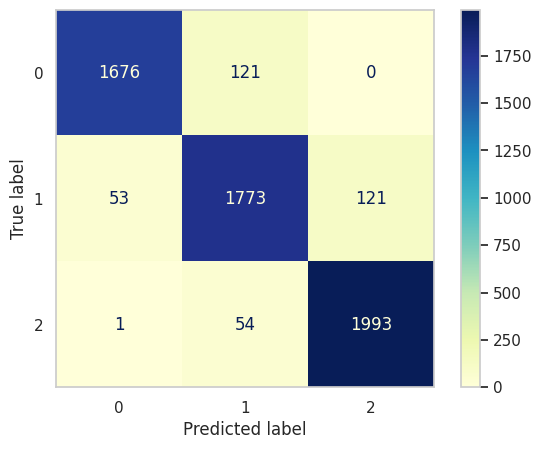

In [109]:
# Visualize confusion matrix 

print("Accuracy on test data: {:,.2f}". format(rf_model.score(X_test, y_test)))
plot_confusion_matrix(rf_model, X_test, y_test, values_format=".4g", cmap="YlGnBu")
plt.grid(False);

In [110]:
# Classification Scores RF on the test data
accuracy_rf_test = metrics.accuracy_score(y_test, rf_pred).round(2)
recall_rf_test = metrics.recall_score(y_test, rf_pred, average="macro").round(2)
precision_rf_test = metrics.precision_score(y_test, rf_pred, average="macro").round(2)
f1_score_rf_test = metrics.f1_score(y_test, rf_pred, average="macro").round(2)

print('Accuracy score for the test data: ', accuracy_rf_test) 
print('Recall score for test data: ', recall_rf_test)
print('Precision score for test data: ', precision_rf_test)
print('F1 score for test data: ', f1_score_rf_test)

Accuracy score for the test data:  0.94
Recall score for test data:  0.94
Precision score for test data:  0.94
F1 score for test data:  0.94


In [111]:
# AUC for RF on Test Data
from sklearn.preprocessing import LabelBinarizer

def multiclass_roc_auc_score(y_test, rf_pred, average="macro"):
    Lb = LabelBinarizer()
    Lb.fit(y_test)
    y_test = Lb.transform(y_test)
    rf_pred = Lb.transform(rf_pred)
    return roc_auc_score(y_test, rf_pred, average=average)

rf_roc_auc_test = multiclass_roc_auc_score(y_test, rf_pred).round(2)
rf_roc_auc_test

0.95

AUC_rf for test data: 0.95


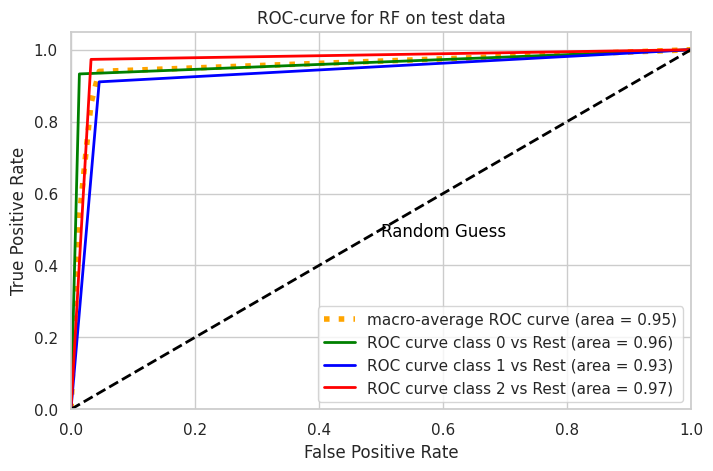

In [112]:
# Plot ROC Curve RF on the test data
from numpy.lib.function_base import interp

print("AUC_rf for test data:", rf_roc_auc_test)
t1=sum(x==0 for x in rf_pred-y_test)/len(rf_pred)
n_classes=3

### MACRO
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(np.array(pd.get_dummies(y_test))[:, i], np.array(pd.get_dummies(rf_pred))[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += interp(all_fpr, fpr[i], tpr[i])

mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

lw=2
plt.figure(figsize=(8,5))
plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='orange', linestyle=':', linewidth=4)

colors = cycle(['green', 'blue', 'red'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve class {0} vs Rest (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--',color='black', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.annotate('Random Guess',(.5,.48),color='black')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC-curve for RF on test data')
plt.legend(loc="lower right")
plt.show()

In [113]:
# Classification Scores RF on training data
accuracy_rf_train = metrics.accuracy_score(y_train, rf_model.predict(X_train)).round(2)
recall_rf_train = metrics.recall_score(y_train, rf_model.predict(X_train), average="macro").round(2)
precision_rf_train = metrics.precision_score(y_train, rf_model.predict(X_train), average="macro").round(2)
f1_score_rf_train = metrics.f1_score(y_train, rf_model.predict(X_train), average="macro").round(2)

print('Accuracy score of RF for training data: ', accuracy_rf_train) 
print('Recall score for training data: ', recall_rf_train)
print('Precision score training data: ', precision_rf_train)
print('F1 score training data: ', f1_score_rf_train)

Accuracy score of RF for training data:  1.0
Recall score for training data:  1.0
Precision score training data:  1.0
F1 score training data:  1.0


In [114]:
# AUC for RF on Training Data
from sklearn.preprocessing import LabelBinarizer

rf_pred_train = rf_model.predict(X_train)

def multiclass_roc_auc_score(y_train, rf_pred_train, average="macro"):
    Lb = LabelBinarizer()
    Lb.fit(y_train)
    y_train = Lb.transform(y_train)
    rf_pred_train = Lb.transform(rf_pred_train)
    return roc_auc_score(y_train, rf_pred_train, average=average)

rf_roc_auc_train = multiclass_roc_auc_score(y_train, rf_pred_train).round(2)
rf_roc_auc_train

1.0

### **Neural Network (NN)**

In [115]:
# Gridsearch to determine the value
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(random_state=seed, activation = 'relu')

param_grid = {'hidden_layer_sizes' : [(5,),(10,)], 'solver': ['sgd', 'adam'], 
              'max_iter' : [200,1000],'alpha' : [0.0001,0.0005]
              }
nn_cv = GridSearchCV(mlp, param_grid, cv=3, refit=True)
nn_cv.fit(X_train, y_train)
print(nn_cv.best_params_)

{'alpha': 0.0005, 'hidden_layer_sizes': (10,), 'max_iter': 1000, 'solver': 'adam'}


In [116]:
# Model training and fitting
nn_model = nn_cv.best_estimator_
nn_model.fit(X_train, y_train)

# Model prediction
nn_pred = nn_model.predict(X_test)
nn_pred_train = nn_model.predict(X_train)

print("Accuracy on test data: {:,.2f}". format(nn_model.score(X_test, y_test)))
print("Accuracy on training data: {:,.2f}". format(nn_model.score(X_train, y_train)))

Accuracy on test data: 0.92
Accuracy on training data: 0.92


In [117]:
# Evaluation of the Model on test data

# Print the Confusion Matrix and slice it into four pieces
cm_nn = confusion_matrix(y_test, nn_pred)
print('Confusion matrix\n\n', cm_nn)

# Class 0
TP_0 = cm_nn[0,0]                  
FP_0 = cm_nn[0,1]+cm_nn[0,2]
TN_0 = cm_nn[1,1]+cm_nn[1,2]+cm_nn[2,1]+cm_nn[2,2]       
FN_0 = cm_nn[1,0]+cm_nn[2,0]
      
# Class 1
TP_1 = cm_nn[1,1]                   
FP_1 = cm_nn[1,0]+cm_nn[1,2]
TN_1 = cm_nn[0,0]+cm_nn[0,2]+cm_nn[2,0]+cm_nn[2,2]       
FN_1 = cm_nn[0,1]+cm_nn[2,1]

# Class 2
TP_2 = cm_nn[2,2]                   
FP_2 = cm_nn[2,0]+cm_nn[2,1]
TN_2 = cm_nn[0,0]+cm_nn[0,1]+cm_nn[1,0]+cm_nn[1,1]       
FN_2 = cm_nn[0,2]+cm_nn[1,2]

# Summarize Confusion Matrix
print('\nclass 0:', TP_0,  FP_0, TN_0,  FN_0)
print('\nclass 1:', TP_1,  FP_1, TN_1,  FN_1)
print('\nclass 2:', TP_2,  FP_2, TN_2,  FN_2)

True_positive_nn = TP_0 + TP_1 + TP_2
False_positive_nn = FP_0 + FP_1 + FP_2
True_negative_nn = TN_0 + TN_1 + TN_2
False_negative_nn = FN_0 + FN_1 + FN_2

print('')

print('\nTrue Positives(TP) =', True_positive_nn)
print('\nFalse Positives(FP) =', False_positive_nn)
print('\nTrue Negatives(FP) =', True_negative_nn)
print('\nFalse Negative:=', False_negative_nn)

Confusion matrix

 [[1697   99    1]
 [  43 1695  209]
 [   0  123 1925]]

class 0: 1697 100 3952 43

class 1: 1695 252 3623 222

class 2: 1925 123 3534 210


True Positives(TP) = 5317

False Positives(FP) = 475

True Negatives(FP) = 11109

False Negative:= 475


Accuracy on test data: 0.92


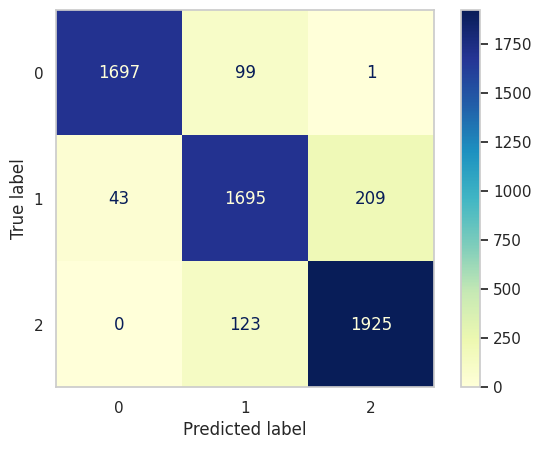

In [118]:
# Visualize confusion matrix 

print("Accuracy on test data: {:,.2f}". format(nn_model.score(X_test, y_test)))
plot_confusion_matrix(nn_model, X_test, y_test, values_format=".4g", cmap="YlGnBu")
plt.grid(False);

In [119]:
# Classification Scores NN on test data

accuracy_nn_test = metrics.accuracy_score(y_test, nn_pred).round(2)
recall_nn_test = metrics.recall_score(y_test, nn_pred, average="macro").round(2)
precision_nn_test = metrics.precision_score(y_test, nn_pred, average="macro").round(2)
f1_score_nn_test = metrics.f1_score(y_test, nn_pred, average="macro").round(2)

print('Accuracy score for the test data: ', accuracy_nn_test) 
print('Recall score for test data: ', recall_nn_test)
print('Precision score for test data: ', precision_nn_test)
print('F1 score for test data: ', f1_score_nn_test)

Accuracy score for the test data:  0.92
Recall score for test data:  0.92
Precision score for test data:  0.92
F1 score for test data:  0.92


In [120]:
# AUC for NN on Test Data
from sklearn.preprocessing import LabelBinarizer

def multiclass_roc_auc_score(y_test, nn_pred, average="macro"):
    Lb = LabelBinarizer()
    Lb.fit(y_test)
    y_test = Lb.transform(y_test)
    nn_pred = Lb.transform(nn_pred)
    return roc_auc_score(y_test, nn_pred, average=average)

nn_roc_auc_test = multiclass_roc_auc_score(y_test, nn_pred).round(2)
nn_roc_auc_test

0.94

AUC_nn for test data: 0.94


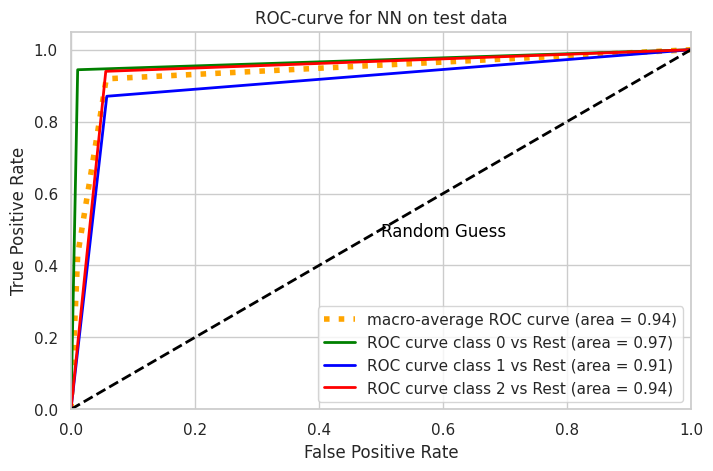

In [121]:
# Plot ROC Curve NN on the test data

print("AUC_nn for test data:", nn_roc_auc_test)
from numpy.lib.function_base import interp
t1=sum(x==0 for x in nn_pred-y_test)/len(nn_pred)
n_classes=3

### MACRO
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(np.array(pd.get_dummies(y_test))[:, i], np.array(pd.get_dummies(nn_pred))[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += interp(all_fpr, fpr[i], tpr[i])

mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

lw=2
plt.figure(figsize=(8,5))
plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='orange', linestyle=':', linewidth=4)

colors = cycle(['green', 'blue', 'red'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve class {0} vs Rest (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--',color='black', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.annotate('Random Guess',(.5,.48),color='black')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC-curve for NN on test data')
plt.legend(loc="lower right")
plt.show()

In [122]:
# Classification Scores NN on training data
accuracy_nn_train = metrics.accuracy_score(y_train, nn_model.predict(X_train)).round(2)
recall_nn_train = metrics.recall_score(y_train, nn_model.predict(X_train), average="macro").round(2)
precision_nn_train = metrics.precision_score(y_train, nn_model.predict(X_train), average="macro").round(2)
f1_score_nn_train = metrics.f1_score(y_train, nn_model.predict(X_train), average="macro").round(2)

print('Accuracy score for training data: ', accuracy_nn_train)
print('Recall score for training data: ', recall_nn_train)
print('Precision score for training data: ', precision_nn_train)
print('F1 score for training data: ', f1_score_nn_train)

Accuracy score for training data:  0.92
Recall score for training data:  0.92
Precision score for training data:  0.92
F1 score for training data:  0.92


In [123]:
# AUC for NN on Training Data
from sklearn.preprocessing import LabelBinarizer

nn_pred_train = nn_model.predict(X_train)

def multiclass_roc_auc_score(y_train, nn_pred_train, average="macro"):
    Lb = LabelBinarizer()
    Lb.fit(y_train)
    y_train = Lb.transform(y_train)
    nn_pred_train = Lb.transform(nn_pred_train)
    return roc_auc_score(y_train, nn_pred_train, average=average)

nn_roc_auc_train = multiclass_roc_auc_score(y_train, nn_pred_train).round(2)
nn_roc_auc_train

0.94

### **eXterne Gradient Boosting (XGBoost)**

In [124]:
# Gridsearch to determine the value
import xgboost as xgb
from xgboost import XGBClassifier

xgb = xgb.XGBClassifier(n_estimator= 20, random_state=seed)

param_grid = {"max_depth": [5], 
               "min_child_weight": [1,2,3],
               "learning_rate": [0.05, 0.1, 0.16]}

xgb_cv = GridSearchCV(xgb, param_grid, cv = 3, refit=True, verbose = 10, n_jobs=-1)
xgb_cv.fit(X_train, y_train)
print(xgb_cv.best_params_)

Fitting 3 folds for each of 9 candidates, totalling 27 fits
{'learning_rate': 0.16, 'max_depth': 5, 'min_child_weight': 1}


In [125]:
# Model training and fitting

xgb_model = xgb_cv.best_estimator_

xgb_model.fit(X_train, y_train)

# Model prediction
xgb_pred = xgb_model.predict(X_test)
xgb_pred_train = xgb_model.predict(X_train)

print("Accuracy on test data: {:,.2f}". format(xgb_model.score(X_test, y_test)))
print("Accuracy on training data: {:,.2f}". format(xgb_model.score(X_train, y_train)))

Accuracy on test data: 0.93
Accuracy on training data: 0.97


In [126]:
# Evaluation of the Model on test data

# Print the Confusion Matrix and slice it into four pieces
cm_xgb = confusion_matrix(y_test, xgb_pred)
print('Confusion matrix\n\n', cm_xgb)

# Class 0
TP_0 = cm_xgb[0,0]                  
FP_0 = cm_xgb[0,1]+cm_xgb[0,2]
TN_0 = cm_xgb[1,1]+cm_xgb[1,2]+cm_xgb[2,1]+cm_xgb[2,2]       
FN_0 = cm_xgb[1,0]+cm_xgb[2,0]
      
# Class 1
TP_1 = cm_xgb[1,1]                   
FP_1 = cm_xgb[1,0]+cm_xgb[1,2]
TN_1 = cm_xgb[0,0]+cm_xgb[0,2]+cm_xgb[2,0]+cm_xgb[2,2]       
FN_1 = cm_xgb[0,1]+cm_xgb[2,1]

# Class 2
TP_2 = cm_xgb[2,2]                   
FP_2 = cm_xgb[2,0]+cm_xgb[2,1]
TN_2 = cm_xgb[0,0]+cm_xgb[0,1]+cm_xgb[1,0]+cm_xgb[1,1]       
FN_2 = cm_xgb[0,2]+cm_xgb[1,2]

# Summarize Confusion Matrix
print('\nclass 0:', TP_0,  FP_0, TN_0,  FN_0)
print('\nclass 1:', TP_1,  FP_1, TN_1,  FN_1)
print('\nclass 2:', TP_2,  FP_2, TN_2,  FN_2)

True_positive_xgb = TP_0 + TP_1 + TP_2
False_positive_xgb = FP_0 + FP_1 + FP_2
True_negative_xgb = TN_0 + TN_1 + TN_2
False_negative_xgb = FN_0 + FN_1 + FN_2

print('')

print('\nTrue Positives(TP) =', True_positive_xgb)
print('\nFalse Positives(FP) =', False_positive_xgb)
print('\nTrue Negatives(FP) =', True_negative_xgb)
print('\nFalse Negative:=', False_negative_xgb)


Confusion matrix

 [[1675  121    1]
 [  26 1736  185]
 [   0   79 1969]]

class 0: 1675 122 3969 26

class 1: 1736 211 3645 200

class 2: 1969 79 3558 186


True Positives(TP) = 5380

False Positives(FP) = 412

True Negatives(FP) = 11172

False Negative:= 412


Accuracy on test data: 0.93


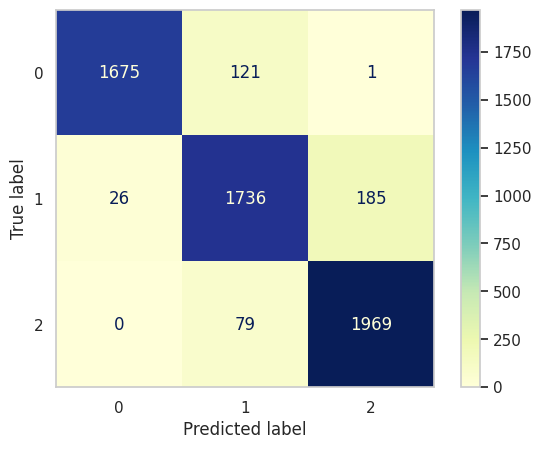

In [127]:
# Visualize confusion matrix 

print("Accuracy on test data: {:,.2f}". format(xgb_model.score(X_test, y_test)))
plot_confusion_matrix(xgb_model, X_test, y_test, values_format=".4g", cmap="YlGnBu")
plt.grid(False);

In [128]:
# Classification Scores XGBoost on the test data
accuracy_xgb_test = metrics.accuracy_score(y_test, xgb_pred).round(2)
recall_xgb_test = metrics.recall_score(y_test, xgb_pred, average="macro").round(2)
precision_xgb_test = metrics.precision_score(y_test, xgb_pred, average="macro").round(2)
f1_score_xgb_test = metrics.f1_score(y_test, xgb_pred, average="macro").round(2)

print('Accuracy score for test data: ', accuracy_xgb_test)
print('Recall score for test data: ', recall_xgb_test)
print('Precision score for test data: ', precision_xgb_test)
print('F1 score for test data: ', f1_score_xgb_test)

Accuracy score for test data:  0.93
Recall score for test data:  0.93
Precision score for test data:  0.93
F1 score for test data:  0.93


In [129]:
# AUC for XGBoost on Test Data
from sklearn.preprocessing import LabelBinarizer

def multiclass_roc_auc_score(y_test, xgb_pred, average="macro"):
    Lb = LabelBinarizer()
    Lb.fit(y_test)
    y_test = Lb.transform(y_test)
    xgb_pred = Lb.transform(xgb_pred)
    return roc_auc_score(y_test, xgb_pred, average=average)

xgb_roc_auc_test = multiclass_roc_auc_score(y_test, xgb_pred).round(2)
xgb_roc_auc_test

0.95

AUC_xgb for test data: 0.95


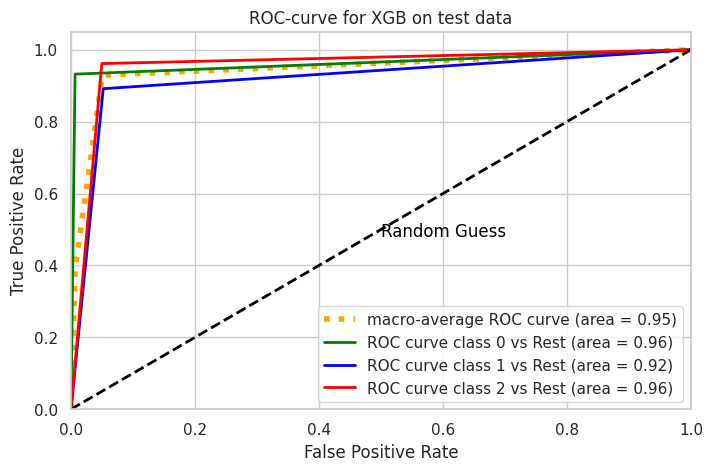

In [130]:
# Plot ROC Curve XGB on the test data
from numpy.lib.function_base import interp

print("AUC_xgb for test data:", xgb_roc_auc_test)
t1=sum(x==0 for x in xgb_pred-y_test)/len(xgb_pred)
n_classes=3

### MACRO
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(np.array(pd.get_dummies(y_test))[:, i], np.array(pd.get_dummies(xgb_pred))[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += interp(all_fpr, fpr[i], tpr[i])

mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

lw=2
plt.figure(figsize=(8,5))
plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='orange', linestyle=':', linewidth=4)

colors = cycle(['green', 'blue', 'red'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve class {0} vs Rest (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--',color='black', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.annotate('Random Guess',(.5,.48),color='black')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC-curve for XGB on test data')
plt.legend(loc="lower right")
plt.show()

In [131]:
# Classification Scores XGBoost on training data
accuracy_xgb_train = metrics.accuracy_score(y_train, xgb_model.predict(X_train)).round(2)
recall_xgb_train = metrics.recall_score(y_train, xgb_model.predict(X_train), average="macro").round(2)
precision_xgb_train = metrics.precision_score(y_train, xgb_model.predict(X_train), average="macro").round(2)
f1_score_xgb_train = metrics.f1_score(y_train, xgb_model.predict(X_train), average="macro").round(2)

print('Accuracy score for training data: ', accuracy_xgb_train) 
print('Recall score for training data: ', recall_xgb_train)
print('Precision score for training data: ', precision_xgb_train)
print('F1 score for training data: ', f1_score_xgb_train)

Accuracy score for training data:  0.97
Recall score for training data:  0.97
Precision score for training data:  0.97
F1 score for training data:  0.97


In [132]:
# AUC for XGBoost on Training Data
from sklearn.preprocessing import LabelBinarizer

xgb_pred_train = xgb_model.predict(X_train)

def multiclass_roc_auc_score(y_train, xgb_pred_train, average="macro"):
    Lb = LabelBinarizer()
    Lb.fit(y_train)
    y_train = Lb.transform(y_train)
    xgb_pred_train = Lb.transform(xgb_pred_train)
    return roc_auc_score(y_train, xgb_pred_train, average=average)

xgb_roc_auc_train = multiclass_roc_auc_score(y_train, xgb_pred_train).round(2)
xgb_roc_auc_train

0.98

## **Summary of the results**

In [133]:
# Result table of the white-box models on the test data

class_metrics = pd.DataFrame({
    'Models': ['Logistic Reg', 'Decision Tree', 'GaussianNB', 'KNN'],
    'accuracy_test': [accuracy_logist_test, accuracy_dt_test, accuracy_gnb_test, accuracy_knn_test],
    'recall_test': [recall_logist_test, recall_dt_test, recall_gnb_test, recall_knn_test],
    'precision_test': [precision_logist_test, precision_dt_test, precision_gnb_test, precision_knn_test],   
    'f1_test': [f1_score_logist_test, f1_score_dt_test, f1_score_gnb_test, f1_score_knn_test], 
    'AUC_test': [logist_roc_auc_test, dt_roc_auc_test, gnb_roc_auc_test, knn_roc_auc_test],      
    })
result_metrics= class_metrics.set_index('Models')

with pd.option_context('display.precision', 3):
    result = result_metrics.sort_values(by='AUC_test', ascending=False).style.\
        background_gradient(cmap='plasma', low=0.43, high=0.63,\
                            subset=['accuracy_test', 'AUC_test']).\
        background_gradient(cmap='viridis', low=0.63, high=0.43,
                            subset=['precision_test'])
result

,accuracy_test,recall_test,precision_test,f1_test,AUC_test
Models,,,,,
Logistic Reg,0.910,0.910,0.910,0.910,0.930
Decision Tree,0.890,0.890,0.890,0.890,0.920
KNN,0.880,0.870,0.880,0.880,0.910
GaussianNB,0.600,0.590,0.630,0.580,0.690


In [134]:
# Result table of the white-box models on the training data

class_metrics = pd.DataFrame({
    'Models': ['Logistic Reg', 'Decision Tree', 'GaussianNB', 'KNN',],
    'accuracy_train': [accuracy_logist_train, accuracy_dt_train, accuracy_gnb_train, accuracy_knn_train],
    'recall_train': [recall_logist_train, recall_dt_train, recall_gnb_train, recall_knn_train],
    'precision_train': [precision_logist_train, precision_dt_train, precision_gnb_train, precision_knn_train],
    'f1_train': [f1_score_logist_train, f1_score_dt_train, f1_score_gnb_train, f1_score_knn_train],
    'AUC_train': [logist_roc_auc_train, dt_roc_auc_train, gnb_roc_auc_train, knn_roc_auc_train],       
    })
result_metrics= class_metrics.set_index('Models')

with pd.option_context('display.precision', 3):
    result = result_metrics.sort_values(by='AUC_train', ascending=False).style.\
        background_gradient(cmap='plasma', low=0.43, high=0.63,\
                            subset=['accuracy_train', 'AUC_train']).\
        background_gradient(cmap='viridis', low=0.63, high=0.43,
                            subset=['precision_train'])
result

,accuracy_train,recall_train,precision_train,f1_train,AUC_train
Models,,,,,
KNN,1.000,1.000,1.000,1.000,1.000
Decision Tree,0.990,0.990,0.990,0.990,0.990
Logistic Reg,0.920,0.920,0.920,0.920,0.940
GaussianNB,0.600,0.590,0.630,0.580,0.690


In [135]:
# Result table of the White-Box models for confusion Matrix

Confusion_matrix = pd.DataFrame({
    'Models': ['Logistic Reg', 'Decision Tree', 'KNN', 'GaussianNB'],
    'True Positive': [True_positive_logist, True_positive_dt, True_positive_knn, True_positive_gnb],
    'False Positive': [False_positive_logist, False_positive_dt, False_positive_knn, False_positive_gnb],
    'True Negative': [True_negative_logist, True_negative_dt, True_negative_knn, True_negative_gnb],
    'False Negative': [False_negative_logist, False_negative_dt, False_negative_knn, False_negative_gnb]
    })
confusion_matrix = Confusion_matrix.set_index('Models')
confusion_matrix

,True Positive,False Positive,True Negative,False Negative
Models,,,,
Logistic Reg,5273,519,11065,519
Decision Tree,5153,639,10945,639
KNN,5076,716,10868,716
GaussianNB,3473,2319,9265,2319


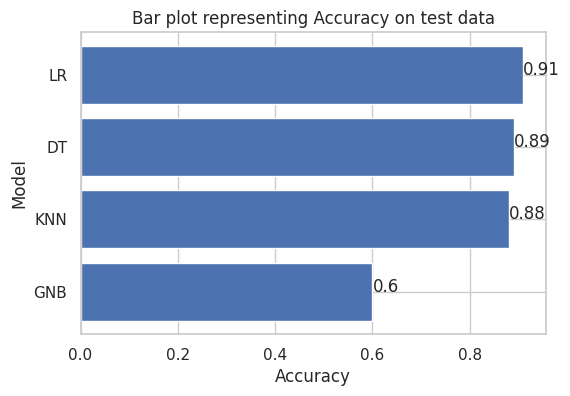

In [136]:
# Visualize the Accuracy on the Test-Result

plt.figure(figsize=[6, 4])
model = ['GNB', 'KNN', 'DT', 'LR']
Accuracy = [accuracy_gnb_test, accuracy_knn_test, accuracy_dt_test, accuracy_logist_test,]
plt.barh(model, Accuracy)
for index, value in enumerate(Accuracy):
    plt.text(value, index, str(value))
plt.title("Bar plot representing Accuracy on test data")
plt.xlabel('Accuracy')
plt.ylabel('Model')
plt.show()

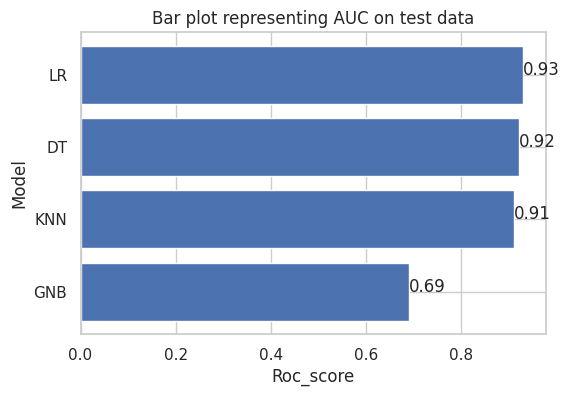

In [137]:
# Visualize AUC on the Test data

plt.figure(figsize=[6, 4])
model = ['GNB', 'KNN', 'DT', 'LR']
roc_score = [gnb_roc_auc_test, knn_roc_auc_test, dt_roc_auc_test, logist_roc_auc_test]
plt.barh(model, roc_score)
for index, value in enumerate(roc_score):
    plt.text(value, index, str(value))
plt.title("Bar plot representing AUC on test data")
plt.xlabel('Roc_score')
plt.ylabel('Model')
plt.show()

In [138]:
# Result table of the black-box models

class_metrics = pd.DataFrame({
    'Models': ['SVM', 'Random Froest', 'Neural Network', 'XGBMBoost'],
    'accuracy_test': [accuracy_svc_test, accuracy_rf_test, accuracy_nn_test, accuracy_xgb_test],
    'recall_test': [recall_svc_test, recall_rf_test, recall_nn_test, recall_xgb_test],
    'precision_test': [precision_svc_test, precision_rf_test, precision_nn_test, precision_xgb_test],
    'f1_test': [f1_score_svc_test, f1_score_rf_test, f1_score_nn_test, f1_score_xgb_test],
    'AUC_test': [svc_roc_auc_test, rf_roc_auc_test, nn_roc_auc_test, xgb_roc_auc_test],    
    })
result_metrics= class_metrics.set_index('Models')

with pd.option_context('display.precision', 3):
    result = result_metrics.sort_values(by='AUC_test', ascending=False).style.\
        background_gradient(cmap='plasma', low=0.43, high=0.63,\
                            subset=['accuracy_test', 'AUC_test']).\
        background_gradient(cmap='viridis', low=0.63, high=0.43,
                            subset=['precision_test'])
result

,accuracy_test,recall_test,precision_test,f1_test,AUC_test
Models,,,,,
Random Froest,0.940,0.940,0.940,0.940,0.950
XGBMBoost,0.930,0.930,0.930,0.930,0.950
SVM,0.920,0.920,0.930,0.920,0.940
Neural Network,0.920,0.920,0.920,0.920,0.940


In [139]:
# Result table of the black-box models on training data

class_metrics = pd.DataFrame({
    'Models': ['SVC', 'Random Froest', 'Neural Network', 'XGBMBoost'],
    'accuracy_train': [accuracy_svc_train, accuracy_rf_train, accuracy_nn_train, accuracy_xgb_train], 
    'recall_train': [recall_svc_train, recall_rf_train, recall_nn_train, recall_xgb_train],  
    'precision_train': [precision_svc_train, precision_rf_train, precision_nn_train, precision_xgb_train],
    'f1_train': [f1_score_svc_train, f1_score_rf_train, f1_score_nn_train, f1_score_xgb_train], 
    'AUC_train': [svc_roc_auc_train, rf_roc_auc_train, nn_roc_auc_train, xgb_roc_auc_train], 
    })
result_metrics= class_metrics.set_index('Models')

with pd.option_context('display.precision', 3):
    result = result_metrics.sort_values(by='AUC_train', ascending=False).style.\
        background_gradient(cmap='plasma', low=0.43, high=0.63,\
                            subset=['accuracy_train', 'AUC_train']).\
        background_gradient(cmap='viridis', low=0.63, high=0.43,
                            subset=['precision_train'])
result

,accuracy_train,recall_train,precision_train,f1_train,AUC_train
Models,,,,,
Random Froest,1.000,1.000,1.000,1.000,1.000
XGBMBoost,0.970,0.970,0.970,0.970,0.980
SVC,0.940,0.940,0.940,0.940,0.960
Neural Network,0.920,0.920,0.920,0.920,0.940


In [140]:
# Result table of the balck-box models for confusion Matrix

Confusion_matrix = pd.DataFrame({
    'Models': ['Random Froest', 'XGBoost', 'SVC', 'Neural Network'],

    'True Positive': [True_positive_rf, True_positive_xgb, True_positive_svc, True_positive_nn],  
    'False Positive': [False_positive_rf, False_positive_xgb, False_positive_svc, False_positive_nn],
    'True Negative': [True_negative_rf, True_negative_xgb, True_negative_svc, True_negative_nn],
    'False Negative': [False_negative_rf, False_negative_xgb, False_negative_svc, False_negative_nn]
    })
confusion_matrix = Confusion_matrix.set_index('Models')
confusion_matrix

,True Positive,False Positive,True Negative,False Negative
Models,,,,
Random Froest,5442,350,11234,350
XGBoost,5380,412,11172,412
SVC,5352,440,11144,440
Neural Network,5317,475,11109,475


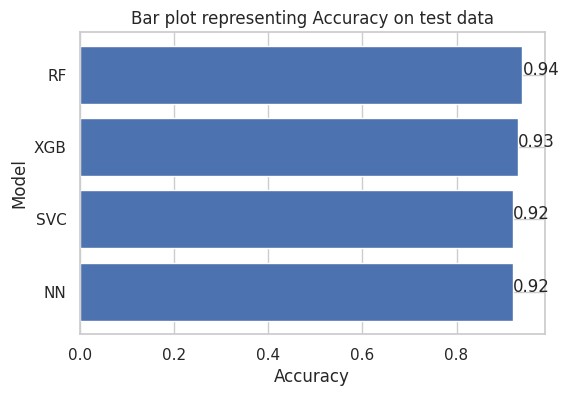

In [141]:
# Visualize the Accuracy on the Test-Result

plt.figure(figsize=[6, 4])
model = ['NN','SVC', 'XGB', 'RF']
Accuracy = [accuracy_nn_test, accuracy_svc_test, accuracy_xgb_test, accuracy_rf_test]
plt.barh(model, Accuracy)
for index, value in enumerate(Accuracy):
    plt.text(value, index, str(value))
plt.title("Bar plot representing Accuracy on test data")
plt.xlabel('Accuracy')
plt.ylabel('Model')
plt.show()

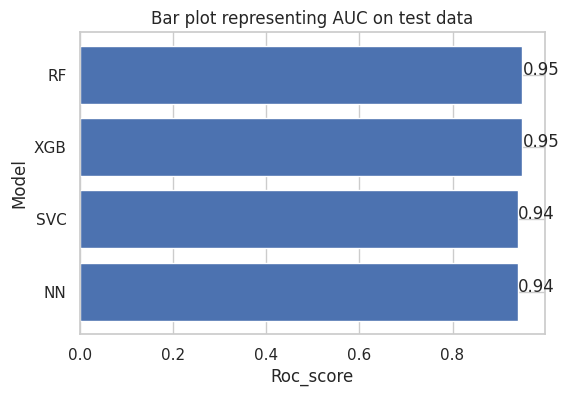

In [142]:
# Visualize AUC on the Test data

plt.figure(figsize=[6, 4])
model = ['NN','SVC', 'XGB', 'RF']
roc_score = [nn_roc_auc_test, svc_roc_auc_test, xgb_roc_auc_test, rf_roc_auc_test]
plt.barh(model, roc_score)
for index, value in enumerate(roc_score):
    plt.text(value, index, str(value))
plt.title("Bar plot representing AUC on test data")
plt.xlabel('Roc_score')
plt.ylabel('Model')
plt.show()

After visualizing the performance of the models, it appears that the Logistic Regression model is the best model in the white-box models category with accuracy of 91% and 93% of AUC on the test data. Concerning the black-box models category, Random-Forest is the best model with an accuracy of 94% and 95% on the test data.

## **Interpretation of the best white-box model (Logistic Rgression model)**


#### Based on the performance of the test data, Logistic Regression (logist_model) is the best white-box model. 

### **Interpretation of Logistic Regression model (logist_model) using coefficients**

In [143]:
# Print the Logistic Regression model parameters: Intercept  

print('Intercept: \n', logist_model.intercept_)

Intercept: 
 [-2.7234037   0.38614158  2.33726212]


In [144]:
# Display the order of the variables associated with each coefficient in each class
X_train.columns

Index(['Household_size', 'Household_Weight', 'Resto_cons', 'Food_cons',
       'Education_cons', 'Phone_fax_ser_cons', 'sum_exp', 'Personal_care_cons',
       'Clothing_cons', 'Footwear_cons', 'Dishes_cons', 'Household_tex_cons',
       'Actual_rents_house_cons', 'Esti_rents_house_cons', 'Beverage_cons'],
      dtype='object')

In [145]:
# Print the Logistic Regression model parameters: the coefficients

print('log_odds Coefficients: \n', logist_model.coef_)
print('')
print('Model classes:\n', logist_model.classes_)

log_odds Coefficients: 
 [[ -66.40225864   -1.03045395    8.21667183   97.89326877   41.03356462
    12.17038154    5.60117107   11.97547555   18.19716266    4.56045737
     2.13438264    1.60691951   22.86600257   43.0449653    18.78781795]
 [   5.59470583   -0.26522215    1.48950626    7.36961368    8.44372176
     1.47226205    2.99572131    1.53968071    2.16597294   -0.79464685
     0.51267689    0.57851129    1.68307041    4.37188514    2.00130791]
 [  60.80755281    1.2956761    -9.7061781  -105.26288244  -49.47728638
   -13.64264358   -8.59689239  -13.51515626  -20.36313559   -3.76581052
    -2.64705953   -2.18543079  -24.54907299  -47.41685044  -20.78912586]]

Model classes:
 [0 1 2]


In [146]:
# Logarithm coefficients for Classe 0

log_odds_coef_0 = logist_model.coef_[0]
log_odds_coef_0

array([-66.40225864,  -1.03045395,   8.21667183,  97.89326877,
        41.03356462,  12.17038154,   5.60117107,  11.97547555,
        18.19716266,   4.56045737,   2.13438264,   1.60691951,
        22.86600257,  43.0449653 ,  18.78781795])

In [147]:
# Put the logarithm coefficients for class 0 into a dataframe

log_coef_classe_0 = pd.DataFrame(log_odds_coef_0, X_train.columns,  columns = ['log_coef_0'])
                            
log_coef_classe_0

,log_coef_0
Household_size,-66.402259
Household_Weight,-1.030454
Resto_cons,8.216672
Food_cons,97.893269
Education_cons,41.033565
Phone_fax_ser_cons,12.170382
sum_exp,5.601171
Personal_care_cons,11.975476
Clothing_cons,18.197163
Footwear_cons,4.560457


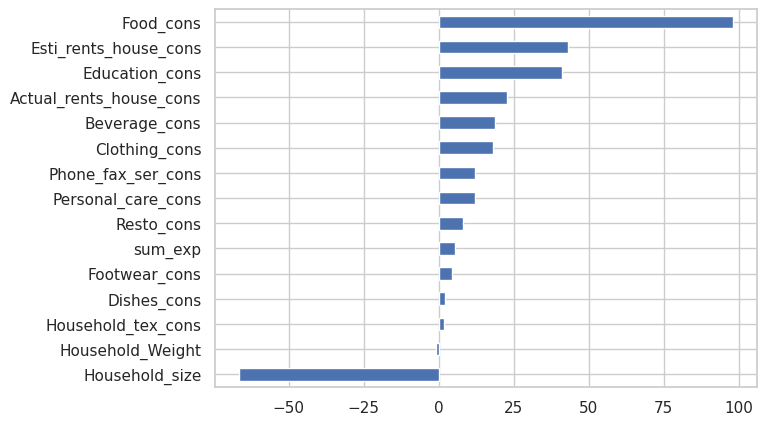

In [148]:
# Bar plot log coeff class 0

log_coef_classe_0 = pd.Series(log_odds_coef_0, X_train.columns)
log_coef_classe_0.sort_values().plot.barh();

In [149]:
# Logarithm coefficients for Classe 1

log_odds_coef_1 = logist_model.coef_[1]
log_odds_coef_1

array([ 5.59470583, -0.26522215,  1.48950626,  7.36961368,  8.44372176,
        1.47226205,  2.99572131,  1.53968071,  2.16597294, -0.79464685,
        0.51267689,  0.57851129,  1.68307041,  4.37188514,  2.00130791])

In [150]:
# Put the logarithm coefficients for class 1 into a dataframe

log_coef_classe_1 = pd.DataFrame(log_odds_coef_1, X_train.columns,  columns = ['log_coef_1'])
                            
log_coef_classe_1

,log_coef_1
Household_size,5.594706
Household_Weight,-0.265222
Resto_cons,1.489506
Food_cons,7.369614
Education_cons,8.443722
Phone_fax_ser_cons,1.472262
sum_exp,2.995721
Personal_care_cons,1.539681
Clothing_cons,2.165973
Footwear_cons,-0.794647


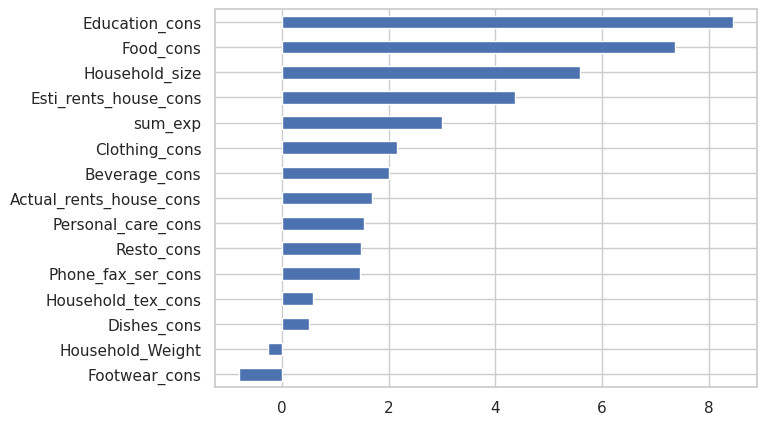

In [151]:
# Bar plot log coeff class 1

log_coef_classe_1 = pd.Series(log_odds_coef_1, X_train.columns)
log_coef_classe_1.sort_values().plot.barh();

In [152]:
# Logarithm coefficients for Classe 2

log_odds_coef_2 = logist_model.coef_[2]
log_odds_coef_2

array([  60.80755281,    1.2956761 ,   -9.7061781 , -105.26288244,
        -49.47728638,  -13.64264358,   -8.59689239,  -13.51515626,
        -20.36313559,   -3.76581052,   -2.64705953,   -2.18543079,
        -24.54907299,  -47.41685044,  -20.78912586])

In [153]:
# Put the logarithm coefficients for class 2 into a dataframe

log_coef_classe_2 = pd.DataFrame(log_odds_coef_2, X_train.columns,  columns = ['log_coef_2'])
                            
log_coef_classe_2

,log_coef_2
Household_size,60.807553
Household_Weight,1.295676
Resto_cons,-9.706178
Food_cons,-105.262882
Education_cons,-49.477286
Phone_fax_ser_cons,-13.642644
sum_exp,-8.596892
Personal_care_cons,-13.515156
Clothing_cons,-20.363136
Footwear_cons,-3.765811


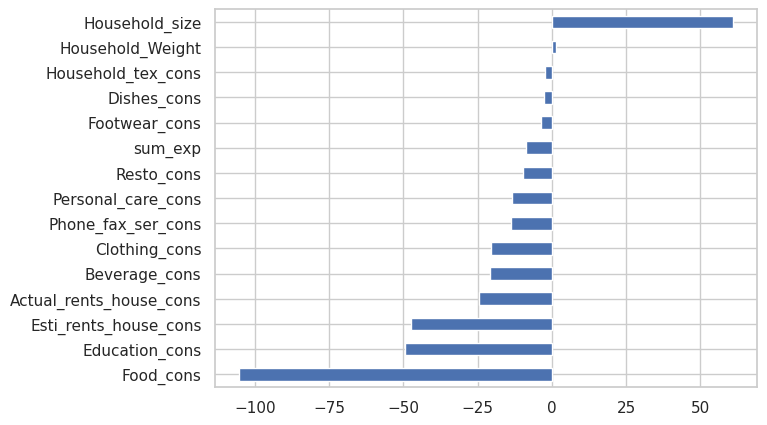

In [154]:
# Bar plot log coeff class 2

log_coef_classe_2 = pd.Series(log_odds_coef_2, X_train.columns)
log_coef_classe_2.sort_values().plot.barh();

In [155]:
# Convert logarithm odds numbers into regular numbers (in exponential): Intercept

print('Exponential Intercept: \n', np.exp(logist_model.intercept_))

Exponential Intercept: 
 [ 0.06565092  1.47129295 10.3528529 ]


In [156]:
# Convert logarithm odds numbers into regular numbers (in exponential): Coefficients

print('Exponential Coefficients: \n', np.exp(logist_model.coef_))
print('')
print('Model classes:\n', logist_model.classes_)

Exponential Coefficients: 
 [[1.45166193e-29 3.56844935e-01 3.70216045e+03 3.26968896e+42
  6.61684083e+17 1.92987662e+05 2.70743282e+02 1.58811867e+05
  7.99700427e+07 9.56272065e+01 8.45182711e+00 4.98742381e+00
  8.52273021e+09 4.94528019e+18 1.44359598e+08]
 [2.68998507e+02 7.67035531e-01 4.43490530e+00 1.58702056e+03
  4.64581343e+03 4.35908445e+00 1.99997808e+01 4.66310115e+00
  8.72308479e+00 4.51740740e-01 1.66975496e+00 1.78338151e+00
  5.38205577e+00 7.91927805e+01 7.39872662e+00]
 [2.56085296e+26 3.65346525e+00 6.09060469e-05 1.92712997e-46
  3.25302609e-22 1.18870797e-06 1.84678813e-04 1.35033714e-06
  1.43351611e-09 2.31488421e-02 7.08592665e-02 1.12429289e-01
  2.18008319e-11 2.55342735e-21 9.36261909e-10]]

Model classes:
 [0 1 2]


In [157]:
# Exponential coefficients of the variables for each class

exp_coef = np.exp(logist_model.coef_).round(4)

# Exponential coefficients for Classe 0 (Non-poor)

exp_coef_0 = exp_coef[0]
exp_coef_0

array([0.00000000e+00, 3.56800000e-01, 3.70216040e+03, 3.26968896e+42,
       6.61684083e+17, 1.92987662e+05, 2.70743300e+02, 1.58811867e+05,
       7.99700427e+07, 9.56272000e+01, 8.45180000e+00, 4.98740000e+00,
       8.52273021e+09, 4.94528019e+18, 1.44359598e+08])

In [158]:
# Put the Exponential coefficients into a dataframe

exp_coef_classe_0 = pd.DataFrame(exp_coef_0, X_train.columns,  columns = ['exp_coef_0'])              
exp_coef_classe_0

,exp_coef_0
Household_size,0.000000e+00
Household_Weight,3.568000e-01
Resto_cons,3.702160e+03
Food_cons,3.269689e+42
Education_cons,6.616841e+17
Phone_fax_ser_cons,1.929877e+05
sum_exp,2.707433e+02
Personal_care_cons,1.588119e+05
Clothing_cons,7.997004e+07
Footwear_cons,9.562720e+01


In [159]:
# Exponential coefficients for Classe 1 (Poor)

exp_coef_1 = exp_coef[1]
exp_coef_1

array([2.6899850e+02, 7.6700000e-01, 4.4349000e+00, 1.5870206e+03,
       4.6458134e+03, 4.3591000e+00, 1.9999800e+01, 4.6631000e+00,
       8.7231000e+00, 4.5170000e-01, 1.6698000e+00, 1.7834000e+00,
       5.3821000e+00, 7.9192800e+01, 7.3987000e+00])

In [160]:
# Put the Exponential coefficients into a dataframe

exp_coef_classe_1 = pd.DataFrame(exp_coef_1, X_train.columns,  columns = ['exp_coef_1'])                         
exp_coef_classe_1

,exp_coef_1
Household_size,268.9985
Household_Weight,0.7670
Resto_cons,4.4349
Food_cons,1587.0206
Education_cons,4645.8134
Phone_fax_ser_cons,4.3591
sum_exp,19.9998
Personal_care_cons,4.6631
Clothing_cons,8.7231
Footwear_cons,0.4517


In [161]:
# Exponential coefficients for Classe 2 (Ultra-poor)

exp_coef_2 = exp_coef[2]
exp_coef_2

array([2.56085296e+26, 3.65350000e+00, 1.00000000e-04, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 2.00000000e-04, 0.00000000e+00,
       0.00000000e+00, 2.31000000e-02, 7.09000000e-02, 1.12400000e-01,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00])

In [162]:
# Put the Exponential coefficients for class 2 into a dataframe

exp_coef_classe_2 = pd.DataFrame(exp_coef_2, X_train.columns,  columns = ['coef_2'])                           
exp_coef_classe_2

,coef_2
Household_size,2.560853e+26
Household_Weight,3.653500e+00
Resto_cons,1.000000e-04
Food_cons,0.000000e+00
Education_cons,0.000000e+00
Phone_fax_ser_cons,0.000000e+00
sum_exp,2.000000e-04
Personal_care_cons,0.000000e+00
Clothing_cons,0.000000e+00
Footwear_cons,2.310000e-02


## **Interpretation of the best black-box model (Random Forest model)**


#### Based on the performance of the test data, Random Forest (rf_model) is the best black-box model. 

### **Interpretability of Random Forest model (rf_model) using IML techniques**

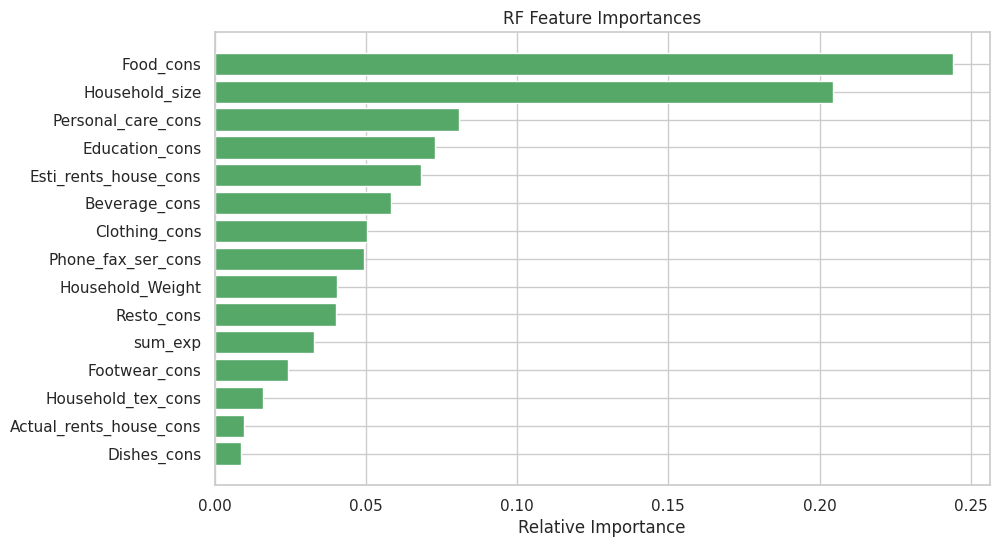

In [163]:
# Features importance for Random Forest model

importances = rf_model.feature_importances_
indices = np.argsort(importances)
features = X_train.columns
plt.figure(figsize=(10,6))
plt.title('RF Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='g', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

We can compare these results to the feature importance calculated by the IML techniques.

In [164]:
# Observation of the RF model prediction
Prediction = pd.DataFrame({'Actual':y_test, 'Predicted':rf_pred})

Prediction.head()

,Actual,Predicted
9937,1,1
5500,0,0
15330,2,2
7284,1,0
13800,2,2


Application of Interpretable Machine Learning (IML) techniques on the best complex Model (black-box model)

Interpretatble Machine Learning Techniques:

1- Local Intrepretation

LIME and SHAP

2- Global Interpretation

PDP/(ICE) and PFI

In [165]:
# Install some Interpretatble machine Learning (IML) Packages 
!pip install shap
!pip install lime
!pip install pdpbox
!pip install ice
!pip install pycebox
!pip install eli5

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 569 kB 7.3 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 275 kB 5.9 MB/s 
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283858 sha256=69d2c21a15725860839e8ce0ba9cbe32d9a897ecfab87026176cad279ab07e5d
  Stored in directory: /root/.cache/pip/wheels/ca/cb/e5/ac701e12d365a08917bf4c6171c0961bc880a8181359c66aa7
Successfully built lime
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 34.0 MB 1.3 MB/s 
     |████████████████████████████████| 13.1 MB 49.0 MB/s 
  Created wheel for pdpbox: filename=PDPbox-0.2.1-py3-none-any.whl size=35758226 sha256=07e1b558ca2441c669047d93b6b6e8598712bb933785683843431256f5f63995
  Stored in directory: /root/.cache/pip

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for ice: filename=ice-0.0.2-py3-none-any.whl size=11666 sha256=3346249c5e5e2770023cb7028f9eed16fab4a9af64200fb17698507a7c39cc4e
  Stored in directory: /root/.cache/pip/wheels/a7/1d/35/34c890bc35a74fd8f6d2b6da7d667f66e735b50cd5455f4d10
Successfully built ice
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for pycebox: filename=pycebox-0.0.1-py3-none-any.whl size=3640 sha256=b9d16709e56c090a7e6265f47df15ffdfd77b4bb061e8403edb6fb201936e4f7
  Stored in directory: /root/.cache/pip/wheels/cc/0d/0a/06236a41d8f5c3485c1057262de55329e227a0c239fd00d0cd
Successfully built pycebox
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 216 kB 6.3 MB/s 
     |████████████████████████████████| 133 kB 48.4 MB/s 
  Created wheel for eli5: fil

## **Local interpretability**

### **Local Interpretable Model-agnostic Explanations (LIME)**

In [166]:
import lime
from lime import lime_tabular

# LIME requires class probabilities in case of classification problem

rf.predict_proba = lambda x: rf_model.predict_proba(x).astype(float)

In [167]:
# Explain the RF model's predictions using LIME technique

# Create the LIME Explainer

class_names= ['Non-poor', 'Poor', 'Ultra-poor']
lime_explainer = lime_tabular.LimeTabularExplainer(training_data = np.array(X_train),
                                              feature_names = X_train.columns,
                                              class_names= class_names,
                                              mode='classification', kernel_width=3,
                                              discretize_continuous = True,
                                              random_state = seed)                                            
lime_explainer

In [168]:
# The Explainer Instance: Let's choose individual number 1

# True and predicted class of the first instance (row=0)
row = 0 
class_names= ['Non-poor', 'Poor', 'Ultra-poor']
print("Prediction for 0-th observation : ", class_names[rf_model.predict(X_test.values[row].reshape(1,-1))[0]])
print("Actual for 0-th observation:", class_names[y_test.values[row]])
print('')

explanation = lime_explainer.explain_instance(X_test.iloc[row], rf.predict_proba,
                                                num_features=5, top_labels=1)

explanation.show_in_notebook(show_table=True)
explanation.save_to_file("objet1.html")

Prediction for 0-th observation :  Poor
Actual for 0-th observation: Poor



In [169]:
# # The Explainer Instance: Let's choose individual number 2

# True and predicted class of the second instance (row=1)
row = 1 
class_names= ['Non-poor', 'Poor', 'Ultra-poor']
print("Prediction for 1-th observation: ", class_names[rf_model.predict(X_test.values[row].reshape(1,-1))[0]])
print("Actual for 1-th oservation:", class_names[y_test.values[row]])
print('')

explanation = lime_explainer.explain_instance(X_test.iloc[row], rf.predict_proba,
                                                num_features=5, top_labels=1)

explanation.show_in_notebook(show_table=True)
explanation.save_to_file("objet2.html")

Prediction for 1-th observation:  Non-poor
Actual for 1-th oservation: Non-poor



In [170]:
# # The Explainer Instance: Let's choose individual number 3

# True and predicted class of the third instance (row=2)
row = 2 
class_names= ['Non-poor', 'Poor', 'Ultra-poor']
print("Prediction for 2-th observation: ", class_names[rf_model.predict(X_test.values[row].reshape(1,-1))[0]])
print("Actual for 2-th observation:", class_names[y_test.values[row]])
print('')

explanation = lime_explainer.explain_instance(X_test.iloc[row], rf.predict_proba,
                                                num_features=5, top_labels=1)

explanation.show_in_notebook(show_table=True)
explanation.save_to_file("objet3.html")

Prediction for 2-th observation:  Ultra-poor
Actual for 2-th observation: Ultra-poor



In [171]:
import shap 

## Create object that can calculate shap values

# Fits the explainer
shap_explainer = shap.TreeExplainer(rf_model, random_state = seed) # We select TreeExplainer here since RF is a tree-based model.
                                
# Calculates the SHAP values 
shap_values = shap_explainer.shap_values(X_test)

shap_values

[array([[-0.1179085 , -0.00722243, -0.0146643 , ..., -0.00581534,
         -0.02941021,  0.03780915],
        [-0.05203572,  0.01362326, -0.00819403, ...,  0.04117396,
          0.02029506,  0.01408937],
        [-0.08045787,  0.01398615, -0.01304023, ..., -0.00342779,
          0.00068692, -0.03338543],
        ...,
        [ 0.02523142, -0.00680434, -0.01911108, ..., -0.00502182,
         -0.0281516 , -0.04242672],
        [-0.15638302,  0.00067001, -0.01171435, ..., -0.0047474 ,
         -0.00317933, -0.03437335],
        [ 0.15774322, -0.00692351, -0.00997517, ..., -0.00376496,
         -0.01968331,  0.10386563]]),
 array([[ 1.34103622e-01,  1.87700784e-02, -2.58160395e-03, ...,
          3.54670343e-03,  1.35443328e-02,  1.49082739e-02],
        [ 2.02866227e-02, -7.03322888e-03,  2.64438055e-03, ...,
         -1.50142846e-02, -1.76839139e-02,  4.94152588e-03],
        [-2.64342378e-02, -4.77319589e-03, -2.96896432e-02, ...,
         -4.95329984e-04,  3.30086255e-02, -7.14519379e-

In [172]:
print(f'Shape of test dataset: {X_test.shape}')
print(f'Type of shap_values: {type(shap_values)}. Length of the list: {len(shap_values)}')
print(f'Shape of shap_values: {np.array(shap_values).shape}')
print(f'Base value is stored as an attribute of the explainer object: {shap_explainer.expected_value}')

Shape of test dataset: (5792, 15)
Type of shap_values: <class 'list'>. Length of the list: 3
Shape of shap_values: (3, 5792, 15)
Base value is stored as an attribute of the explainer object: [0.3334931  0.33290807 0.33359883]


In [173]:
## Explaining a single prediction
# Let's expalin the RF model's prediction of the 5th instance (row=4) in the testset for class 0 

# True and predicted class of the fifth instance (row=4)
row = 4
class_names= ['Non-poor', 'Poor', 'Ultra-poor']
print("Prediction for 5-th observation: ", class_names[rf_model.predict(X_test.values[row].reshape(1,-1))[0]])
print("Actual for 5-th observation:", class_names[y_test.values[row]])
print('')

shap.initjs()
shap.force_plot(shap_explainer.expected_value[0],
                shap_values[0][row],
                X_test_.values[row], 
                feature_names = X_test_.columns)

Prediction for 5-th observation:  Ultra-poor
Actual for 5-th observation: Ultra-poor



In [174]:
# Let's expalin the RF model's prediction of the 5th instance (row=4) in the testset for class 1 

row = 4
shap.initjs()
shap.force_plot(shap_explainer.expected_value[1],
                shap_values[1][row],
                X_test_.values[row], 
                feature_names = X_test_.columns)

In [175]:
# Let's expalin the RF model's prediction of the 5th instance (row=4) in the testset for class 2 

row = 4

shap.initjs()
shap.force_plot(shap_explainer.expected_value[2],
                shap_values[2][row],
                X_test_.values[row], 
                feature_names = X_test_.columns)

In [176]:
# Explanation of predictions for more than one sample (first 2000 records) in test set. 

shap.initjs()
shap.force_plot(shap_explainer.expected_value[1],
                shap_values[1][:2000,:],
                features = X_test.iloc[:2000, :],
                feature_names = X_test.columns,
               link="identity")

Below we have generated a force plot for 2000 samples of test dataset and have used the shap and the expected value of the only class 1 (poor).

Prediction for 7-th observation:  Poor
Actual for 7-th observation: Poor

-----------------------------------------------------------------------------Non-poor----------------------------------------------------------------------------------


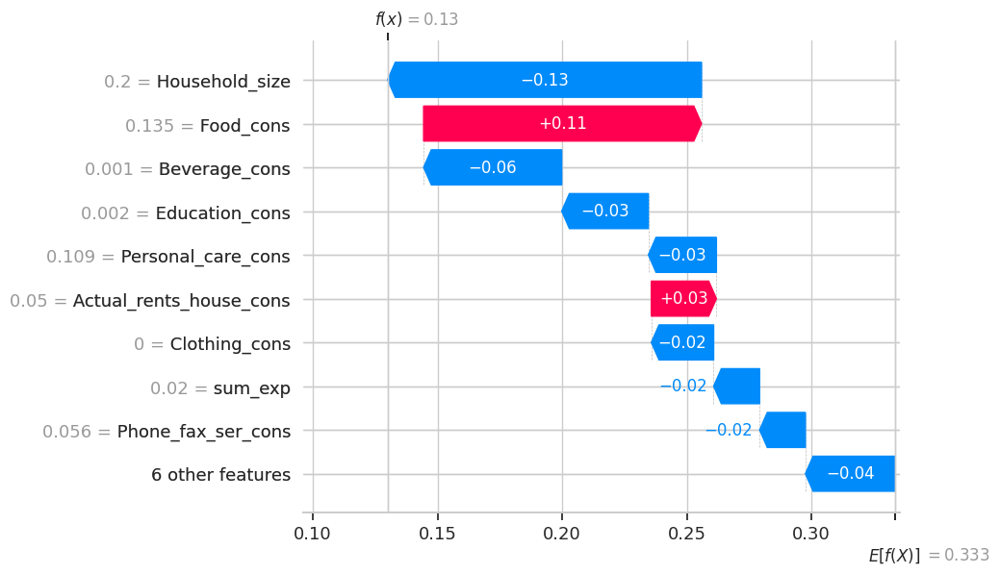

-------------------------------------------------------------------------------Poor------------------------------------------------------------------------------------


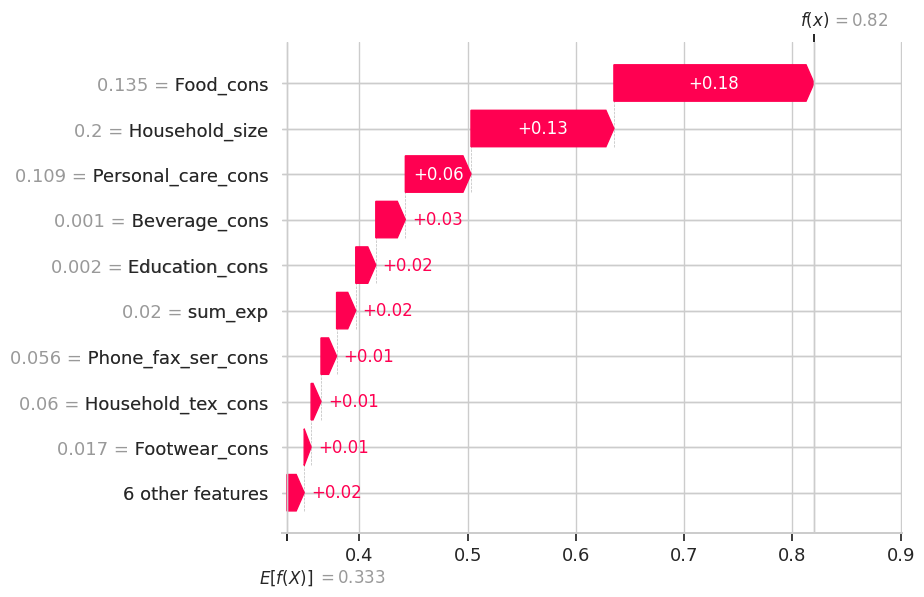

-----------------------------------------------------------------------------Ultra-poor--------------------------------------------------------------------------------


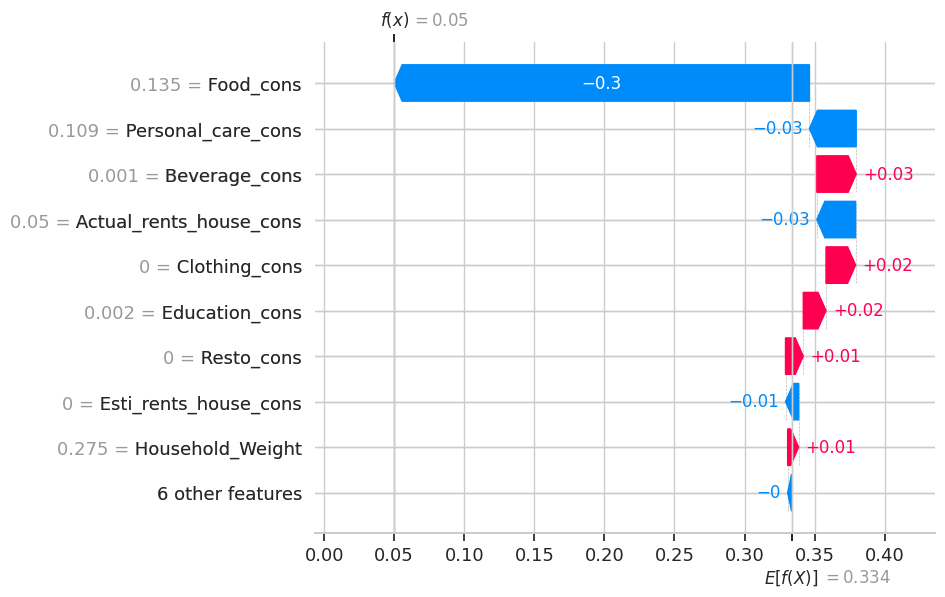

In [177]:
# Waterfall of the 7th instance (row=6) for all classes (0,1,2)

# True and predicted class of the seventh instance (row=6)
row = 6
class_names= ['Non-poor', 'Poor', 'Ultra-poor']
print("Prediction for 7-th observation: ", class_names[rf_model.predict(X_test.values[row].reshape(1,-1))[0]])
print("Actual for 7-th observation:", class_names[y_test.values[row]])
print('')

print('-----------------------------------------------------------------------------Non-poor----------------------------------------------------------------------------------')
shap.waterfall_plot(shap.Explanation(values=shap_values[0][row], base_values = shap_explainer.expected_value[0], data=X_test.iloc[row],feature_names = X_test.columns.tolist()))
print('-------------------------------------------------------------------------------Poor------------------------------------------------------------------------------------')
shap.waterfall_plot(shap.Explanation(values=shap_values[1][row], base_values = shap_explainer.expected_value[1], data=X_test.iloc[row],feature_names = X_test.columns.tolist()))
print('-----------------------------------------------------------------------------Ultra-poor--------------------------------------------------------------------------------')
shap.waterfall_plot(shap.Explanation(values=shap_values[2][row], base_values = shap_explainer.expected_value[2], data=X_test.iloc[row],feature_names = X_test.columns.tolist()))


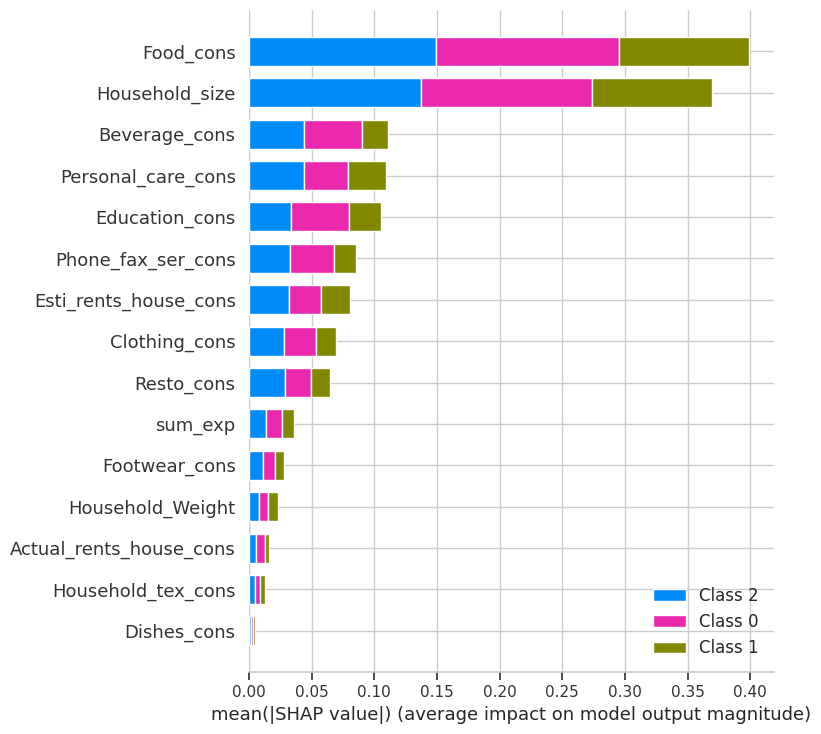

In [178]:
# SHAP Summary Plots
shap.summary_plot(shap_values, plot_type="bar", features=X_test)

We can also generate the above plot for just the class of our interest as below.

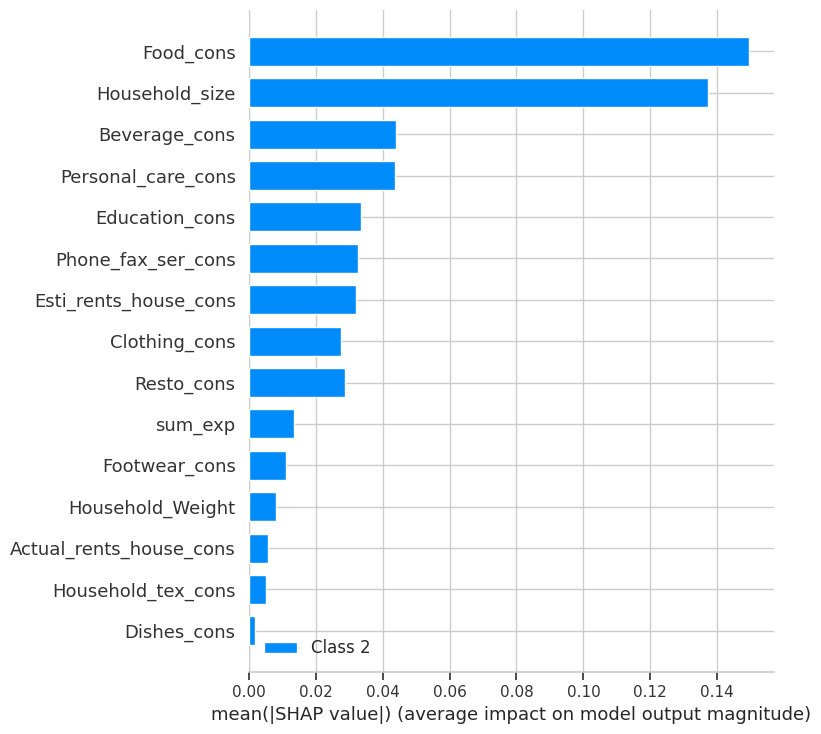

In [179]:
# SHAP Summary Plots for class 2
shap.summary_plot(shap_values, features=X_test, class_inds = [2])

---------------------------------Non-poor-----------------------------------------


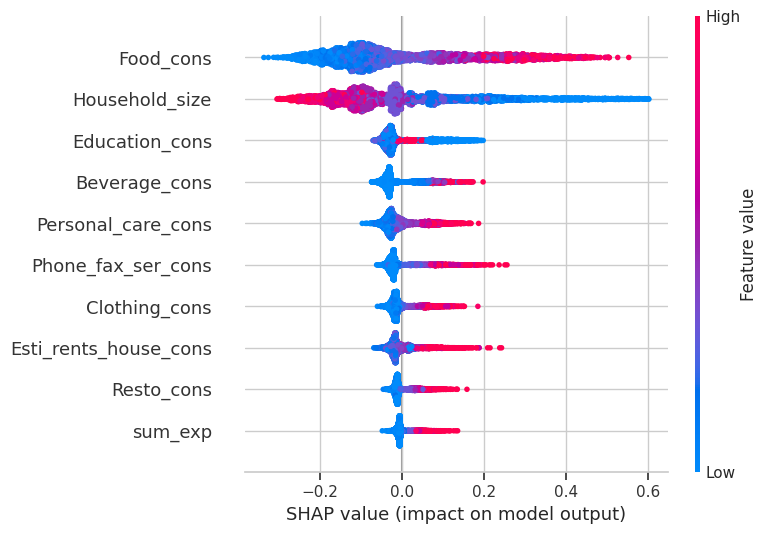

---------------------------------Poor---------------------------------------------


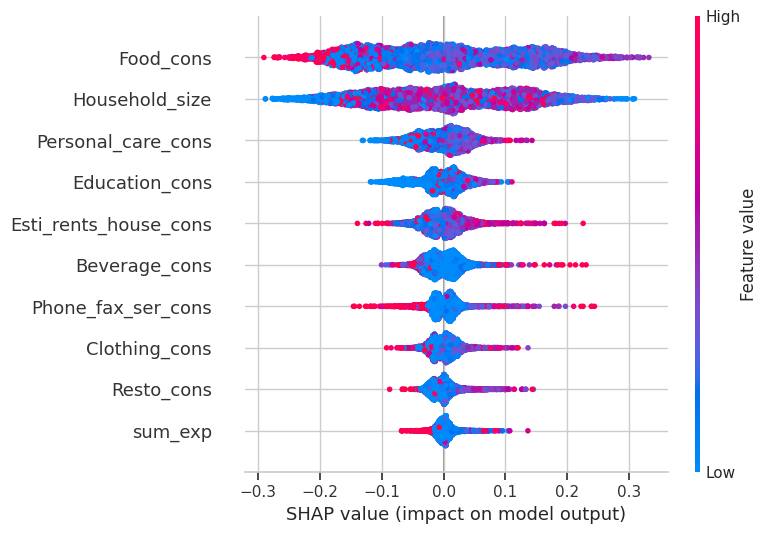

------------------------------------Ultra-poor------------------------------------


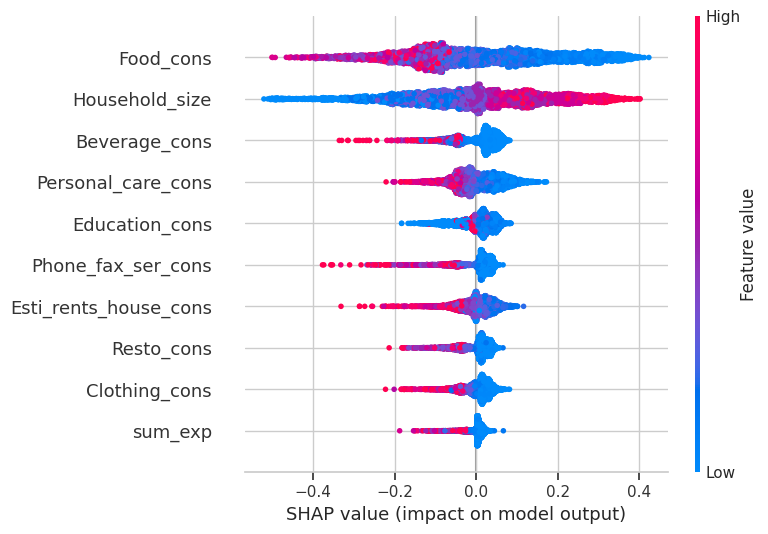

In [180]:
#analysis of the global effect of the features on the model output
# summarize the effects of all the features

print('---------------------------------Non-poor-----------------------------------------')
shap.summary_plot(shap_values[0], X_test, feature_names = X_test.columns, max_display = 10)
print('---------------------------------Poor---------------------------------------------')
shap.summary_plot(shap_values[1], X_test, feature_names = X_test.columns, max_display = 10)
print('------------------------------------Ultra-poor------------------------------------')
shap.summary_plot(shap_values[2], X_test, feature_names = X_test.columns, max_display = 10)

## **Global interpretability**

### **Partial Dependence Plots (PDP) and Individual Conditional Expectation (ICE) plots**

In [181]:
# Look at the indexes of the variables
X_train.columns

Index(['Household_size', 'Household_Weight', 'Resto_cons', 'Food_cons',
       'Education_cons', 'Phone_fax_ser_cons', 'sum_exp', 'Personal_care_cons',
       'Clothing_cons', 'Footwear_cons', 'Dishes_cons', 'Household_tex_cons',
       'Actual_rents_house_cons', 'Esti_rents_house_cons', 'Beverage_cons'],
      dtype='object')

In [182]:
# Selection of the 3 top important variables of the RF model that we want to make their PDP/ICE plots
# According to the importance of the RF model the three most important variables are: 'Food_cons', 'Household_size',
#'Personal_care_cons', 'Education_cons', 'Esti_rents_house_cons', 'Beverage_cons'

imp_features = [X_train.columns[3], X_train.columns[0], X_train.columns[7],
                X_train.columns[4], X_train.columns[13], X_train.columns[14]]

imp_X = X_train[imp_features] 
print(imp_features)

['Food_cons', 'Household_size', 'Personal_care_cons', 'Education_cons', 'Esti_rents_house_cons', 'Beverage_cons']


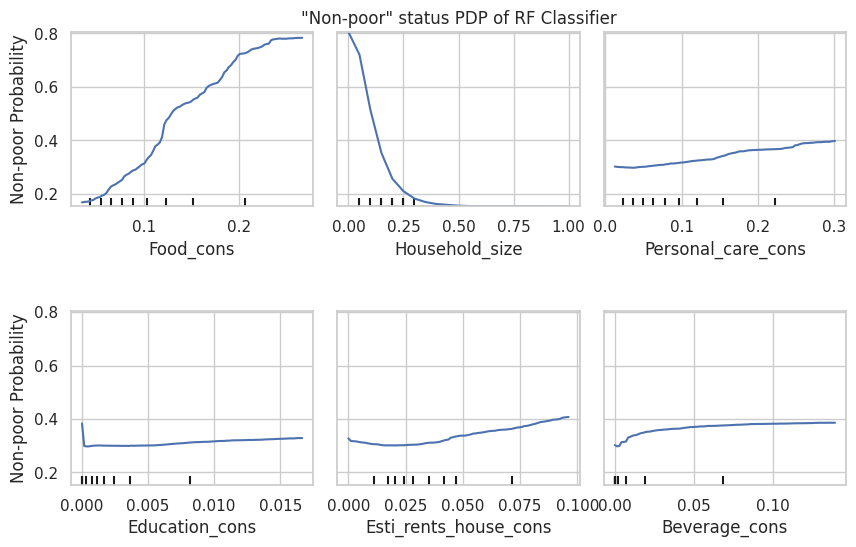

In [183]:
from pycebox.ice import ice, ice_plot
from sklearn.inspection import plot_partial_dependence
from sklearn.inspection import PartialDependenceDisplay

# Visualisation of the partial dependency between the target variable and the 6 top important variables of the RF model class 0

plt.rcParams['font.size'] = 12 
fig, ax = plt.subplots(figsize=(10, 6)) 
fig.subplots_adjust(hspace=0.6, wspace=0.1) 
ax.set_title('"Non-poor" status PDP of RF Classifier') 
disp_RFC = plot_partial_dependence(rf_model, X_train, imp_features, target = 0, ax=ax) 

for i in range(disp_RFC.lines_.shape[0]):
  disp_RFC.axes_[i, 0].set_ylabel('Non-poor Probability') 

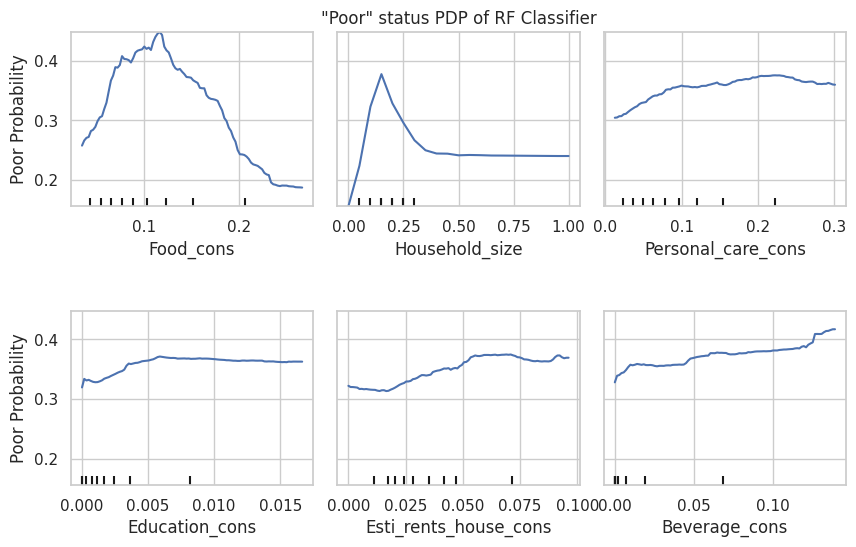

In [184]:
# Visualisation of the partial dependency between the target variable and the 6 top important variables of the RF model class 1

plt.rcParams['font.size'] = 12 
fig, ax = plt.subplots(figsize=(10, 6)) 
fig.subplots_adjust(hspace=0.6, wspace=0.1) 
ax.set_title('"Poor" status PDP of RF Classifier') 
disp_RFC = plot_partial_dependence(rf_model, X_train, imp_features, target = 1, ax=ax) 

for i in range(disp_RFC.lines_.shape[0]):
  disp_RFC.axes_[i, 0].set_ylabel('Poor Probability')

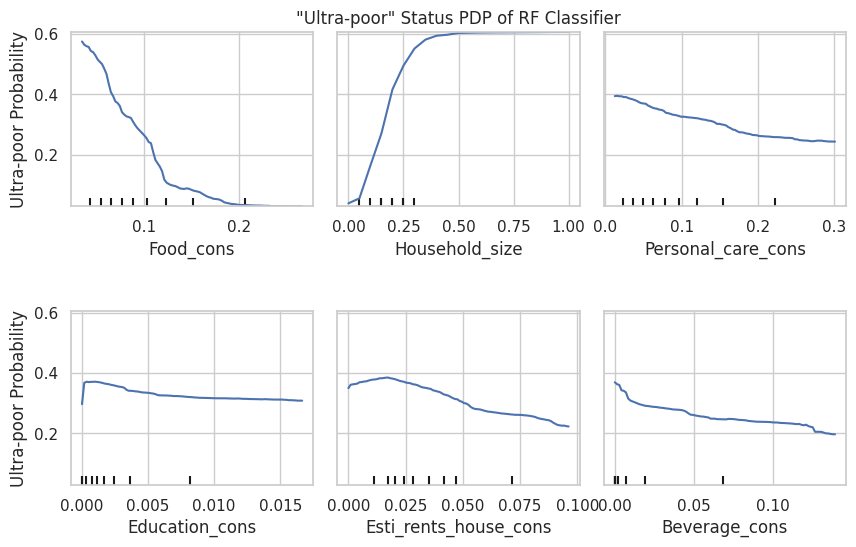

In [185]:
# Visualisation of the partial dependency between the target variable and the 6 top important variables of the RF model class 2

plt.rcParams['font.size'] = 12 
fig, ax = plt.subplots(figsize=(10, 6)) 
fig.subplots_adjust(hspace=0.6, wspace=0.1) 
ax.set_title('"Ultra-poor" Status PDP of RF Classifier') 
disp_RFC = plot_partial_dependence(rf_model, X_train, imp_features, target = 2, ax=ax) 
for i in range(disp_RFC.lines_.shape[0]):
  disp_RFC.axes_[i, 0].set_ylabel('Ultra-poor Probability')

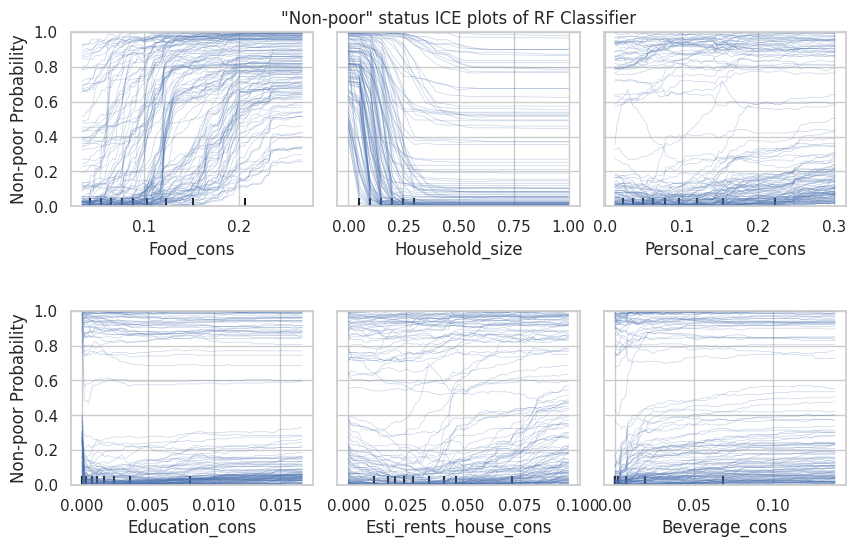

In [186]:
# Visualisation of the ICE plot between the target variable and the 6 top important variables of the RF model class 0

fig, ax = plt.subplots(figsize=(10, 6)) 
fig.subplots_adjust(hspace=0.6, wspace=0.1) 
ax.set_title('"Non-poor" status ICE plots of RF Classifier') 
disp_RFC = plot_partial_dependence(rf_model, X_train, imp_features, target = 0, ax=ax, kind='individual', subsample=0.01) 

for i in range(disp_RFC.lines_.shape[0]):
  disp_RFC.axes_[i, 0].set_ylabel('Non-poor Probability') 

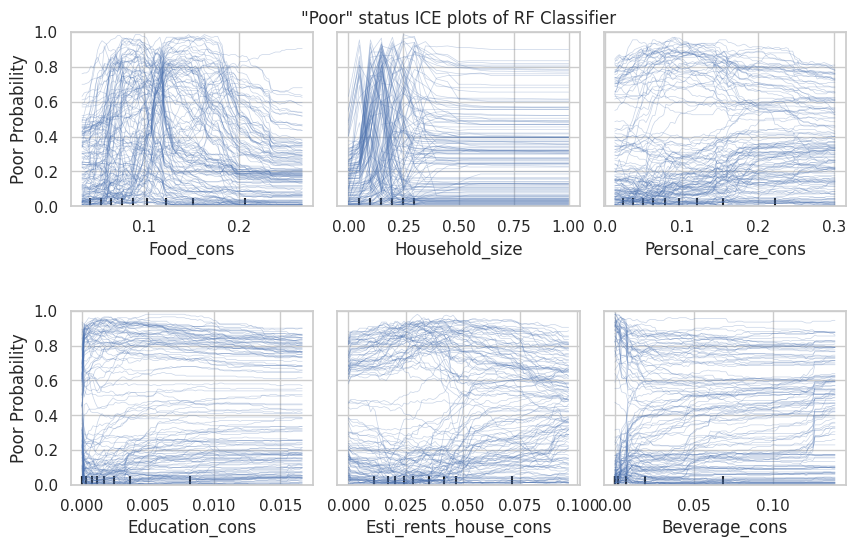

In [187]:
# Visualisation of the ICE plot between the target variable and the 6 top important variables of the RF model class 1

fig, ax = plt.subplots(figsize=(10, 6)) 
fig.subplots_adjust(hspace=0.6, wspace=0.1) 
ax.set_title('"Poor" status ICE plots of RF Classifier') 
disp_RFC = plot_partial_dependence(rf_model, X_train, imp_features, target = 1, ax=ax, kind='individual', subsample=0.01) 

for i in range(disp_RFC.lines_.shape[0]):
  disp_RFC.axes_[i, 0].set_ylabel('Poor Probability') 

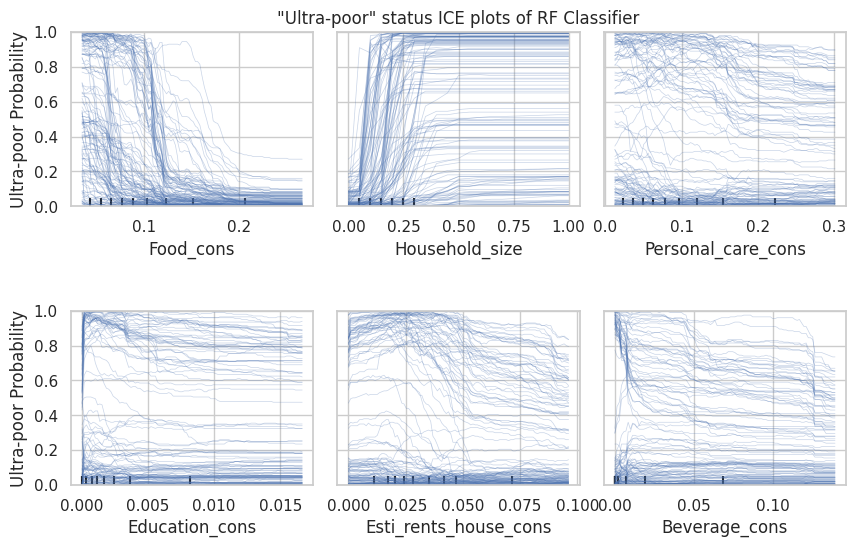

In [188]:
# Visualisation of the ICE plot between the target variable and the 6 top important variables of the RF model class 2

fig, ax = plt.subplots(figsize=(10, 6)) 
fig.subplots_adjust(hspace=0.6, wspace=0.1) 
ax.set_title('"Ultra-poor" status ICE plots of RF Classifier') 
disp_RFC = plot_partial_dependence(rf_model, X_train, imp_features, target = 2, ax=ax, kind='individual', subsample=0.01) 

for i in range(disp_RFC.lines_.shape[0]):
  disp_RFC.axes_[i, 0].set_ylabel('Ultra-poor Probability') 

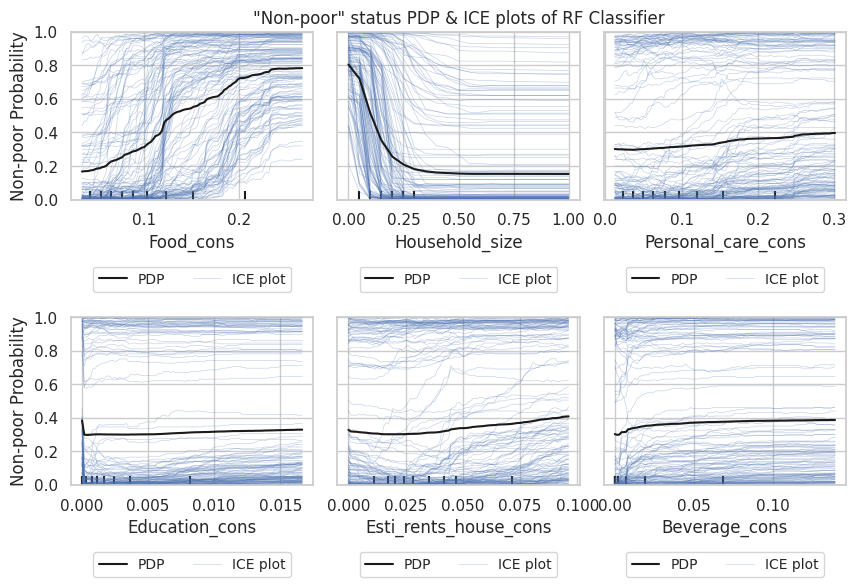

In [189]:
# Rawing both plots (PDP and ICE) by changing the parameter to kind='both' for class 0

fig, ax = plt.subplots(figsize=(10, 6))
fig.subplots_adjust(hspace=0.7, wspace=0.1)
ax.set_title('"Non-poor" status PDP & ICE plots of RF Classifier')
disp = plot_partial_dependence(rf_model, X_train, imp_X.columns, target = 0, ax=ax, kind='both', subsample=0.01)
for i in range(disp.lines_.shape[0]):
  for j in range(disp.lines_.shape[1]):
    if disp.lines_[i,j,-1] != None:
      disp.lines_[i,j,-1].set_color('0.1')
      disp.axes_[i, j].legend(loc='upper center', bbox_to_anchor=(0.5, -0.4), borderaxespad=0, ncol=2, 
                              fontsize=10, labels=['PDP', 'ICE plot'], handles=[disp.lines_[i,j,-1], disp.lines_[i,j,0]])
    if j==0:
      disp.axes_[i, j].set_ylabel('Non-poor Probability')

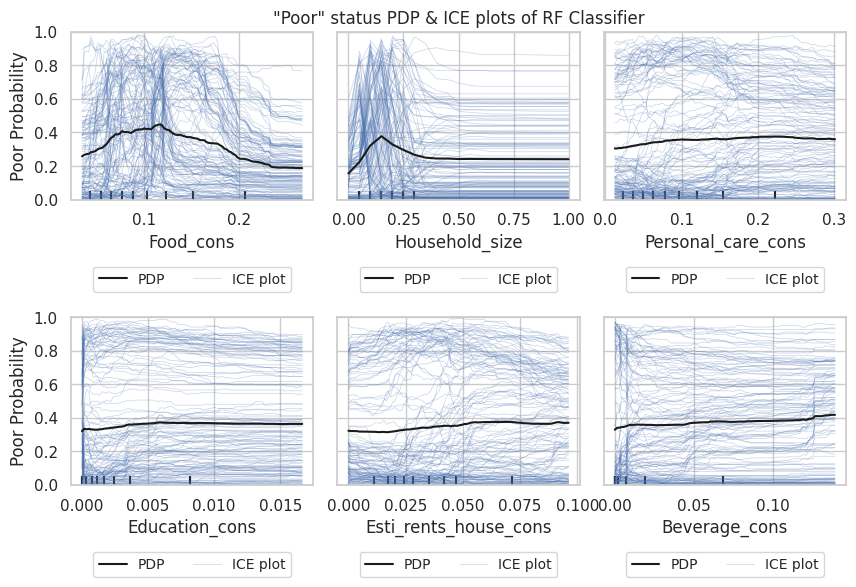

In [190]:
# Rawing both plots (PDP and ICE) by changing the parameter to kind='both' for class 1

fig, ax = plt.subplots(figsize=(10, 6))
fig.subplots_adjust(hspace=0.7, wspace=0.1)
ax.set_title('"Poor" status PDP & ICE plots of RF Classifier')
disp = plot_partial_dependence(rf_model, X_train, imp_X.columns, target = 1, ax=ax, kind='both', subsample=0.01)
for i in range(disp.lines_.shape[0]):
  for j in range(disp.lines_.shape[1]):
    if disp.lines_[i,j,-1] != None:
      disp.lines_[i,j,-1].set_color('0.1')
      disp.axes_[i, j].legend(loc='upper center', bbox_to_anchor=(0.5, -0.4), borderaxespad=0, ncol=2, 
                              fontsize=10, labels=['PDP', 'ICE plot'], handles=[disp.lines_[i,j,-1], disp.lines_[i,j,0]])
    if j==0:
      disp.axes_[i, j].set_ylabel('Poor Probability')

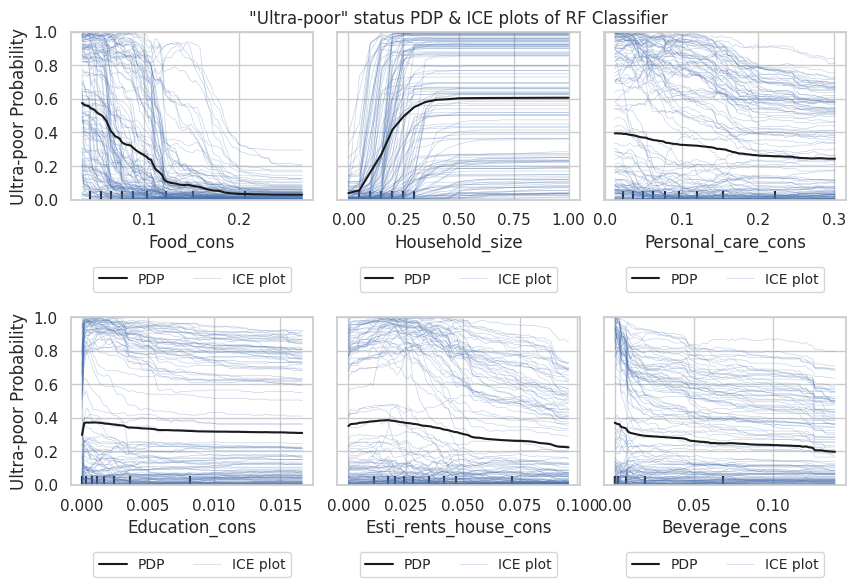

In [191]:
# Rawing both plots (PDP and ICE) by changing the parameter to kind='both' for class 2

fig, ax = plt.subplots(figsize=(10, 6))
fig.subplots_adjust(hspace=0.7, wspace=0.1)
ax.set_title('"Ultra-poor" status PDP & ICE plots of RF Classifier')
disp = plot_partial_dependence(rf_model, X_train, imp_X.columns, target = 2, ax=ax, kind='both', subsample=0.01)
for i in range(disp.lines_.shape[0]):
  for j in range(disp.lines_.shape[1]):
    if disp.lines_[i,j,-1] != None:
      disp.lines_[i,j,-1].set_color('0.1')
      disp.axes_[i, j].legend(loc='upper center', bbox_to_anchor=(0.5, -0.4), borderaxespad=0, ncol=2, 
                              fontsize=10, labels=['PDP', 'ICE plot'], handles=[disp.lines_[i,j,-1], disp.lines_[i,j,0]])
    if j==0:
      disp.axes_[i, j].set_ylabel('Ultra-poor Probability')

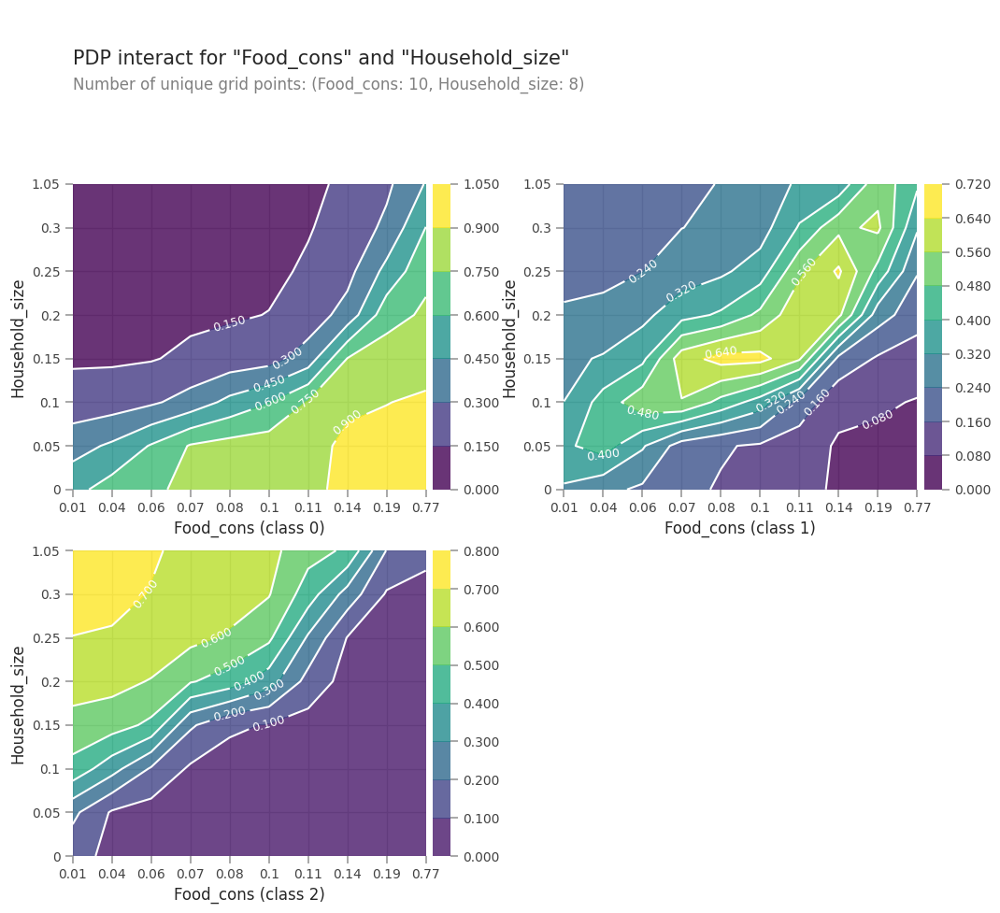

In [192]:
from pdpbox import pdp, info_plots

# Interaction between two variables: Food_cons and Household_size
# target distribution through feature combination of 'Food_cons ' and 'Household_size'

pdp_Food_Hou = pdp.pdp_interact(
    model = rf_model,\
    dataset = pd.concat((X_test, y_test), axis=1),\
    model_features=X_test.columns, features=['Food_cons','Household_size'],\
    n_jobs=-1
)
fig, axes = pdp.pdp_interact_plot(
    pdp_interact_out=pdp_Food_Hou,\
    plot_type='contour', x_quantile=True,\
    ncols=2, figsize=(12,12),\
    feature_names=['Food_cons','Household_size'])

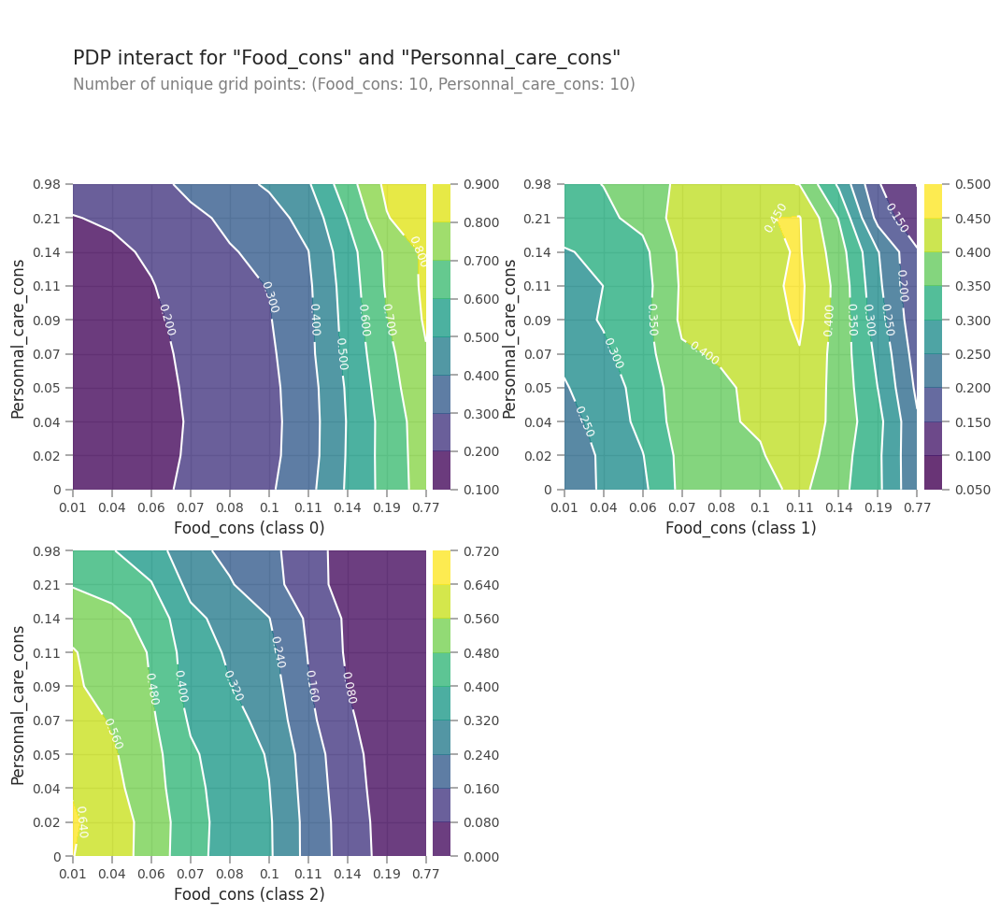

In [193]:
from pdpbox import pdp, info_plots

# Interaction between two variables: Food_cons and Household_size
# target distribution through feature combination of 'Food_cons ' and 'Household_size'

pdp_Food_Hou = pdp.pdp_interact(
    model = rf_model,\
    dataset = pd.concat((X_test, y_test), axis=1),\
    model_features=X_test.columns, features=['Food_cons','Personal_care_cons'],\
    n_jobs=-1
)
fig, axes = pdp.pdp_interact_plot(
    pdp_interact_out=pdp_Food_Hou,\
    plot_type='contour', x_quantile=True,\
    ncols=2, figsize=(12,12),\
    feature_names=['Food_cons','Personnal_care_cons'])

### **Permutation feature Importance (PFI)**

In [194]:
import eli5
from eli5.sklearn import PermutationImportance

## Creating a function to do and visualize permutation importance

def permutation(X_train, y_train, X_test, y_test):
  # Intanstiating the permutation library with parameters
  # Scoring parameters possible
  permuter = PermutationImportance(estimator = rf_model,
                                   scoring = 'accuracy',
                                   n_iter = 10,
                                   random_state = seed)
  # Fitting the permuter on the test data
  permuter.fit(X_test, y_test)
  
  # Getting and plotting the graph from the permuter calculations
  # We are computing the importance using the test set. 
  # In tis case X_test contains all the features for the test set and y_test contains the target column 'Target'

  columns = X_test.columns.to_list() 
  feature_importance = permuter.feature_importances_

  pd.Series(feature_importance, columns).sort_values(ascending=False)

  metric = eli5.show_weights(
      estimator = permuter,
      top = None, # Show all features and not only just the top ones
      feature_names = columns)
  
  return metric

In [195]:
# You are choosing 'accuracy' as scoring metrics from sklearn.metrics.SCORERS.keys() for permutation importance.
# rf is the model that was fitted 

permuter = PermutationImportance(rf_model, scoring='accuracy', n_iter = 10, random_state=seed)

# we are computing the importance using the test set.
permuter.fit(X_test, y_test)

# Show the permutation result from eli5
eli5.show_weights(permuter, feature_names = X_test.columns.tolist(), top = None)

Weight,Feature
0.3643 ± 0.0109,Household_size
0.3543 ± 0.0111,Food_cons
0.0451 ± 0.0046,Phone_fax_ser_cons
0.0396 ± 0.0045,Esti_rents_house_cons
0.0353 ± 0.0065,Beverage_cons
0.0348 ± 0.0050,Personal_care_cons
0.0243 ± 0.0039,Clothing_cons
0.0212 ± 0.0033,Resto_cons
0.0182 ± 0.0031,Education_cons
0.0107 ± 0.0040,sum_exp


In [196]:
# Get the same data in a data frame format
columns = X_test.columns.to_list()
importance = eli5.explain_weights_df(permuter, feature_names=columns)
importance

,feature,weight,std
0,Household_size,0.364347,0.005444
1,Food_cons,0.354282,0.005568
2,Phone_fax_ser_cons,0.045131,0.002299
3,Esti_rents_house_cons,0.039572,0.002232
4,Beverage_cons,0.035273,0.003265
5,Personal_care_cons,0.034841,0.002487
6,Clothing_cons,0.024309,0.001958
7,Resto_cons,0.021219,0.001669
8,Education_cons,0.018215,0.001566
9,sum_exp,0.010687,0.002007


In [197]:
# See the data in a graph and compariong with Importance graph before permutation

# Importance of functionality before Permutation
rf_imp = pd.DataFrame({'feature':X_train.columns.values.tolist(),\
                        'importance': rf_model.feature_importances_}).\
            sort_values(by='importance', ascending=False)

# Ranking of each feature according to its importance

rf_rank = pd.DataFrame({'rf_rank':\
                           rf_imp['importance'].\
                           rank(method='first',\
                                ascending=False).astype(int)})

ranks_rf = pd.concat((rf_imp, rf_rank), axis=1)

Text(0.5, 1.0, 'Permutaion Feature Importance')

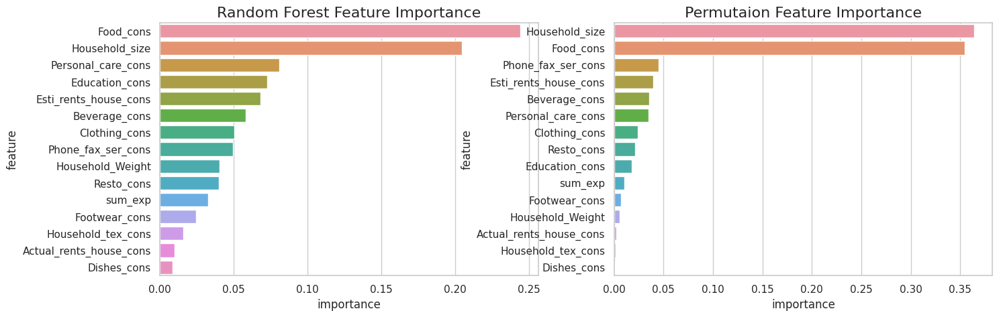

In [198]:
# Store Random-forest feature importance details before permutation in the dataframe 

rf_feature_importance_df = pd.DataFrame()
rf_feature_importance_df["feature"] = X_train.columns.to_list()
rf_feature_importance_df["importance"] = rf_model.feature_importances_

# Store Random-forest Permutaion feature importance details after permutation in the dataframe 

perm_imp_df = pd.DataFrame()
perm_imp_df["feature"] = X_test.columns.to_list()
perm_imp_df["importance"] = permuter.feature_importances_

# Plot RF importance graph before Permutation

fig, axes = plt.subplots(1, 2, figsize=(16,5))
plt.rcParams.update({'font.size': 16})
feature_importance = rf_feature_importance_df.sort_values('importance', ascending=False).reset_index()
sns.barplot(x ='importance', y ='feature', data= feature_importance, ax=axes[0])
axes[0].set_title("Random Forest Feature Importance", fontsize=16)

# Plot RF importance graph after Permutation

perm_feature_importance = perm_imp_df.sort_values('importance', ascending=False).reset_index()
sns.barplot(x ='importance', y ='feature', data= perm_feature_importance, ax=axes[1])
axes[1].set_title("Permutaion Feature Importance", fontsize=16)

# **References**

https://github.com/davidvalerosancho/Multidimensional-Poverty-Predictor

https://www.datasklr.com/logistic-regression/multinomial-logistic-regression

https://github.com/scikit-learn/scikit-learn/blob/main/examples/model_selection/plot_roc.py

https://coderzcolumn.com/tutorials/machine-learning/how-to-use-lime-to-understand-sklearn-models-predictions

https://coderzcolumn.com/tutorials/machine-learning/how-to-use-lime-to-understand-sklearn-models-predictions

https://coderzcolumn.com/tutorials/machine-learning/shap-explain-machine-learning-model-predictions-using-game-theoretic-approach

https://github.com/Iditc/Posts-on-Medium/blob/main/Explainable%20AI/Explainable%20AI%20(XAI)%20with%20SHAP_MultiClass%20Classification%20Problem.ipynb

https://www.kdnuggets.com/2019/12/interpretability-part-3-lime-shap.html

https://www.kdnuggets.com/2019/12/interpretability-black-box-part-2.html

https://github.com/slundberg/shap

https://hacarus.com/ai-lab/20211206-ai-visualization/


https://github.com/SauceCat/PDPbox/blob/master/tutorials/pdpbox_multiclass_classification.ipynb

https://christophm.github.io/interpretable-ml-book/pdp.html

https://github.com/SauceCat/PDPbox

https://christophm.github.io/interpretable-ml-book/feature-importance.html
https://github.com/SirWilliam254/Feature-Importance/blob/b199b292db0dd6ad21182d345feb512cec8d931c/feat_importance.ipynb
https://santiagof.medium.com/model-interpretability-making-your-model-confess-feature-importance-34993e001d99

https://github.com/CDAC-lab/BUS5PR1-Analytics-Notebooks/blob/master/5_Explainable_AI.ipynb

https://hacarus.com/ai-lab/20211206-ai-visualization/

https://github.com/mayur29/Machine-Learning-Model-Interpretation
